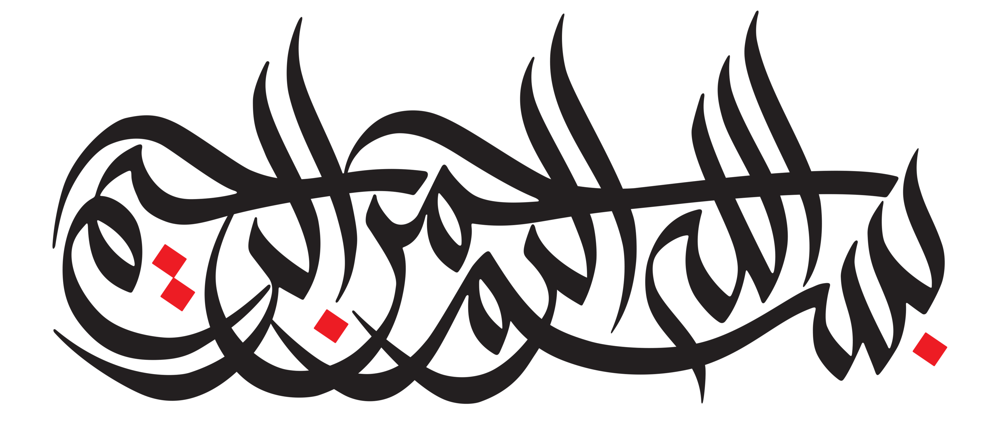

# Context

This dataset contains abstracts of the accidents and injuries of construction workers from 2015-2017. There is some structured data around the unstructured text abstracts, such as Degree of Injury, Body Part(s) Affected, and Construction End Use.

**What trends do we see in injuries in terms of time of day?**

**What is the reason injuries are occurring?**

**Which factors have the greatest impact on a construction accident?**

**How accurately do machine learning models predict accidents and injuries in the construction industry?**

## Import Libraries For Overview & EDA

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import sweetviz as sv
from category_encoders.hashing import HashingEncoder

## Get The Dataset

In [2]:
data = pd.read_csv('E:\IUST\ترم 8\ایمنی و بهداشت صنعتی\پروژه\حوادث و آسیب های کارکنان ساختمانی\OSHA accidents and injuries of construction workers\\OSHA HSE DATA.csv')

## Overview Of The Dataset

In [3]:
data.head()

,summary_nr,Event Date,Abstract Text,Event Description,Event Keywords,con_end,Construction End Use,build_stor,Building Stories,proj_cost,...,Event type,evn_factor,Environmental Factor,hum_factor,Human Factor,task_assigned,Task Assigned,hazsub,fat_cause,fall_ht
0,220982664,8/10/2017,"At 9:00 a.m. on August 10, 2017, an employee w...",EMPLOYEE'S FINGERS AMPUTATED WHILE OPERATING A...,"FINGER,MECHANICAL POWER PRESS,AMPUTATION,GUARD",0,,0,,0,...,Caught in or between,2,Catch Point/Puncture Action,14,Other,1,Regularly Assigned,0,0,0
1,220973937,7/17/2017,"At 9:45 a.m. on July 17, 2017, an employee was...",EMPLOYEE'S FINGER IS CAUGHT IN DRILL AND IS AM...,"CAUGHT IN,DRIVE SHAFT,RESIDENTIAL CONSTRUCTION...",H,Other building,1,1,0,...,Caught in or between,18,Other,10,Position Inappropriate For Task,1,Regularly Assigned,0,0,0
2,220967632,6/30/2017,"At 7:30 a.m. on June 30, 2017, an employee was...",EMPLOYEE IS HOSPITALIZED AFTER BEING INJURED I...,"AMPUTATED,EXPLOSION,FIREWORKS",0,,0,,0,...,Other,18,Other,4,Malfunction In Securing/Warning Op,2,Not Regularly Assigned,0,0,0
3,220969901,6/30/2017,"At 2:00 p.m. on June 30, 2017, an employee was...",EMPLOYEE FALLS FROM ROOF AND IS INJURED,"RIB,ROOF,HEAD,FALL PROTECTION,FALL,COLLARBONE,...",C,Commercial building,1,1,D,...,Fall (from elevation),13,Work-Surface/Facility-Layout Condition,14,Other,1,Regularly Assigned,0,15,0
4,220977748,6/23/2017,"At 12:20 p.m. on June 23, 2017, an employee wa...",EMPLOYEE IS STRUCK BY PLYWOOD WHILE UNLOADING ...,"STRUCK BY,TRUCK,BRAIN,NECK,FRACTURE,UNSTABLE LOAD",0,,0,,0,...,Struck-by,6,Overhead Moving/Falling Object Action,15,Insufficient/Lack/Housekeeping Program,1,Regularly Assigned,0,0,0


In [4]:
data.tail()

,summary_nr,Event Date,Abstract Text,Event Description,Event Keywords,con_end,Construction End Use,build_stor,Building Stories,proj_cost,...,Event type,evn_factor,Environmental Factor,hum_factor,Human Factor,task_assigned,Task Assigned,hazsub,fat_cause,fall_ht
4842,220778856,7/1/2015,"At approximately 9:15 a.m. on July 1, 2015, Em...","EMPLOYEE FALLS FROM BILLBOARD, SUSTAINS TRAUMA...","FALL,LOST BALANCE,LADDER",0,,0,,0,...,Fall (from elevation),18,Other,8,Perception Malfunction Task-Environment,1,Regularly Assigned,0,0,0
4843,220778096,7/1/2015,"At approximately 8:30 a.m. on July 1, 2015, Em...","EMPLOYEE FALLS FROM ELEVATION, SUSTAINS HEAD T...","FALL,LOST BALANCE,HEAD",0,,0,,0,...,Fall (from elevation),13,Work-Surface/Facility-Layout Condition,6,Equipment Inappropriate For Operation,2,Not Regularly Assigned,0,0,0
4844,220778112,7/1/2015,"At 3:00 p.m. on July 1, 2015, an employee was ...",EMPLOYEE FOUND UNRESPONSIVE BY HOME OWNER DURI...,UNCONSCIOUSNESS,0,,0,,0,...,Other,18,Other,14,Other,1,Regularly Assigned,0,0,0
4845,220777940,7/1/2015,"At approximately 2:30 p.m. on July 1, 2015, Em...",EMPLOYEE IS STRUCK AND KILLED BY LOGGING TRUCK...,"STRUCK BY,MOTOR VEHICLE",0,,0,,0,...,Struck-by,13,Work-Surface/Facility-Layout Condition,1,"Misjudgment, Hazardous Situation",1,Regularly Assigned,0,0,0
4846,220778195,7/1/2015,"At approximately 2:15 p.m. on July 1, 2015, Em...",EMPLOYEE IS STRUCK BY OVERTURNED STANDUP FORKL...,"CRUSHING,STRUCK BY,POWERED INDUSTRIAL VEHICLE,...",0,,0,,0,...,Struck-by,8,Materials Handling Equip./Method,11,Mater-Handling Procedure Inappropriate,1,Regularly Assigned,0,0,0


In [5]:
data.sample(5)

,summary_nr,Event Date,Abstract Text,Event Description,Event Keywords,con_end,Construction End Use,build_stor,Building Stories,proj_cost,...,Event type,evn_factor,Environmental Factor,hum_factor,Human Factor,task_assigned,Task Assigned,hazsub,fat_cause,fall_ht
2011,220924369,1/18/2017,"At 2:00 p.m. on January 18, 2017, an employee ...",EMPLOYEE FALLS FROM PURLIN AND FRACTURES NECK,"STRUCK AGAINST,UNSTABLE SURFACE,FALL,NECK,FALL...",C,Commercial building,1,1,0,...,Fall (from elevation),13,Work-Surface/Facility-Layout Condition,14,Other,1,Regularly Assigned,0,18,0
3114,220862478,7/26/2016,"At 3:47 a.m. on July 26, 2016, an employee wa...",EMPLOYEE IS KILLED BY HEAT STRESS IN A NECTARI...,"AGRICULTURE,HEAT EXHAUSTION,HEAT STROKE,LADDER",0,,0,,0,...,Other,17,"Weather, Earthquake, Etc.",14,Other,1,Regularly Assigned,0,0,0
4058,220846596,12/24/2015,"At 11:15 a.m. on December 24, 2015, an employe...",EMPLOYEE FALLS FROM A PLATFORM DURING DEMOLITI...,"STRUCK BY,DEMOLITION,FALL,STRUCK AGAINST",B,Multi-family dwelling,4,4,0,...,Struck-by,6,Overhead Moving/Falling Object Action,14,Other,2,Not Regularly Assigned,0,20,0
3562,220847552,4/25/2016,"At approximately 11:30 p.m. on April 25, 2016,...",EMPLOYEE IS CAUGHT IN MOVING BLADES OF MIXING ...,"CAUGHT IN,LOCKOUT/TAGOUT,MACHINE GUARDING,STRU...",0,,0,,0,...,Caught in or between,1,Pinch Point Action,1,"Misjudgment, Hazardous Situation",1,Regularly Assigned,0,0,0
3003,220930614,8/15/2016,"At 5:45 p.m. on August 15, 2016, Employee #1 s...",EMPLOYEE FALLS FROM A ROLLING SCAFFOLD AND SUS...,"SCAFFOLDING,WRIST,FALL,FRACTURE,HEAD",0,,0,,0,...,Fall (from elevation),18,Other,14,Other,1,Regularly Assigned,0,0,0


In [6]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4847 entries, 0 to 4846
Data columns (total 29 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   summary_nr            4847 non-null   int64 
 1   Event Date            4847 non-null   object
 2   Abstract Text         4847 non-null   object
 3   Event Description     4847 non-null   object
 4   Event Keywords        4847 non-null   object
 5   con_end               4847 non-null   object
 6   Construction End Use  4847 non-null   object
 7   build_stor            4847 non-null   int64 
 8   Building Stories      4847 non-null   object
 9   proj_cost             4847 non-null   object
 10  Project Cost          4847 non-null   object
 11  proj_type             4847 non-null   object
 12  Project Type          4847 non-null   object
 13  Degree of Injury      4847 non-null   object
 14  nature_of_inj         4847 non-null   int64 
 15  Nature of Injury      4845 non-null   

In [7]:
data.describe()

,summary_nr,build_stor,nature_of_inj,part_of_body,event_type,evn_factor,hum_factor,task_assigned,fat_cause,fall_ht
count,4.847000e+03,4847.000000,4847.000000,4847.000000,4847.000000,4847.000000,4847.000000,4847.000000,4847.000000,4847.0
mean,2.208956e+08,0.447287,11.852486,13.629255,5.193728,11.983701,9.456984,1.371157,3.065608,0.0
std,5.585438e+04,3.011749,7.634332,7.838927,4.608330,6.198560,6.161380,0.483164,7.247627,0.0
min,2.207779e+08,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.0
25%,2.208494e+08,0.000000,5.000000,10.000000,2.000000,7.000000,1.000000,1.000000,0.000000,0.0
50%,2.209189e+08,0.000000,12.000000,13.000000,5.000000,13.000000,13.000000,1.000000,0.000000,0.0
75%,2.209406e+08,0.000000,21.000000,19.000000,6.000000,18.000000,14.000000,2.000000,0.000000,0.0
max,2.209923e+08,139.000000,22.000000,31.000000,14.000000,18.000000,20.000000,2.000000,30.000000,0.0


# Data Cleaning

## Columns

In [8]:
data.columns

Index(['summary_nr', 'Event Date', 'Abstract Text', 'Event Description',
       'Event Keywords', 'con_end', 'Construction End Use', 'build_stor',
       'Building Stories', 'proj_cost', 'Project Cost', 'proj_type',
       'Project Type', 'Degree of Injury', 'nature_of_inj', 'Nature of Injury',
       'part_of_body', 'Part of Body', 'event_type', 'Event type',
       'evn_factor', 'Environmental Factor', 'hum_factor', 'Human Factor',
       'task_assigned', 'Task Assigned', 'hazsub', 'fat_cause', 'fall_ht'],
      dtype='object')

### summary_nr

In [9]:
data['summary_nr'].nunique()

4844

In [10]:
data[data['summary_nr'].duplicated()]

,summary_nr,Event Date,Abstract Text,Event Description,Event Keywords,con_end,Construction End Use,build_stor,Building Stories,proj_cost,...,Event type,evn_factor,Environmental Factor,hum_factor,Human Factor,task_assigned,Task Assigned,hazsub,fat_cause,fall_ht
63,220957740,5/17/2017,resulting in the employee's head being crushed...,EMPLOYEE IS KILLED WHEN HIS HEAD IS CAUGHT BET...,"CAUGHT IN,STUCK,DITCH,EQUIPMENT OPERATOR",0,,0,,0,...,Caught in or between,13,Work-Surface/Facility-Layout Condition,1,"Misjudgment, Hazardous Situation",1,Regularly Assigned,0,0,0
3081,220873897,7/31/2016,crushed between the arms of the skid-steer loa...,EMPLOYEE IS CRUSHED AND KILLED FROM A SKID STE...,"SKIDDER,CRUSHED",0,,0,,0,...,Caught in or between,3,Shear Point Action,10,Position Inappropriate For Task,2,Not Regularly Assigned,0,0,0
3082,220873897,7/31/2016,cage.,EMPLOYEE IS CRUSHED AND KILLED FROM A SKID STE...,"SKIDDER,CRUSHED",0,,0,,0,...,Caught in or between,3,Shear Point Action,10,Position Inappropriate For Task,2,Not Regularly Assigned,0,0,0


In [11]:
data[data['summary_nr']==220957740]

,summary_nr,Event Date,Abstract Text,Event Description,Event Keywords,con_end,Construction End Use,build_stor,Building Stories,proj_cost,...,Event type,evn_factor,Environmental Factor,hum_factor,Human Factor,task_assigned,Task Assigned,hazsub,fat_cause,fall_ht
62,220957740,5/17/2017,"At 10:25 a.m. on May 17, 2017, an employee was...",EMPLOYEE IS KILLED WHEN HIS HEAD IS CAUGHT BET...,"CAUGHT IN,STUCK,DITCH,EQUIPMENT OPERATOR",0,,0,,0,...,Caught in or between,13,Work-Surface/Facility-Layout Condition,1,"Misjudgment, Hazardous Situation",1,Regularly Assigned,0,0,0
63,220957740,5/17/2017,resulting in the employee's head being crushed...,EMPLOYEE IS KILLED WHEN HIS HEAD IS CAUGHT BET...,"CAUGHT IN,STUCK,DITCH,EQUIPMENT OPERATOR",0,,0,,0,...,Caught in or between,13,Work-Surface/Facility-Layout Condition,1,"Misjudgment, Hazardous Situation",1,Regularly Assigned,0,0,0


In [12]:
data.drop(63,axis=0,inplace=True)

In [13]:
data[data['summary_nr']==220957740]

,summary_nr,Event Date,Abstract Text,Event Description,Event Keywords,con_end,Construction End Use,build_stor,Building Stories,proj_cost,...,Event type,evn_factor,Environmental Factor,hum_factor,Human Factor,task_assigned,Task Assigned,hazsub,fat_cause,fall_ht
62,220957740,5/17/2017,"At 10:25 a.m. on May 17, 2017, an employee was...",EMPLOYEE IS KILLED WHEN HIS HEAD IS CAUGHT BET...,"CAUGHT IN,STUCK,DITCH,EQUIPMENT OPERATOR",0,,0,,0,...,Caught in or between,13,Work-Surface/Facility-Layout Condition,1,"Misjudgment, Hazardous Situation",1,Regularly Assigned,0,0,0


In [14]:
data[data['summary_nr']==220873897]

,summary_nr,Event Date,Abstract Text,Event Description,Event Keywords,con_end,Construction End Use,build_stor,Building Stories,proj_cost,...,Event type,evn_factor,Environmental Factor,hum_factor,Human Factor,task_assigned,Task Assigned,hazsub,fat_cause,fall_ht
3080,220873897,7/31/2016,skid-steer loader were unexpectedly actuated a...,EMPLOYEE IS CRUSHED AND KILLED FROM A SKID STE...,"SKIDDER,CRUSHED",0,,0,,0,...,Caught in or between,3,Shear Point Action,10,Position Inappropriate For Task,2,Not Regularly Assigned,0,0,0
3081,220873897,7/31/2016,crushed between the arms of the skid-steer loa...,EMPLOYEE IS CRUSHED AND KILLED FROM A SKID STE...,"SKIDDER,CRUSHED",0,,0,,0,...,Caught in or between,3,Shear Point Action,10,Position Inappropriate For Task,2,Not Regularly Assigned,0,0,0
3082,220873897,7/31/2016,cage.,EMPLOYEE IS CRUSHED AND KILLED FROM A SKID STE...,"SKIDDER,CRUSHED",0,,0,,0,...,Caught in or between,3,Shear Point Action,10,Position Inappropriate For Task,2,Not Regularly Assigned,0,0,0


In [15]:
data.drop([3081,3082],axis=0,inplace=True)

In [16]:
data[data['summary_nr']==220873897]

,summary_nr,Event Date,Abstract Text,Event Description,Event Keywords,con_end,Construction End Use,build_stor,Building Stories,proj_cost,...,Event type,evn_factor,Environmental Factor,hum_factor,Human Factor,task_assigned,Task Assigned,hazsub,fat_cause,fall_ht
3080,220873897,7/31/2016,skid-steer loader were unexpectedly actuated a...,EMPLOYEE IS CRUSHED AND KILLED FROM A SKID STE...,"SKIDDER,CRUSHED",0,,0,,0,...,Caught in or between,3,Shear Point Action,10,Position Inappropriate For Task,2,Not Regularly Assigned,0,0,0


In [17]:
data['summary_nr'].nunique()

4844

In [18]:
data.duplicated()

0       False
1       False
2       False
3       False
4       False
        ...  
4842    False
4843    False
4844    False
4845    False
4846    False
Length: 4844, dtype: bool

In [19]:
data.duplicated().sum()

0

### Event Date

In [20]:
type(data['Event Date'].iloc[0])

str

In [21]:
# M / D / Y
data['Event Date'].head(1)

0    8/10/2017
Name: Event Date, dtype: object

In [22]:
data['Event Date'] = data['Event Date'].apply(lambda x:pd.to_datetime(x))

In [23]:
data['Event Date'].head()

0   2017-08-10
1   2017-07-17
2   2017-06-30
3   2017-06-30
4   2017-06-23
Name: Event Date, dtype: datetime64[ns]

In [24]:
type(data['Event Date'].iloc[0])

pandas._libs.tslibs.timestamps.Timestamp

In [25]:
data['Event DayOfWeek'] = data['Event Date'].apply(lambda x:x.dayofweek)

In [26]:
data['Event Day'] = data['Event Date'].apply(lambda x:x.day)

In [27]:
data['Event Month'] = data['Event Date'].apply(lambda x:x.month)

In [28]:
data['Event Year'] = data['Event Date'].apply(lambda x:x.year)

In [29]:
dayofweek_map = {0:'Mon',1:'Tue',2:'Wed',3:'Thu',4:'Fri',5:'Sat',6:'Sun'}
data['Event DayOfWeek'] = data['Event DayOfWeek'].map(dayofweek_map)

In [30]:
data

,summary_nr,Event Date,Abstract Text,Event Description,Event Keywords,con_end,Construction End Use,build_stor,Building Stories,proj_cost,...,Human Factor,task_assigned,Task Assigned,hazsub,fat_cause,fall_ht,Event DayOfWeek,Event Day,Event Month,Event Year
0,220982664,2017-08-10,"At 9:00 a.m. on August 10, 2017, an employee w...",EMPLOYEE'S FINGERS AMPUTATED WHILE OPERATING A...,"FINGER,MECHANICAL POWER PRESS,AMPUTATION,GUARD",0,,0,,0,...,Other,1,Regularly Assigned,0,0,0,Thu,10,8,2017
1,220973937,2017-07-17,"At 9:45 a.m. on July 17, 2017, an employee was...",EMPLOYEE'S FINGER IS CAUGHT IN DRILL AND IS AM...,"CAUGHT IN,DRIVE SHAFT,RESIDENTIAL CONSTRUCTION...",H,Other building,1,1,0,...,Position Inappropriate For Task,1,Regularly Assigned,0,0,0,Mon,17,7,2017
2,220967632,2017-06-30,"At 7:30 a.m. on June 30, 2017, an employee was...",EMPLOYEE IS HOSPITALIZED AFTER BEING INJURED I...,"AMPUTATED,EXPLOSION,FIREWORKS",0,,0,,0,...,Malfunction In Securing/Warning Op,2,Not Regularly Assigned,0,0,0,Fri,30,6,2017
3,220969901,2017-06-30,"At 2:00 p.m. on June 30, 2017, an employee was...",EMPLOYEE FALLS FROM ROOF AND IS INJURED,"RIB,ROOF,HEAD,FALL PROTECTION,FALL,COLLARBONE,...",C,Commercial building,1,1,D,...,Other,1,Regularly Assigned,0,15,0,Fri,30,6,2017
4,220977748,2017-06-23,"At 12:20 p.m. on June 23, 2017, an employee wa...",EMPLOYEE IS STRUCK BY PLYWOOD WHILE UNLOADING ...,"STRUCK BY,TRUCK,BRAIN,NECK,FRACTURE,UNSTABLE LOAD",0,,0,,0,...,Insufficient/Lack/Housekeeping Program,1,Regularly Assigned,0,0,0,Fri,23,6,2017
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4842,220778856,2015-07-01,"At approximately 9:15 a.m. on July 1, 2015, Em...","EMPLOYEE FALLS FROM BILLBOARD, SUSTAINS TRAUMA...","FALL,LOST BALANCE,LADDER",0,,0,,0,...,Perception Malfunction Task-Environment,1,Regularly Assigned,0,0,0,Wed,1,7,2015
4843,220778096,2015-07-01,"At approximately 8:30 a.m. on July 1, 2015, Em...","EMPLOYEE FALLS FROM ELEVATION, SUSTAINS HEAD T...","FALL,LOST BALANCE,HEAD",0,,0,,0,...,Equipment Inappropriate For Operation,2,Not Regularly Assigned,0,0,0,Wed,1,7,2015
4844,220778112,2015-07-01,"At 3:00 p.m. on July 1, 2015, an employee was ...",EMPLOYEE FOUND UNRESPONSIVE BY HOME OWNER DURI...,UNCONSCIOUSNESS,0,,0,,0,...,Other,1,Regularly Assigned,0,0,0,Wed,1,7,2015
4845,220777940,2015-07-01,"At approximately 2:30 p.m. on July 1, 2015, Em...",EMPLOYEE IS STRUCK AND KILLED BY LOGGING TRUCK...,"STRUCK BY,MOTOR VEHICLE",0,,0,,0,...,"Misjudgment, Hazardous Situation",1,Regularly Assigned,0,0,0,Wed,1,7,2015


<AxesSubplot:>

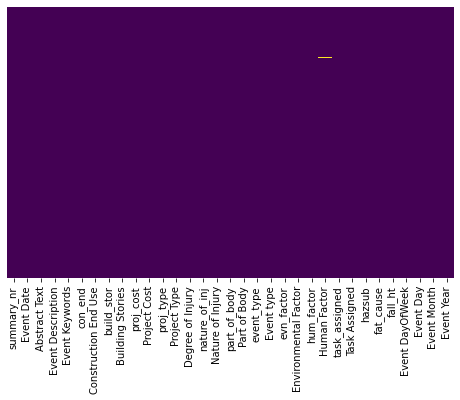

In [31]:
plt.figure(figsize=(8,5))
sns.heatmap(data=data.isnull(),cbar=False,yticklabels=False,cmap='viridis')

In [32]:
data.isnull().sum()

summary_nr              0
Event Date              0
Abstract Text           0
Event Description       0
Event Keywords          0
con_end                 0
Construction End Use    0
build_stor              0
Building Stories        0
proj_cost               0
Project Cost            0
proj_type               0
Project Type            0
Degree of Injury        0
nature_of_inj           0
Nature of Injury        2
part_of_body            0
Part of Body            2
event_type              0
Event type              2
evn_factor              0
Environmental Factor    7
hum_factor              0
Human Factor            7
task_assigned           0
Task Assigned           0
hazsub                  0
fat_cause               0
fall_ht                 0
Event DayOfWeek         0
Event Day               0
Event Month             0
Event Year              0
dtype: int64

In [33]:
data.dropna(inplace=True)

<AxesSubplot:>

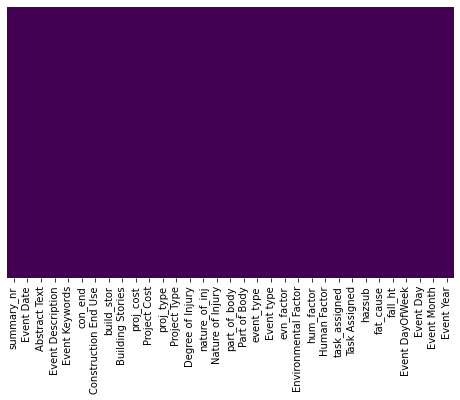

In [34]:
plt.figure(figsize=(8,5))
sns.heatmap(data=data.isnull(),cbar=False,yticklabels=False,cmap='viridis')

### Abstract Text

In [35]:
data['Abstract Text'].iloc[0]

'At 9:00 a.m. on August 10, 2017, an employee was operating a 400 ton Bliss Coin "Knuckle" mechanical power press. The press was actuated while the employee\'s right hand was in the point of operation. The employee\'s right ring and middle fingers were amputated. Coin "Knuckle" mechanical power press. The press was actuated while the employee\'s right hand was in the point of operation. The employee\'s right ring and middle fingers were amputated. '

In [36]:
data['Abstract Text'].iloc[4830]

'At approximately 9:15 a.m. on July 1, 2015, Employee #1 was trouble shooting lights at the top of a billboard. He was climbing down a ladder from the top walkway to the lower walkway, when he lost his balance and fell for some unknown reason. Employee #1 fell 40 ft and was killed. He struck the ground and sustained severe head and internal injuries. '

In [37]:
def parse_time(x):
    words = x.split(' ')
    string = ''
    for word in words:
        if ':' in word:
            string += word
        if '.m.' in word:
            string += f' {word}'
    if 11 > len(string) > 8:
        return string

In [38]:
data['Time'] = data['Abstract Text'].apply(parse_time)

In [39]:
data['Time']

0        9:00 a.m.
1        9:45 a.m.
2        7:30 a.m.
3        2:00 p.m.
4       12:20 p.m.
           ...    
4842     9:15 a.m.
4843     8:30 a.m.
4844     3:00 p.m.
4845     2:30 p.m.
4846     2:15 p.m.
Name: Time, Length: 4835, dtype: object

In [40]:
data['Time'].isna().sum()

467

In [41]:
def clock_format(y):
    if y==None:
        pass
    else:
        words = y.split(' ')
        string = ''
        for word in words:
            if 'a.m.' in word:
                hour = words[0]
                return hour
            elif 'p.m.' in word:
                list1 = words[0].split(':')
                hour = list1[0]
                hour1=int(hour)+12
                minute = list1[1] 
                hour2 = str(hour1)
                minute1 = str(minute)
                if hour1 == 24:
                    hour2 = hour1-12
                    hour2 = str(hour2)
                return hour2+':'+minute1

In [42]:
data['Time'] = data['Time'].apply(clock_format)

In [43]:
data['Time']

0        9:00
1        9:45
2        7:30
3       14:00
4       12:20
        ...  
4842     9:15
4843     8:30
4844    15:00
4845    14:30
4846    14:15
Name: Time, Length: 4835, dtype: object

In [44]:
data.dropna(inplace=True)

In [45]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4367 entries, 0 to 4846
Data columns (total 34 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   summary_nr            4367 non-null   int64         
 1   Event Date            4367 non-null   datetime64[ns]
 2   Abstract Text         4367 non-null   object        
 3   Event Description     4367 non-null   object        
 4   Event Keywords        4367 non-null   object        
 5   con_end               4367 non-null   object        
 6   Construction End Use  4367 non-null   object        
 7   build_stor            4367 non-null   int64         
 8   Building Stories      4367 non-null   object        
 9   proj_cost             4367 non-null   object        
 10  Project Cost          4367 non-null   object        
 11  proj_type             4367 non-null   object        
 12  Project Type          4367 non-null   object        
 13  Degree of Injury  

In [46]:
data['Time'] = data['Time'].apply(lambda x:pd.to_datetime(x))

In [47]:
data['Time']

0      2023-05-25 09:00:00
1      2023-05-25 09:45:00
2      2023-05-25 07:30:00
3      2023-05-25 14:00:00
4      2023-05-25 12:20:00
               ...        
4842   2023-05-25 09:15:00
4843   2023-05-25 08:30:00
4844   2023-05-25 15:00:00
4845   2023-05-25 14:30:00
4846   2023-05-25 14:15:00
Name: Time, Length: 4367, dtype: datetime64[ns]

In [48]:
data['Hour'] = data['Time'].apply(lambda x:x.hour)

In [49]:
data['Minutes'] = data['Time'].apply(lambda x:x.minute)

In [50]:
data['Time'] = data['Time'].apply(lambda x:x.time())

In [51]:
data

,summary_nr,Event Date,Abstract Text,Event Description,Event Keywords,con_end,Construction End Use,build_stor,Building Stories,proj_cost,...,hazsub,fat_cause,fall_ht,Event DayOfWeek,Event Day,Event Month,Event Year,Time,Hour,Minutes
0,220982664,2017-08-10,"At 9:00 a.m. on August 10, 2017, an employee w...",EMPLOYEE'S FINGERS AMPUTATED WHILE OPERATING A...,"FINGER,MECHANICAL POWER PRESS,AMPUTATION,GUARD",0,,0,,0,...,0,0,0,Thu,10,8,2017,09:00:00,9,0
1,220973937,2017-07-17,"At 9:45 a.m. on July 17, 2017, an employee was...",EMPLOYEE'S FINGER IS CAUGHT IN DRILL AND IS AM...,"CAUGHT IN,DRIVE SHAFT,RESIDENTIAL CONSTRUCTION...",H,Other building,1,1,0,...,0,0,0,Mon,17,7,2017,09:45:00,9,45
2,220967632,2017-06-30,"At 7:30 a.m. on June 30, 2017, an employee was...",EMPLOYEE IS HOSPITALIZED AFTER BEING INJURED I...,"AMPUTATED,EXPLOSION,FIREWORKS",0,,0,,0,...,0,0,0,Fri,30,6,2017,07:30:00,7,30
3,220969901,2017-06-30,"At 2:00 p.m. on June 30, 2017, an employee was...",EMPLOYEE FALLS FROM ROOF AND IS INJURED,"RIB,ROOF,HEAD,FALL PROTECTION,FALL,COLLARBONE,...",C,Commercial building,1,1,D,...,0,15,0,Fri,30,6,2017,14:00:00,14,0
4,220977748,2017-06-23,"At 12:20 p.m. on June 23, 2017, an employee wa...",EMPLOYEE IS STRUCK BY PLYWOOD WHILE UNLOADING ...,"STRUCK BY,TRUCK,BRAIN,NECK,FRACTURE,UNSTABLE LOAD",0,,0,,0,...,0,0,0,Fri,23,6,2017,12:20:00,12,20
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4842,220778856,2015-07-01,"At approximately 9:15 a.m. on July 1, 2015, Em...","EMPLOYEE FALLS FROM BILLBOARD, SUSTAINS TRAUMA...","FALL,LOST BALANCE,LADDER",0,,0,,0,...,0,0,0,Wed,1,7,2015,09:15:00,9,15
4843,220778096,2015-07-01,"At approximately 8:30 a.m. on July 1, 2015, Em...","EMPLOYEE FALLS FROM ELEVATION, SUSTAINS HEAD T...","FALL,LOST BALANCE,HEAD",0,,0,,0,...,0,0,0,Wed,1,7,2015,08:30:00,8,30
4844,220778112,2015-07-01,"At 3:00 p.m. on July 1, 2015, an employee was ...",EMPLOYEE FOUND UNRESPONSIVE BY HOME OWNER DURI...,UNCONSCIOUSNESS,0,,0,,0,...,0,0,0,Wed,1,7,2015,15:00:00,15,0
4845,220777940,2015-07-01,"At approximately 2:30 p.m. on July 1, 2015, Em...",EMPLOYEE IS STRUCK AND KILLED BY LOGGING TRUCK...,"STRUCK BY,MOTOR VEHICLE",0,,0,,0,...,0,0,0,Wed,1,7,2015,14:30:00,14,30


### Event Description

In [52]:
data['Event Description'].iloc[0]

"EMPLOYEE'S FINGERS AMPUTATED WHILE OPERATING A 400 TON MECHA"

In [53]:
data['Event Description'].iloc[1]

"EMPLOYEE'S FINGER IS CAUGHT IN DRILL AND IS AMPUTATED"

### Event Keywords

In [54]:
data['Event Keywords'].iloc[0]

'FINGER,MECHANICAL POWER PRESS,AMPUTATION,GUARD'

In [55]:
data['Event Keywords'].iloc[1]

'CAUGHT IN,DRIVE SHAFT,RESIDENTIAL CONSTRUCTION,AMPUTATION,DRILL'

In [56]:
data['Event Keywords'].value_counts()

HEART ATTACK                                                       41
FALL,ROOF                                                          22
WORKPLACE VIOLENCE,GUNSHOT                                         18
FALL,LADDER                                                        17
HEART ATTACK,HEART                                                 16
                                                                   ..
RUPTURE,BURN,CHEST,NECK,FOOD PREPARATION,FACE                       1
ACCESS/EGRESS,BURN,FRYER,LEG                                        1
SLIPPERY SURFACE,FALL,NECK,LACERATION,STAIR                         1
CAUGHT BETWEEN,CRUSHED,DOOR                                         1
CRUSHING,STRUCK BY,POWERED INDUSTRIAL VEHICLE,MATERIAL HANDLING     1
Name: Event Keywords, Length: 4026, dtype: int64

In [57]:
data['Event Keywords'].apply(lambda x:x.lower().split(',')[0])

0                finger
1             caught in
2             amputated
3                   rib
4             struck by
             ...       
4842               fall
4843               fall
4844    unconsciousness
4845          struck by
4846           crushing
Name: Event Keywords, Length: 4367, dtype: object

### Construction End Use

In [58]:
data['con_end'].unique()

array(['0', 'H', 'C', 'G', 'B', 'I', 'M', 'A', 'D', 'O', 'Q', 'F', 'P',
       'J', 'K', 'L', 'N', 'E'], dtype=object)

In [59]:
data['con_end'].value_counts()

0    3408
C     262
A     176
H     131
B     119
I      82
D      36
P      32
M      29
G      20
J      19
O      16
Q       8
E       8
F       7
K       6
N       6
L       2
Name: con_end, dtype: int64

In [60]:
data['Construction End Use'].value_counts()

                                         3408
Commercial building                       262
Single family or duplex dwelling          176
Other building                            131
Multi-family dwelling                     119
Highway, road, street                      82
Manufacturing plant                        36
Other heavy construction                   32
Pipeline                                   29
Sewer/water treatment plant                20
Bridge                                     19
Power line, transmission line              16
Contractor's yard/facility                  8
Refinery                                    8
Power plant                                 7
Tower, tank, storage ,elevator              6
Excavation, landfill                        6
Shoreline development, dam, reservoir       2
Name: Construction End Use, dtype: int64

### Building Stories

In [61]:
data['build_stor'].value_counts()

0      3718
1       268
2       190
3        74
4        35
5        25
6        13
7        12
10        7
15        3
11        3
8         3
13        2
40        2
19        2
9         2
76        1
16        1
139       1
46        1
12        1
14        1
21        1
25        1
Name: build_stor, dtype: int64

In [62]:
data[data['Building Stories']=='139'].loc[525]

summary_nr                                                      220945893
Event Date                                            2017-04-05 00:00:00
Abstract Text           At approximately 10:30 a.m. on April 5, 2017, ...
Event Description       EMPLOYEE  FALLS FROM VERTICAL LADDER AND IS KI...
Event Keywords          PLATFORM,FALL,LADDER,SCAFFOLD,FRACTURE,ELEVATE...
con_end                                                                 D
Construction End Use                                  Manufacturing plant
build_stor                                                            139
Building Stories                                                      139
proj_cost                                                               G
Project Cost                                   $10,000,000 to $20,000,000
proj_type                                                               A
Project Type                                  New project or new addition
Degree of Injury                      

In [63]:
data['Building Stories'].value_counts()

       3718
1       268
2       190
3        74
4        35
5        25
6        13
7        12
10        7
15        3
11        3
8         3
13        2
40        2
19        2
9         2
76        1
16        1
139       1
46        1
12        1
14        1
21        1
25        1
Name: Building Stories, dtype: int64

In [64]:
data['build_stor']

0       0
1       1
2       0
3       1
4       0
       ..
4842    0
4843    0
4844    0
4845    0
4846    0
Name: build_stor, Length: 4367, dtype: int64

In [65]:
data['Building Stories']

0        
1       1
2        
3       1
4        
       ..
4842     
4843     
4844     
4845     
4846     
Name: Building Stories, Length: 4367, dtype: object

In [66]:
data['Building Stories'].iloc[0]

' '

### Project Cost

In [67]:
data['proj_cost'].value_counts()

0    3813
A     148
E      98
B      73
D      70
C      68
G      50
F      47
Name: proj_cost, dtype: int64

In [68]:
data['Project Cost'].value_counts()

                              3813
Under $50,000                  148
$1,000,000 to $5,000,000        98
$50,000 to $250,000             73
$500,000 to $1,000,000          70
$250,000 to $500,000            68
$10,000,000 to $20,000,000      50
$5,000,000 to $10,000,000       47
Name: Project Cost, dtype: int64

In [69]:
data.head()

,summary_nr,Event Date,Abstract Text,Event Description,Event Keywords,con_end,Construction End Use,build_stor,Building Stories,proj_cost,...,hazsub,fat_cause,fall_ht,Event DayOfWeek,Event Day,Event Month,Event Year,Time,Hour,Minutes
0,220982664,2017-08-10,"At 9:00 a.m. on August 10, 2017, an employee w...",EMPLOYEE'S FINGERS AMPUTATED WHILE OPERATING A...,"FINGER,MECHANICAL POWER PRESS,AMPUTATION,GUARD",0,,0,,0,...,0,0,0,Thu,10,8,2017,09:00:00,9,0
1,220973937,2017-07-17,"At 9:45 a.m. on July 17, 2017, an employee was...",EMPLOYEE'S FINGER IS CAUGHT IN DRILL AND IS AM...,"CAUGHT IN,DRIVE SHAFT,RESIDENTIAL CONSTRUCTION...",H,Other building,1,1,0,...,0,0,0,Mon,17,7,2017,09:45:00,9,45
2,220967632,2017-06-30,"At 7:30 a.m. on June 30, 2017, an employee was...",EMPLOYEE IS HOSPITALIZED AFTER BEING INJURED I...,"AMPUTATED,EXPLOSION,FIREWORKS",0,,0,,0,...,0,0,0,Fri,30,6,2017,07:30:00,7,30
3,220969901,2017-06-30,"At 2:00 p.m. on June 30, 2017, an employee was...",EMPLOYEE FALLS FROM ROOF AND IS INJURED,"RIB,ROOF,HEAD,FALL PROTECTION,FALL,COLLARBONE,...",C,Commercial building,1,1,D,...,0,15,0,Fri,30,6,2017,14:00:00,14,0
4,220977748,2017-06-23,"At 12:20 p.m. on June 23, 2017, an employee wa...",EMPLOYEE IS STRUCK BY PLYWOOD WHILE UNLOADING ...,"STRUCK BY,TRUCK,BRAIN,NECK,FRACTURE,UNSTABLE LOAD",0,,0,,0,...,0,0,0,Fri,23,6,2017,12:20:00,12,20


### Project Type

In [70]:
data['proj_type'].value_counts()

0    3358
A     527
B     247
C     149
D      46
E      40
Name: proj_type, dtype: int64

In [71]:
data['Project Type'].value_counts()

                                3358
New project or new addition      527
Alteration or rehabilitation     247
Maintenance or repair            149
Demolition                        46
Other                             40
Name: Project Type, dtype: int64

### Degree of Injury

In [72]:
data['Degree of Injury'].value_counts()

Fatal       2598
Nonfatal    1769
Name: Degree of Injury, dtype: int64

### Nature of Injury

In [73]:
data['nature_of_inj'].value_counts()

21    1460
12     774
1      517
7      352
6      299
3      269
2      188
10     185
5      127
9       62
18      45
4       27
15      26
20      23
11       6
17       4
13       1
22       1
16       1
Name: nature_of_inj, dtype: int64

In [74]:
data['Nature of Injury'].value_counts()

Serious Fall/Strike       1460
Fracture, Broken Bones     774
Amputation, Crushing       517
Laceration                 352
Head Trauma                299
Bruising, Contusion        269
Asphyxiation, Drowning     188
Electrocution              185
Fire Burn                  127
Dislocation                 62
Puncture                    45
Chemical Burn               27
Heat Exhaustion             26
Fall/strike                 23
Eye injury                   6
Poison                       4
Freezer burn                 1
Fall from Elevation          1
Illness                      1
Name: Nature of Injury, dtype: int64

### Part of Body

In [75]:
data['part_of_body'].value_counts()

13    918
10    524
4     493
19    354
31    318
5     272
16    249
12    203
20    141
11    113
28     96
21     94
3      83
1      66
9      63
2      63
14     62
18     58
24     44
22     26
23     24
17     22
15     21
29     19
8      13
27      8
7       6
25      6
30      3
6       3
26      2
Name: part_of_body, dtype: int64

In [76]:
data['Part of Body'].value_counts()

Head                    918
Fingers                 524
Whole Body              493
Internal Injuries       354
Heart                   318
Ribs                    272
Left Leg                249
Hand                    203
Neck                    141
Feet                    113
Lungs (Puncture)         96
Shoulder                 94
Back                     83
Abdomen                  66
Arm                      63
Face                     63
Hip                      62
Lower Leg                58
Wrist                    44
Multiple                 26
Femur                    24
Forearm                  22
Knee                     21
Lungs (Asphyxiation)     19
Right Eye                13
0                        12
Liver                     8
Elbow                     6
Kidney                    2
Name: Part of Body, dtype: int64

In [77]:
data[data['Part of Body']=='0']

,summary_nr,Event Date,Abstract Text,Event Description,Event Keywords,con_end,Construction End Use,build_stor,Building Stories,proj_cost,...,hazsub,fat_cause,fall_ht,Event DayOfWeek,Event Day,Event Month,Event Year,Time,Hour,Minutes
153,220956072,2017-04-26,"At 6:00 a.m. on April 26, 2017 an employee sta...",EMPLOYEE WORKING IN WAREHOUSE COLLAPSED AND CO...,COLLAPSE,0,,0,,0,...,0,0,0,Wed,26,4,2017,06:00:00,6,0
1149,220947964,2017-03-01,"At approximately 8:00 a.m. on March 1, 2017, a...",EMPLOYEE IS EXPOSED TO LEAD DURING PREPARATION...,"PAINT,SCRAP METAL,INHALATION,LEAD",C,Commercial building,2,2,E,...,0,0,0,Wed,1,3,2017,08:00:00,8,0
1554,220931083,2017-02-08,"At 11:15 a.m. on February 8, 2017, three emplo...",THREE EMPLOYEES ARE KILLED IN A TANK EXPLOSION,"TANK,ELEVATED WORK PLATFORM,EXPLOSION",D,Manufacturing plant,0,,0,...,0,0,0,Wed,8,2,2017,11:15:00,11,15
1562,220931760,2017-02-08,"At 10:45 a.m. on February 8, 2017, Employee #1...",EMPLOYEE IS IMPALED BY PROBE AND IS HOSPITALIZED,"PELVIS,REPAIR,STRUCK AGAINST,WATER PIPE,IMPALE...",G,Sewer/water treatment plant,0,,0,...,0,25,0,Wed,8,2,2017,10:45:00,10,45
1799,220927982,2017-01-27,"At 10:00 a.m. on January 27, 2017, two employe...",TWO EMPLOYEES ARE INJURED IN A CHEMICAL EXPLOSION,"CHEMICAL,EXPLOSION,EAR,PRESSURE VESSEL,COMBUST...",0,,0,,0,...,0,0,0,Fri,27,1,2017,10:00:00,10,0
2130,220923262,2017-01-12,"At 7:30 a.m. on January 12, 2017, an employee ...",EMPLOYEE IS CAUGHT IN STACKER AND AMPUTATES EAR,"STRUCK BY,AMPUTATED,CAUGHT BETWEEN,EAR,MACHINE...",0,,0,,0,...,0,0,0,Thu,12,1,2017,07:30:00,7,30
2378,220913768,2016-12-13,"At 10:00 a.m. on December 13, 2016, an employe...",EMPLOYEE IS KILLED WHEN BACKED OVER BY A TRUCK,"TIRE,RUN OVER,OIL WELL DRILLING/SERVICING,NATU...",M,Pipeline,0,,0,...,0,7,0,Tue,13,12,2016,10:00:00,10,0
2858,220885230,2016-09-12,"At approximately 2:38 p.m. on September 12, 20...",EMPLOYEE DIED OF HEART ATTACK WHILING TORCHING...,"ROOFER,CARDIOVASC SYSTEM,HEART ATTACK",C,Commercial building,1,1,A,...,0,0,0,Mon,12,9,2016,14:38:00,14,38
3044,220877328,2016-08-08,"At approximately 2:00 p.m. on August 8, 2016, ...",EMPLOYEE IS KILLED IN EXPLOSION WHILE WELDING,"WELDER,EXPLOSION",0,,0,,0,...,0,0,0,Mon,8,8,2016,14:00:00,14,0
4246,220813042,2015-11-09,"At 9:00 a.m. on November 9, 2015, a worker was...",EMPLOYEE SERVICING TEMPERATURE RELAYS IS ELECT...,"ELECTRICAL,ELECTRIC SWITCH,ELECTROCUTED,LOCKOU...",0,,0,,0,...,0,0,0,Mon,9,11,2015,09:00:00,9,0


In [78]:
data.drop([153,1149,1554,1562,1799,2130,2378,2858,3044,4246,4420,4797],axis=0,inplace=True)

In [79]:
data[data['Part of Body']=='0']

,summary_nr,Event Date,Abstract Text,Event Description,Event Keywords,con_end,Construction End Use,build_stor,Building Stories,proj_cost,...,hazsub,fat_cause,fall_ht,Event DayOfWeek,Event Day,Event Month,Event Year,Time,Hour,Minutes


In [80]:
data['part_of_body'].nunique()

28

In [81]:
data['Part of Body'].nunique()

28

### Event type

In [82]:
data['event_type'].value_counts()

5     1073
1     1030
2     1027
14     564
13     178
12     154
6      119
4      117
8       68
3        8
7        7
9        4
10       3
11       3
Name: event_type, dtype: int64

In [83]:
data['Event type'].value_counts()

Fall (from elevation)        1073
Struck-by                    1030
Caught in or between         1027
Other                         564
Shock                         178
Card-vascular/resp. fail.     154
Struck against                119
Fall (same level)             117
Inhalation                     68
Bite/sting/scratch              8
Rubbed/abraded                  7
Ingestion                       4
Absorption                      3
Rep. Motion/pressure            3
Name: Event type, dtype: int64

### Environmental Factor

In [84]:
data['evn_factor'].value_counts()  

18    1800
8      586
13     545
1      386
6      279
2      174
3      105
5      104
17      95
7       67
11      60
15      46
9       36
14      30
10      29
16      11
12       2
Name: evn_factor, dtype: int64

In [85]:
data['Environmental Factor'].value_counts()

Other                                     1800
Materials Handling Equip./Method           586
Work-Surface/Facility-Layout Condition     545
Pinch Point Action                         386
Overhead Moving/Falling Object Action      279
Catch Point/Puncture Action                174
Shear Point Action                         105
Flying Object Action                       104
Weather, Earthquake, Etc.                   95
Gas/Vapor/Mist/Fume/Smoke/Dust              67
Temperature +/- Tolerance Lev.              60
Overpressure/Underpressure                  46
Chemical Action/Reaction Expos              36
Illumination                                30
Flammable Liquid/Solid Exposure             29
Sound Level                                 11
Radiation Condition                          2
Name: Environmental Factor, dtype: int64

### Human Factor

In [86]:
data['hum_factor'].value_counts()

14    1635
1     1273
9      244
10     193
11     141
17     138
20     134
6      130
18     126
13     104
4       96
5       38
8       36
12      30
7       14
15      13
19       9
16       1
Name: hum_factor, dtype: int64

In [87]:
data['Human Factor'].value_counts()

Other                                                    1635
Misjudgment, Hazardous Situation                         1273
Safety Devices Removed/Inoperable                         244
Position Inappropriate For Task                           193
Mater-Handling Procedure Inappropriate                    141
Insufficient /Lack/Engineering Controls                   138
Insufficient /Lack/Protective Work Clothing/Equipment     134
Equipment Inappropriate For Operation                     130
Insufficient /Lack/Written Work Practice Program          126
Lockout/Tagout Procedure Malfunction                      104
Malfunction In Securing/Warning Op                         96
Distracting Actions By Others                              38
Perception Malfunction Task-Environment                    36
Defective Equipment In Use                                 30
Malfunction Neuromuscular System                           14
Insufficient/Lack/Housekeeping Program                     13
Insuffic

### Task Assigned

In [88]:
data['task_assigned'].value_counts()       

1    2827
2    1528
Name: task_assigned, dtype: int64

In [89]:
data['Task Assigned'].value_counts()     

Regularly Assigned        2827
Not Regularly Assigned    1528
Name: Task Assigned, dtype: int64

### hazsub

In [90]:
data['hazsub'].value_counts()

0       4306
8870      13
8880       3
8330       3
240        2
1900       2
614        2
1640       2
170        2
640        2
1340       1
S777       1
1803       1
337        1
L130       1
X100       1
D150       1
1460       1
5010       1
1430       1
C730       1
1480       1
8400       1
2170       1
8890       1
560        1
2150       1
2037       1
Name: hazsub, dtype: int64

### fat_cause

In [91]:
data['fat_cause'].value_counts()

0     3551
15     129
26      88
16      77
14      69
18      64
20      43
30      38
25      31
9       27
7       26
4       21
27      20
3       18
5       18
10      17
19      15
21      14
28      12
12      12
29      10
22      10
1        9
17       8
6        7
2        7
23       5
8        4
24       3
11       2
Name: fat_cause, dtype: int64

### fall_ht

In [92]:
data['fall_ht'].value_counts()

0    4355
Name: fall_ht, dtype: int64

## Drop Non-Important Columns

In [93]:
data.head(2)

,summary_nr,Event Date,Abstract Text,Event Description,Event Keywords,con_end,Construction End Use,build_stor,Building Stories,proj_cost,...,hazsub,fat_cause,fall_ht,Event DayOfWeek,Event Day,Event Month,Event Year,Time,Hour,Minutes
0,220982664,2017-08-10,"At 9:00 a.m. on August 10, 2017, an employee w...",EMPLOYEE'S FINGERS AMPUTATED WHILE OPERATING A...,"FINGER,MECHANICAL POWER PRESS,AMPUTATION,GUARD",0,,0,,0,...,0,0,0,Thu,10,8,2017,09:00:00,9,0
1,220973937,2017-07-17,"At 9:45 a.m. on July 17, 2017, an employee was...",EMPLOYEE'S FINGER IS CAUGHT IN DRILL AND IS AM...,"CAUGHT IN,DRIVE SHAFT,RESIDENTIAL CONSTRUCTION...",H,Other building,1,1,0,...,0,0,0,Mon,17,7,2017,09:45:00,9,45


In [94]:
data.drop(['summary_nr','con_end','build_stor' , 'Event Description' ,'Event Keywords', 'Abstract Text' , 'proj_cost'
           , 'proj_type' , 'nature_of_inj' , 'part_of_body' , 'event_type' , 'evn_factor' 
           , 'hum_factor' , 'task_assigned' , 'fall_ht' , 'hazsub' , 'fat_cause'],
          axis=1,inplace=True)

In [95]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4355 entries, 0 to 4846
Data columns (total 19 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   Event Date            4355 non-null   datetime64[ns]
 1   Construction End Use  4355 non-null   object        
 2   Building Stories      4355 non-null   object        
 3   Project Cost          4355 non-null   object        
 4   Project Type          4355 non-null   object        
 5   Degree of Injury      4355 non-null   object        
 6   Nature of Injury      4355 non-null   object        
 7   Part of Body          4355 non-null   object        
 8   Event type            4355 non-null   object        
 9   Environmental Factor  4355 non-null   object        
 10  Human Factor          4355 non-null   object        
 11  Task Assigned         4355 non-null   object        
 12  Event DayOfWeek       4355 non-null   object        
 13  Event Day         

# EDA: Exploratory Data Analysis

In [96]:
data

,Event Date,Construction End Use,Building Stories,Project Cost,Project Type,Degree of Injury,Nature of Injury,Part of Body,Event type,Environmental Factor,Human Factor,Task Assigned,Event DayOfWeek,Event Day,Event Month,Event Year,Time,Hour,Minutes
0,2017-08-10,,,,,Nonfatal,"Amputation, Crushing",Fingers,Caught in or between,Catch Point/Puncture Action,Other,Regularly Assigned,Thu,10,8,2017,09:00:00,9,0
1,2017-07-17,Other building,1,,Alteration or rehabilitation,Nonfatal,Dislocation,Fingers,Caught in or between,Other,Position Inappropriate For Task,Regularly Assigned,Mon,17,7,2017,09:45:00,9,45
2,2017-06-30,,,,,Nonfatal,Fire Burn,Hand,Other,Other,Malfunction In Securing/Warning Op,Not Regularly Assigned,Fri,30,6,2017,07:30:00,7,30
3,2017-06-30,Commercial building,1,"$500,000 to $1,000,000",Alteration or rehabilitation,Fatal,Serious Fall/Strike,Head,Fall (from elevation),Work-Surface/Facility-Layout Condition,Other,Regularly Assigned,Fri,30,6,2017,14:00:00,14,0
4,2017-06-23,,,,,Nonfatal,"Bruising, Contusion",Neck,Struck-by,Overhead Moving/Falling Object Action,Insufficient/Lack/Housekeeping Program,Regularly Assigned,Fri,23,6,2017,12:20:00,12,20
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4842,2015-07-01,,,,,Fatal,Head Trauma,Whole Body,Fall (from elevation),Other,Perception Malfunction Task-Environment,Regularly Assigned,Wed,1,7,2015,09:15:00,9,15
4843,2015-07-01,,,,,Fatal,Serious Fall/Strike,Head,Fall (from elevation),Work-Surface/Facility-Layout Condition,Equipment Inappropriate For Operation,Not Regularly Assigned,Wed,1,7,2015,08:30:00,8,30
4844,2015-07-01,,,,,Fatal,Serious Fall/Strike,Whole Body,Other,Other,Other,Regularly Assigned,Wed,1,7,2015,15:00:00,15,0
4845,2015-07-01,,,,,Fatal,Serious Fall/Strike,Whole Body,Struck-by,Work-Surface/Facility-Layout Condition,"Misjudgment, Hazardous Situation",Regularly Assigned,Wed,1,7,2015,14:30:00,14,30


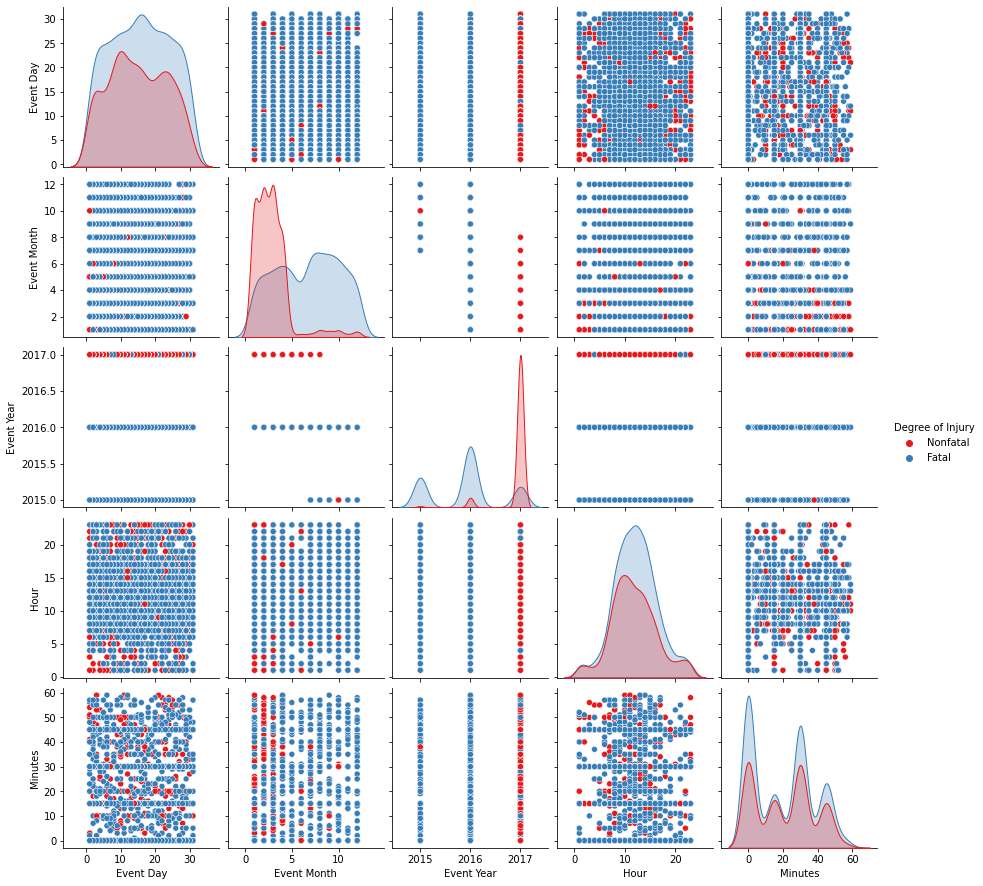

In [97]:
sns.pairplot(data,hue='Degree of Injury',palette='Set1')

<AxesSubplot:>

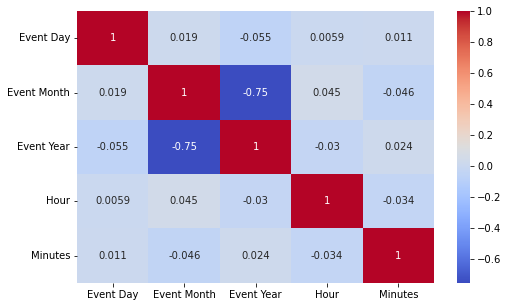

In [98]:
plt.figure(figsize=(8,5))
sns.heatmap(data.corr(),annot=True,cmap='coolwarm')

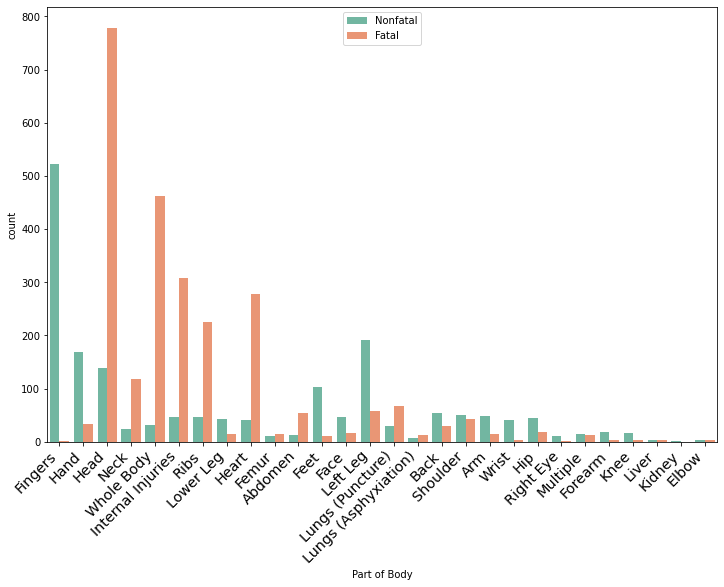

In [99]:
plt.figure(figsize=(12,8))
chart_count = sns.countplot(x='Part of Body',data=data,hue='Degree of Injury',palette='Set2')
chart_count.set_xticklabels(chart_count.get_xticklabels(),
                            rotation=45,horizontalalignment='right',fontweight='light', fontsize='x-large')
plt.legend()

[Text(0, 0, 'Fingers'),
 Text(1, 0, 'Hand'),
 Text(2, 0, 'Head'),
 Text(3, 0, 'Neck'),
 Text(4, 0, 'Whole Body'),
 Text(5, 0, 'Internal Injuries'),
 Text(6, 0, 'Ribs'),
 Text(7, 0, 'Lower Leg'),
 Text(8, 0, 'Heart'),
 Text(9, 0, 'Femur'),
 Text(10, 0, 'Abdomen'),
 Text(11, 0, 'Feet'),
 Text(12, 0, 'Face'),
 Text(13, 0, 'Left Leg'),
 Text(14, 0, 'Lungs (Puncture)'),
 Text(15, 0, 'Lungs (Asphyxiation)'),
 Text(16, 0, 'Back'),
 Text(17, 0, 'Shoulder'),
 Text(18, 0, 'Arm'),
 Text(19, 0, 'Wrist'),
 Text(20, 0, 'Hip'),
 Text(21, 0, 'Right Eye'),
 Text(22, 0, 'Multiple'),
 Text(23, 0, 'Forearm'),
 Text(24, 0, 'Knee'),
 Text(25, 0, 'Liver'),
 Text(26, 0, 'Kidney'),
 Text(27, 0, 'Elbow')]

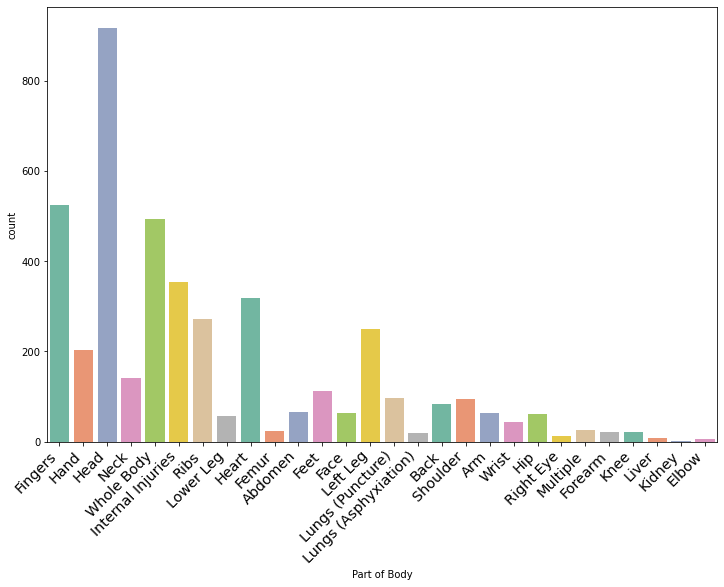

In [100]:
plt.figure(figsize=(12,8))
chart_count = sns.countplot(x='Part of Body',data=data,palette='Set2')
chart_count.set_xticklabels(chart_count.get_xticklabels(), rotation=45,horizontalalignment='right',fontweight='light', fontsize='x-large')

[Text(0, 0, 'Other building'),
 Text(1, 0, 'Commercial building'),
 Text(2, 0, 'Sewer/water treatment plant'),
 Text(3, 0, 'Multi-family dwelling'),
 Text(4, 0, 'Highway, road, street'),
 Text(5, 0, 'Pipeline'),
 Text(6, 0, 'Single family or duplex dwelling'),
 Text(7, 0, 'Manufacturing plant'),
 Text(8, 0, 'Power line, transmission line'),
 Text(9, 0, "Contractor's yard/facility"),
 Text(10, 0, 'Power plant'),
 Text(11, 0, 'Other heavy construction'),
 Text(12, 0, 'Bridge'),
 Text(13, 0, 'Tower, tank, storage ,elevator'),
 Text(14, 0, 'Shoreline development, dam, reservoir'),
 Text(15, 0, 'Excavation, landfill'),
 Text(16, 0, 'Refinery')]

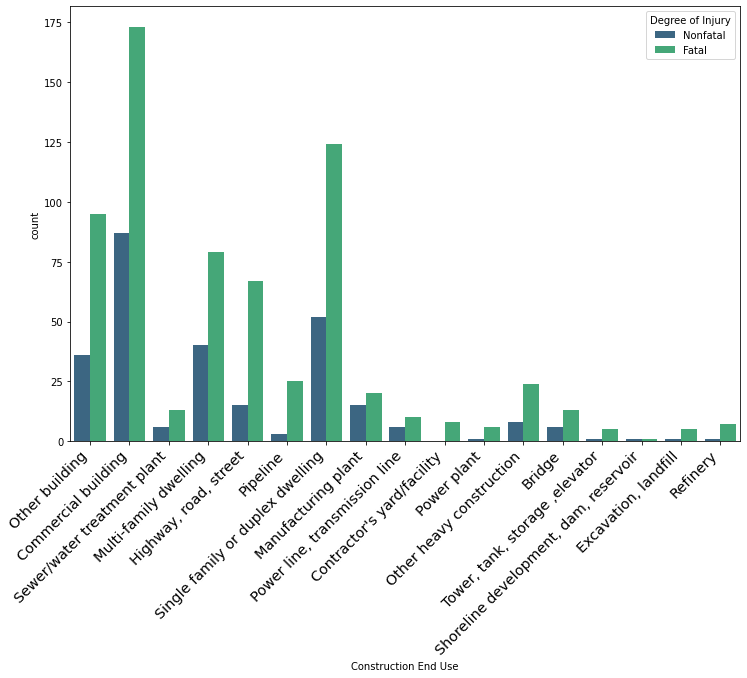

In [101]:
plt.figure(figsize=(12,8))
chart_count = sns.countplot(x='Construction End Use',data=data[data['Construction End Use']!=' '],
                            hue='Degree of Injury',palette='viridis')
chart_count.set_xticklabels(chart_count.get_xticklabels(), rotation=45,horizontalalignment='right',fontweight='light',
                            fontsize='x-large')

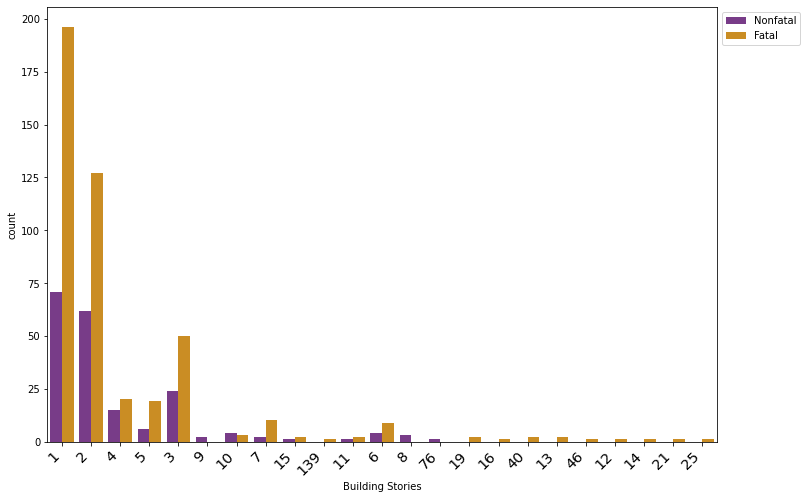

In [102]:
plt.figure(figsize=(12,8))
chart_count = sns.countplot(x='Building Stories',data=data[data['Building Stories']!=' '],hue='Degree of Injury',palette='CMRmap')
chart_count.set_xticklabels(chart_count.get_xticklabels(), rotation=45,horizontalalignment='right',fontweight='light', fontsize='x-large')
plt.legend(bbox_to_anchor=(1,1))

[Text(0, 0, '$500,000 to $1,000,000'),
 Text(1, 0, '$5,000,000 to $10,000,000'),
 Text(2, 0, 'Under $50,000'),
 Text(3, 0, '$1,000,000 to $5,000,000'),
 Text(4, 0, '$50,000 to $250,000'),
 Text(5, 0, '$250,000 to $500,000'),
 Text(6, 0, '$10,000,000 to $20,000,000')]

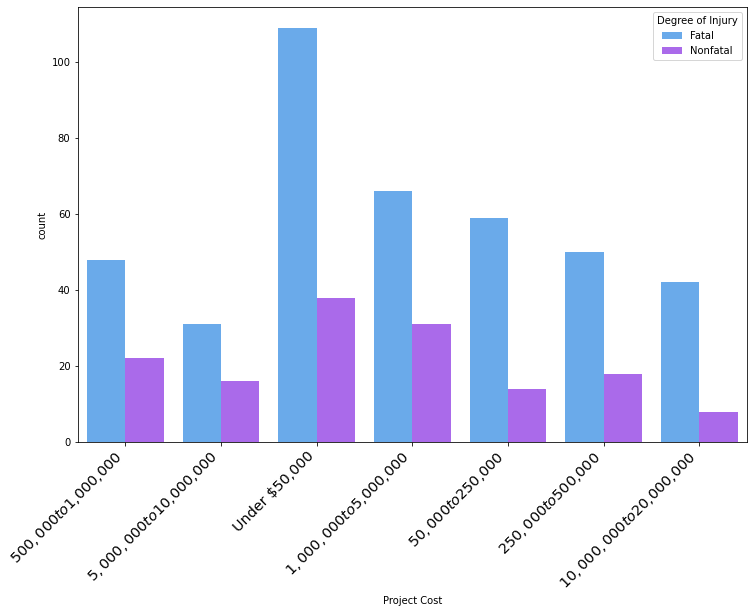

In [103]:
plt.figure(figsize=(12,8))
chart_count = sns.countplot(x='Project Cost',data=data[data['Project Cost']!=' '],hue='Degree of Injury',palette='cool')
chart_count.set_xticklabels(chart_count.get_xticklabels(), rotation=45,horizontalalignment='right',fontweight='light', fontsize='x-large')

[Text(0, 0, 'Alteration or rehabilitation'),
 Text(1, 0, 'New project or new addition'),
 Text(2, 0, 'Demolition'),
 Text(3, 0, 'Maintenance or repair'),
 Text(4, 0, 'Other')]

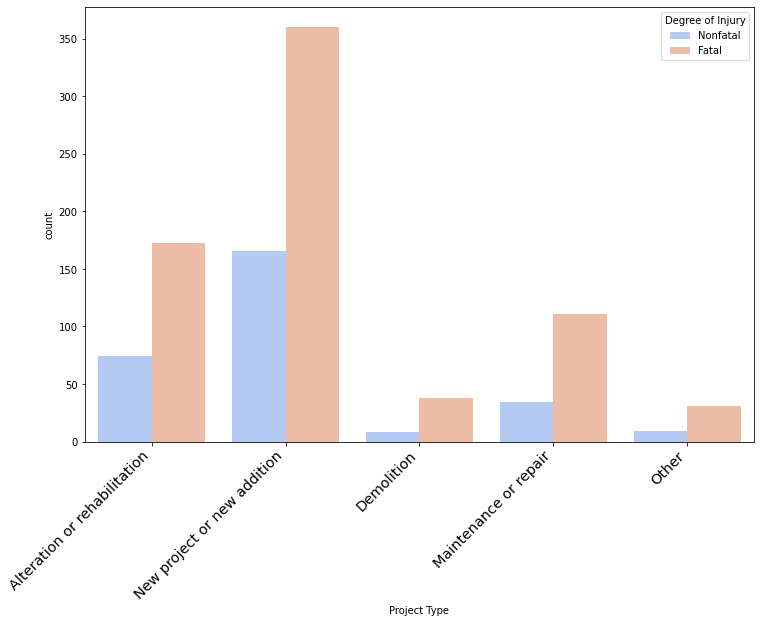

In [104]:
plt.figure(figsize=(12,8))
chart_count = sns.countplot(x='Project Type',data=data[data['Project Type']!=' '],hue='Degree of Injury',palette='coolwarm')
chart_count.set_xticklabels(chart_count.get_xticklabels(), rotation=45,horizontalalignment='right',fontweight='light', fontsize='x-large')

[Text(0, 0, 'Nonfatal'), Text(1, 0, 'Fatal')]

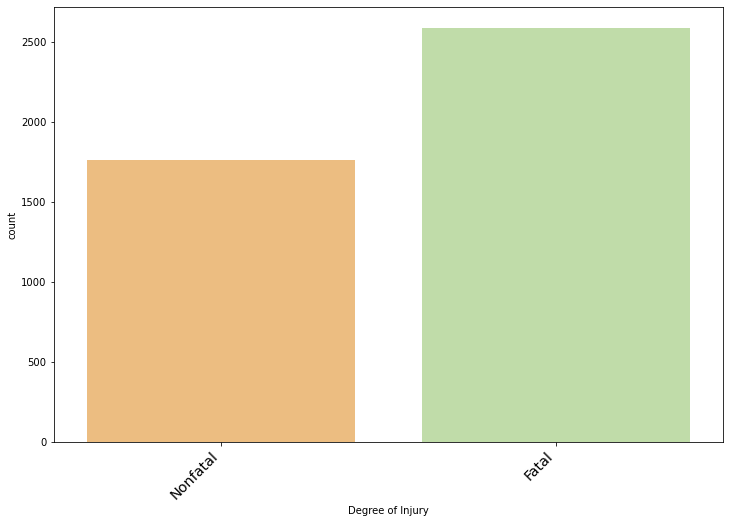

In [105]:
plt.figure(figsize=(12,8))
chart_count = sns.countplot(x='Degree of Injury',data=data,palette='Spectral')
chart_count.set_xticklabels(chart_count.get_xticklabels(), rotation=45,horizontalalignment='right',fontweight='light', fontsize='x-large')

[Text(0, 0, 'Amputation, Crushing'),
 Text(1, 0, 'Dislocation'),
 Text(2, 0, 'Fire Burn'),
 Text(3, 0, 'Serious Fall/Strike'),
 Text(4, 0, 'Bruising, Contusion'),
 Text(5, 0, 'Fracture, Broken Bones'),
 Text(6, 0, 'Head Trauma'),
 Text(7, 0, 'Heat Exhaustion'),
 Text(8, 0, 'Laceration'),
 Text(9, 0, 'Electrocution'),
 Text(10, 0, 'Asphyxiation, Drowning'),
 Text(11, 0, 'Chemical Burn'),
 Text(12, 0, 'Puncture'),
 Text(13, 0, 'Fall/strike'),
 Text(14, 0, 'Eye injury'),
 Text(15, 0, 'Freezer burn'),
 Text(16, 0, 'Poison'),
 Text(17, 0, 'Fall from Elevation'),
 Text(18, 0, 'Illness')]

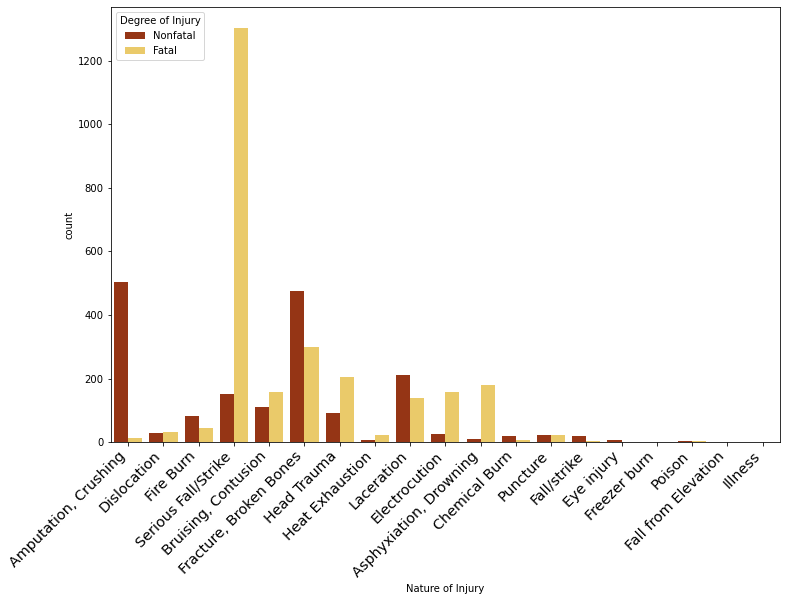

In [106]:
plt.figure(figsize=(12,8))
chart_count = sns.countplot(x='Nature of Injury',data=data,hue='Degree of Injury',palette='afmhot')
chart_count.set_xticklabels(chart_count.get_xticklabels(), rotation=45,horizontalalignment='right',fontweight='light', fontsize='x-large')

[Text(0, 0, 'Amputation, Crushing'),
 Text(1, 0, 'Dislocation'),
 Text(2, 0, 'Fire Burn'),
 Text(3, 0, 'Serious Fall/Strike'),
 Text(4, 0, 'Bruising, Contusion'),
 Text(5, 0, 'Fracture, Broken Bones'),
 Text(6, 0, 'Head Trauma'),
 Text(7, 0, 'Heat Exhaustion'),
 Text(8, 0, 'Laceration'),
 Text(9, 0, 'Electrocution'),
 Text(10, 0, 'Asphyxiation, Drowning'),
 Text(11, 0, 'Chemical Burn'),
 Text(12, 0, 'Puncture'),
 Text(13, 0, 'Fall/strike'),
 Text(14, 0, 'Eye injury'),
 Text(15, 0, 'Freezer burn'),
 Text(16, 0, 'Poison'),
 Text(17, 0, 'Fall from Elevation'),
 Text(18, 0, 'Illness')]

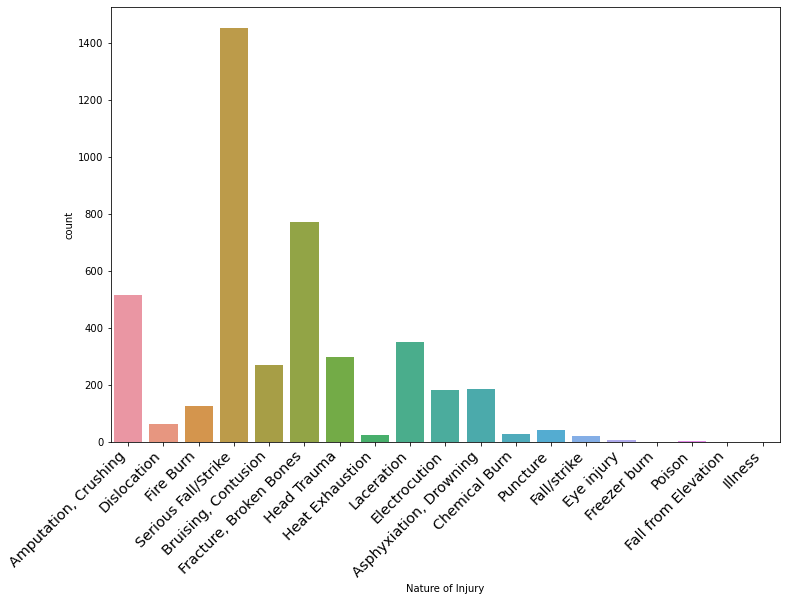

In [107]:
plt.figure(figsize=(12,8))
chart_count = sns.countplot(x='Nature of Injury',data=data)
chart_count.set_xticklabels(chart_count.get_xticklabels(), rotation=45,horizontalalignment='right', fontsize='x-large')

[Text(0, 0, 'Caught in or between'),
 Text(1, 0, 'Fall (from elevation)'),
 Text(2, 0, 'Struck-by'),
 Text(3, 0, 'Card-vascular/resp. fail.'),
 Text(4, 0, 'Shock'),
 Text(5, 0, 'Struck against'),
 Text(6, 0, 'Inhalation'),
 Text(7, 0, 'Fall (same level)'),
 Text(8, 0, 'Absorption'),
 Text(9, 0, 'Rubbed/abraded'),
 Text(10, 0, 'Bite/sting/scratch'),
 Text(11, 0, 'Rep. Motion/pressure'),
 Text(12, 0, 'Ingestion')]

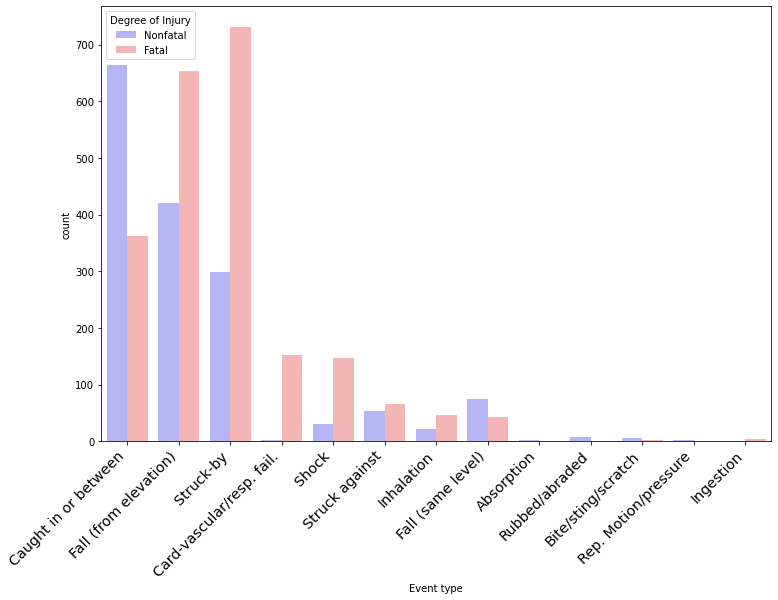

In [108]:
plt.figure(figsize=(12,8))
chart_count = sns.countplot(x='Event type',data=data[data['Event type']!='Other'],hue='Degree of Injury',palette='bwr')
chart_count.set_xticklabels(chart_count.get_xticklabels(), rotation=45,horizontalalignment='right',fontweight='light', fontsize='x-large')

[Text(0, 0, 'Catch Point/Puncture Action'),
 Text(1, 0, 'Work-Surface/Facility-Layout Condition'),
 Text(2, 0, 'Overhead Moving/Falling Object Action'),
 Text(3, 0, 'Temperature +/- Tolerance Lev.'),
 Text(4, 0, 'Sound Level'),
 Text(5, 0, 'Flying Object Action'),
 Text(6, 0, 'Materials Handling Equip./Method'),
 Text(7, 0, 'Pinch Point Action'),
 Text(8, 0, 'Chemical Action/Reaction Expos'),
 Text(9, 0, 'Weather, Earthquake, Etc.'),
 Text(10, 0, 'Shear Point Action'),
 Text(11, 0, 'Gas/Vapor/Mist/Fume/Smoke/Dust'),
 Text(12, 0, 'Flammable Liquid/Solid Exposure'),
 Text(13, 0, 'Illumination'),
 Text(14, 0, 'Overpressure/Underpressure'),
 Text(15, 0, 'Radiation Condition')]

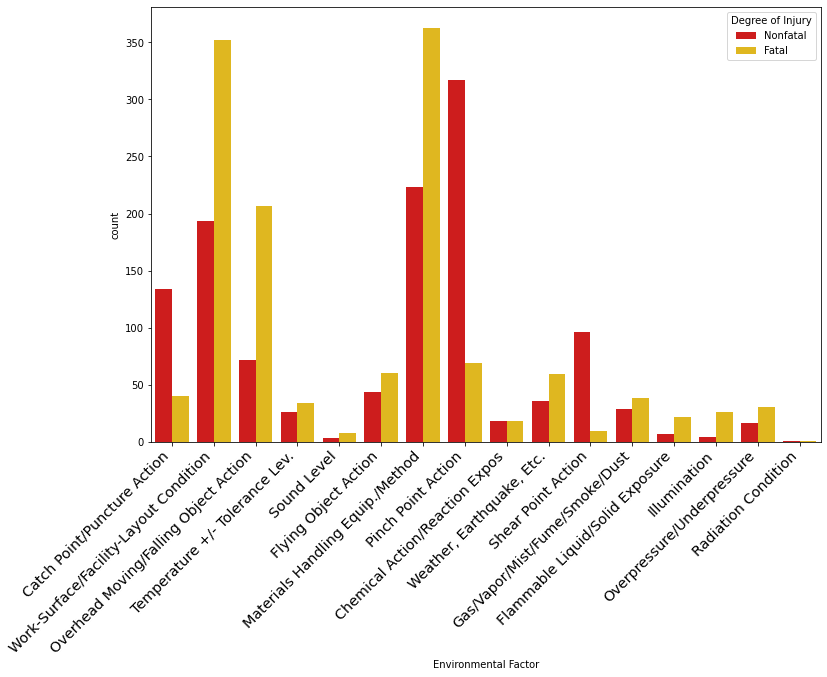

In [109]:
plt.figure(figsize=(12,8))
chart_count = sns.countplot(x='Environmental Factor',data=data[data['Environmental Factor']!='Other'],hue='Degree of Injury',palette='hot')
chart_count.set_xticklabels(chart_count.get_xticklabels(), rotation=45,horizontalalignment='right',fontweight='light', fontsize='x-large')

[Text(0, 0, 'Catch Point/Puncture Action'),
 Text(1, 0, 'Work-Surface/Facility-Layout Condition'),
 Text(2, 0, 'Overhead Moving/Falling Object Action'),
 Text(3, 0, 'Temperature +/- Tolerance Lev.'),
 Text(4, 0, 'Sound Level'),
 Text(5, 0, 'Flying Object Action'),
 Text(6, 0, 'Materials Handling Equip./Method'),
 Text(7, 0, 'Pinch Point Action'),
 Text(8, 0, 'Chemical Action/Reaction Expos'),
 Text(9, 0, 'Weather, Earthquake, Etc.'),
 Text(10, 0, 'Shear Point Action'),
 Text(11, 0, 'Gas/Vapor/Mist/Fume/Smoke/Dust'),
 Text(12, 0, 'Flammable Liquid/Solid Exposure'),
 Text(13, 0, 'Illumination'),
 Text(14, 0, 'Overpressure/Underpressure'),
 Text(15, 0, 'Radiation Condition')]

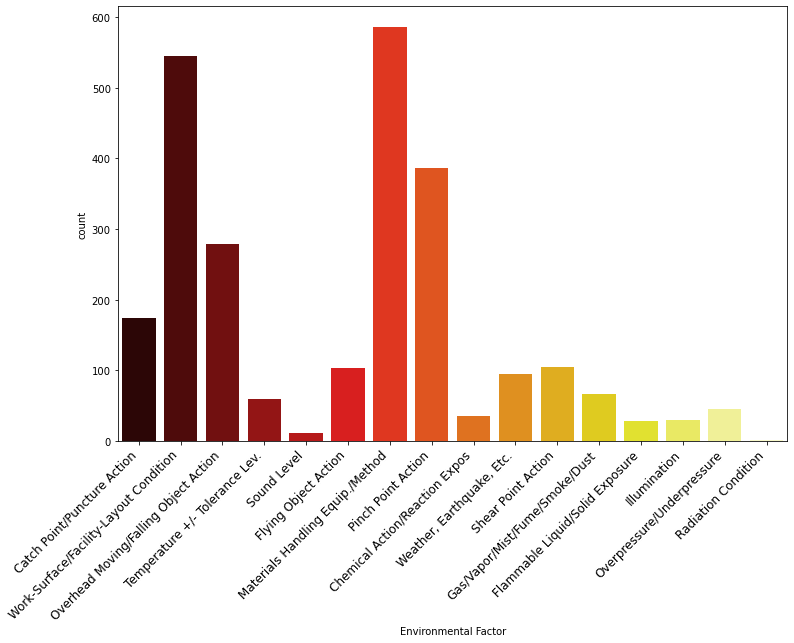

In [110]:
plt.figure(figsize=(12,8))
chart_count = sns.countplot(x='Environmental Factor',data=data[data['Environmental Factor']!='Other'],palette='hot')
chart_count.set_xticklabels(chart_count.get_xticklabels(), rotation=45,horizontalalignment='right', fontsize='large')

[Text(0, 0, 'Position Inappropriate For Task'),
 Text(1, 0, 'Malfunction In Securing/Warning Op'),
 Text(2, 0, 'Insufficient/Lack/Housekeeping Program'),
 Text(3, 0, 'Safety Devices Removed/Inoperable'),
 Text(4, 0, 'Misjudgment, Hazardous Situation'),
 Text(5, 0, 'Equipment Inappropriate For Operation'),
 Text(6, 0, 'Mater-Handling Procedure Inappropriate'),
 Text(7, 0, 'Distracting Actions By Others'),
 Text(8, 0, 'Insufficient /Lack/Protective Work Clothing/Equipment'),
 Text(9, 0, 'Insufficient /Lack/Engineering Controls'),
 Text(10, 0, 'Perception Malfunction Task-Environment'),
 Text(11, 0, 'Insufficient /Lack/Written Work Practice Program'),
 Text(12, 0, 'Lockout/Tagout Procedure Malfunction'),
 Text(13, 0, 'Defective Equipment In Use'),
 Text(14, 0, 'Malfunction Neuromuscular System'),
 Text(15, 0, 'Insufficient /Lack/Respiratory Protection'),
 Text(16, 0, 'Insufficient /Lack/Expose/Biological Monitoring.')]

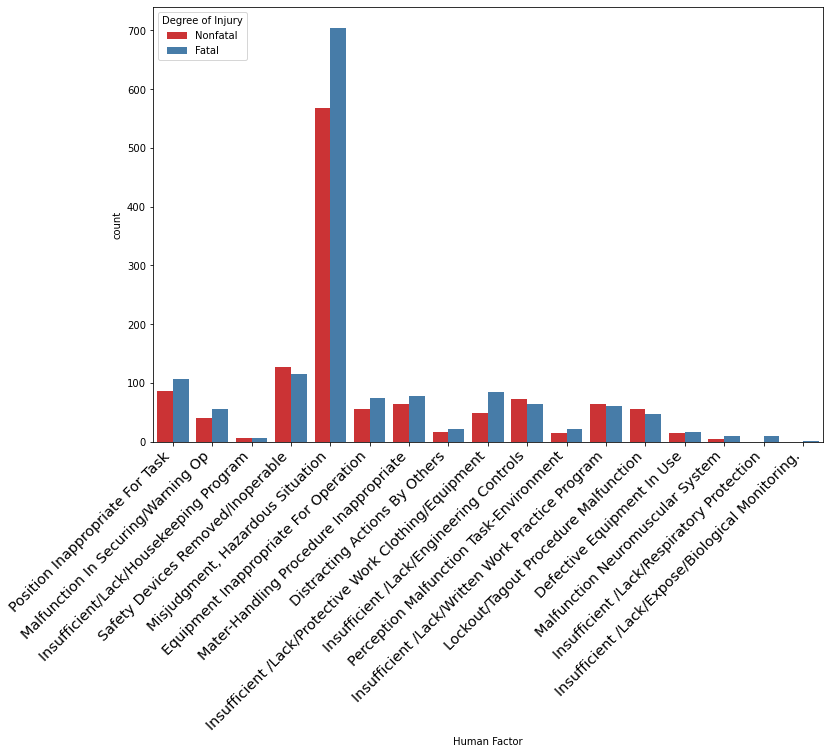

In [111]:
plt.figure(figsize=(12,8))
chart_count = sns.countplot(x='Human Factor',data=data[data['Human Factor']!='Other'],hue='Degree of Injury',palette='Set1')
chart_count.set_xticklabels(chart_count.get_xticklabels(), rotation=45,horizontalalignment='right',fontweight='light', fontsize='x-large')

[Text(0, 0, 'Position Inappropriate For Task'),
 Text(1, 0, 'Malfunction In Securing/Warning Op'),
 Text(2, 0, 'Insufficient/Lack/Housekeeping Program'),
 Text(3, 0, 'Safety Devices Removed/Inoperable'),
 Text(4, 0, 'Misjudgment, Hazardous Situation'),
 Text(5, 0, 'Equipment Inappropriate For Operation'),
 Text(6, 0, 'Mater-Handling Procedure Inappropriate'),
 Text(7, 0, 'Distracting Actions By Others'),
 Text(8, 0, 'Insufficient /Lack/Protective Work Clothing/Equipment'),
 Text(9, 0, 'Insufficient /Lack/Engineering Controls'),
 Text(10, 0, 'Perception Malfunction Task-Environment'),
 Text(11, 0, 'Insufficient /Lack/Written Work Practice Program'),
 Text(12, 0, 'Lockout/Tagout Procedure Malfunction'),
 Text(13, 0, 'Defective Equipment In Use'),
 Text(14, 0, 'Malfunction Neuromuscular System'),
 Text(15, 0, 'Insufficient /Lack/Respiratory Protection'),
 Text(16, 0, 'Insufficient /Lack/Expose/Biological Monitoring.')]

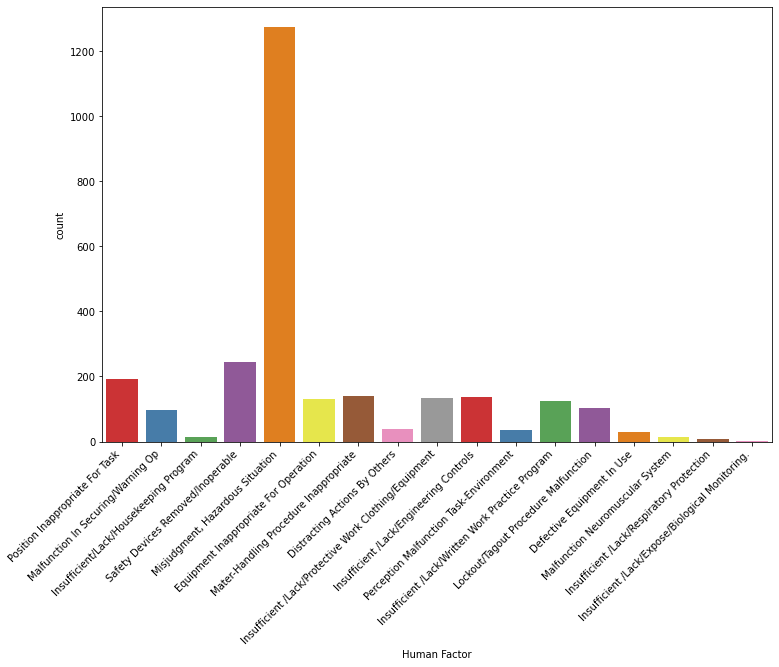

In [112]:
plt.figure(figsize=(12,8))
chart_count = sns.countplot(x='Human Factor',data=data[data['Human Factor']!='Other'],palette='Set1')
chart_count.set_xticklabels(chart_count.get_xticklabels(), rotation=45,horizontalalignment='right', fontsize='medium')

<AxesSubplot:xlabel='Task Assigned', ylabel='count'>

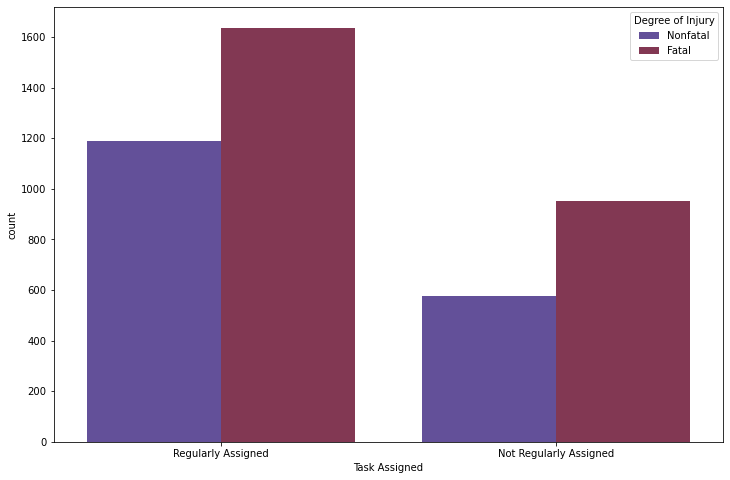

In [113]:
plt.figure(figsize=(12,8))
sns.countplot(x='Task Assigned',data=data,hue='Degree of Injury',palette='twilight')

[Text(0, 0, 'Thu'),
 Text(1, 0, 'Mon'),
 Text(2, 0, 'Fri'),
 Text(3, 0, 'Wed'),
 Text(4, 0, 'Tue'),
 Text(5, 0, 'Sun'),
 Text(6, 0, 'Sat')]

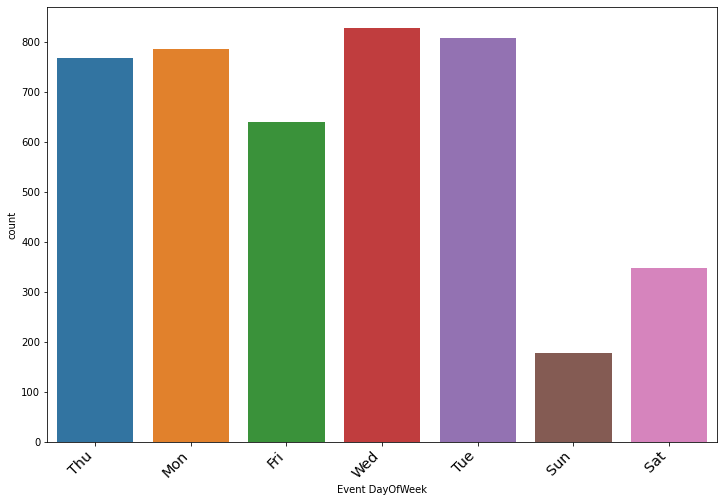

In [114]:
plt.figure(figsize=(12,8))
chart_count = sns.countplot(x='Event DayOfWeek',data=data)
chart_count.set_xticklabels(chart_count.get_xticklabels(), rotation=45,horizontalalignment='right',fontweight='light', fontsize='x-large')

[Text(0, 0, 'Thu'),
 Text(1, 0, 'Mon'),
 Text(2, 0, 'Fri'),
 Text(3, 0, 'Wed'),
 Text(4, 0, 'Tue'),
 Text(5, 0, 'Sun'),
 Text(6, 0, 'Sat')]

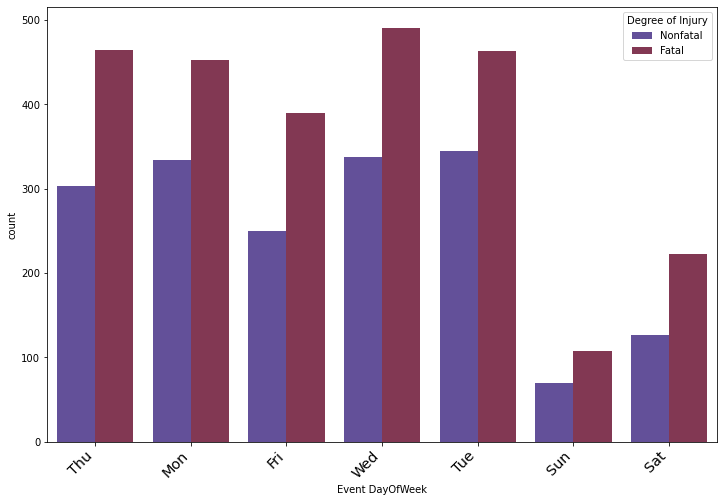

In [115]:
plt.figure(figsize=(12,8))
chart_count = sns.countplot(x='Event DayOfWeek',data=data,hue='Degree of Injury',palette='twilight')
chart_count.set_xticklabels(chart_count.get_xticklabels(), rotation=45,horizontalalignment='right',fontweight='light', fontsize='x-large')

<AxesSubplot:xlabel='Hour', ylabel='Count'>

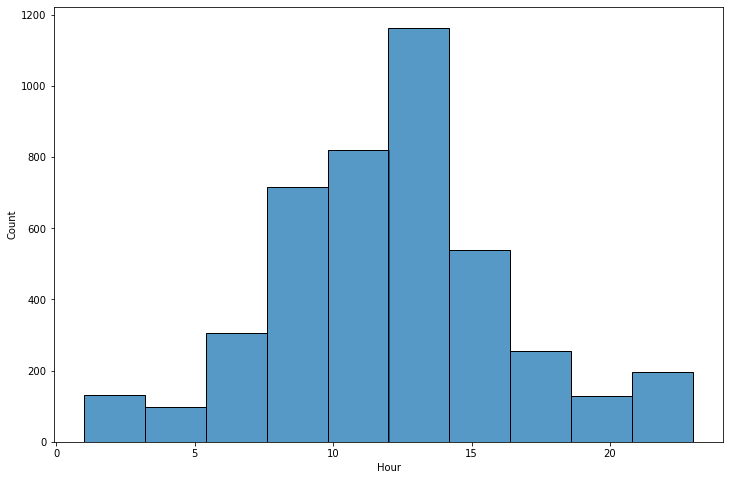

In [116]:
plt.figure(figsize=(12,8))
sns.histplot(x='Hour',data=data,bins=10)

<AxesSubplot:xlabel='Hour', ylabel='Density'>

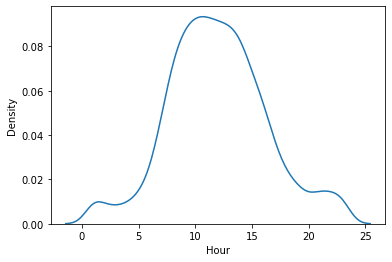

In [117]:
sns.kdeplot(data=data,x='Hour')

[Text(0, 0, '1'),
 Text(1, 0, '2'),
 Text(2, 0, '3'),
 Text(3, 0, '4'),
 Text(4, 0, '5'),
 Text(5, 0, '6'),
 Text(6, 0, '7'),
 Text(7, 0, '8'),
 Text(8, 0, '9'),
 Text(9, 0, '10'),
 Text(10, 0, '11'),
 Text(11, 0, '12'),
 Text(12, 0, '13'),
 Text(13, 0, '14'),
 Text(14, 0, '15'),
 Text(15, 0, '16'),
 Text(16, 0, '17'),
 Text(17, 0, '18'),
 Text(18, 0, '19'),
 Text(19, 0, '20'),
 Text(20, 0, '21'),
 Text(21, 0, '22'),
 Text(22, 0, '23'),
 Text(23, 0, '24'),
 Text(24, 0, '25'),
 Text(25, 0, '26'),
 Text(26, 0, '27'),
 Text(27, 0, '28'),
 Text(28, 0, '29'),
 Text(29, 0, '30'),
 Text(30, 0, '31')]

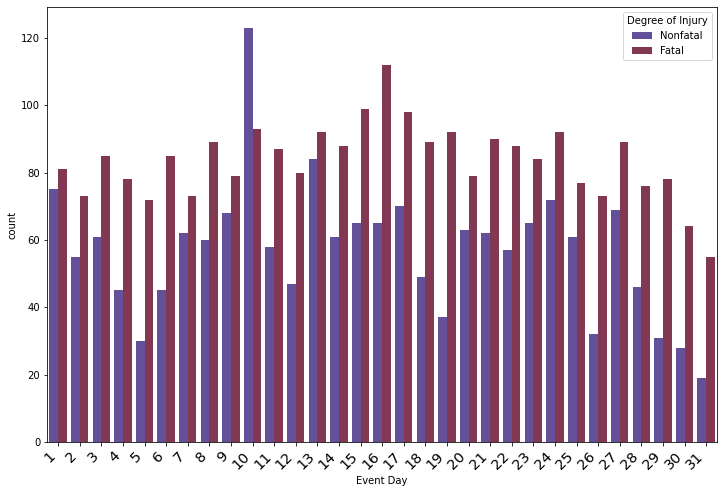

In [118]:
plt.figure(figsize=(12,8))
chart_count = sns.countplot(x='Event Day',data=data,hue='Degree of Injury',palette='twilight')
chart_count.set_xticklabels(chart_count.get_xticklabels(), rotation=45,horizontalalignment='right',fontweight='light', fontsize='x-large')

[Text(0, 0, '1'),
 Text(1, 0, '2'),
 Text(2, 0, '3'),
 Text(3, 0, '4'),
 Text(4, 0, '5'),
 Text(5, 0, '6'),
 Text(6, 0, '7'),
 Text(7, 0, '8'),
 Text(8, 0, '9'),
 Text(9, 0, '10'),
 Text(10, 0, '11'),
 Text(11, 0, '12')]

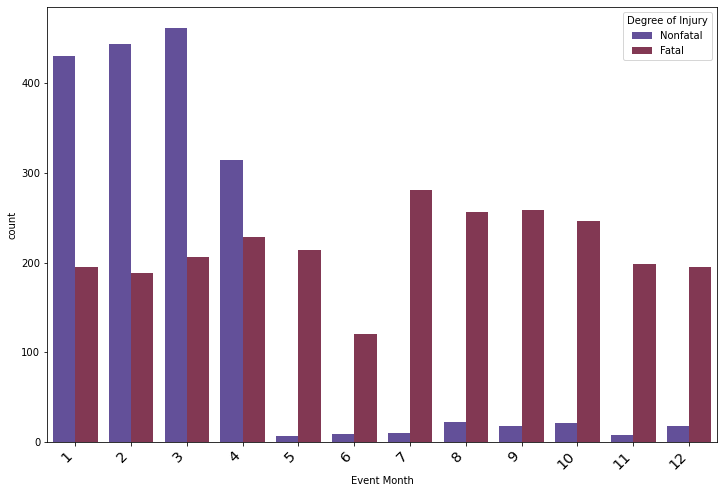

In [119]:
plt.figure(figsize=(12,8))
chart_count = sns.countplot(x='Event Month',data=data,hue='Degree of Injury',palette='twilight')
chart_count.set_xticklabels(chart_count.get_xticklabels(), rotation=45,horizontalalignment='right',fontweight='light', fontsize='x-large')

[Text(0, 0, '2015'), Text(1, 0, '2016'), Text(2, 0, '2017')]

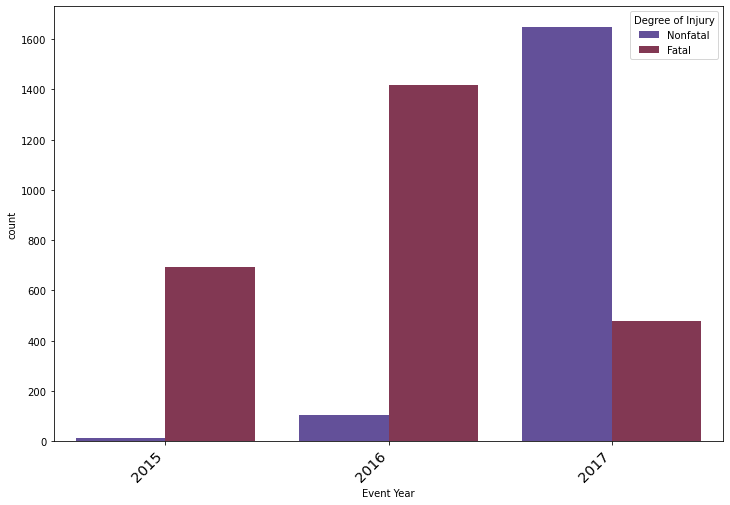

In [120]:
plt.figure(figsize=(12,8))
chart_count = sns.countplot(x='Event Year',data=data,hue='Degree of Injury',palette='twilight')
chart_count.set_xticklabels(chart_count.get_xticklabels(), rotation=45,horizontalalignment='right',fontweight='light', fontsize='x-large')

In [121]:
data.columns

Index(['Event Date', 'Construction End Use', 'Building Stories',
       'Project Cost', 'Project Type', 'Degree of Injury', 'Nature of Injury',
       'Part of Body', 'Event type', 'Environmental Factor', 'Human Factor',
       'Task Assigned', 'Event DayOfWeek', 'Event Day', 'Event Month',
       'Event Year', 'Time', 'Hour', 'Minutes'],
      dtype='object')

<Figure size 720x432 with 0 Axes>

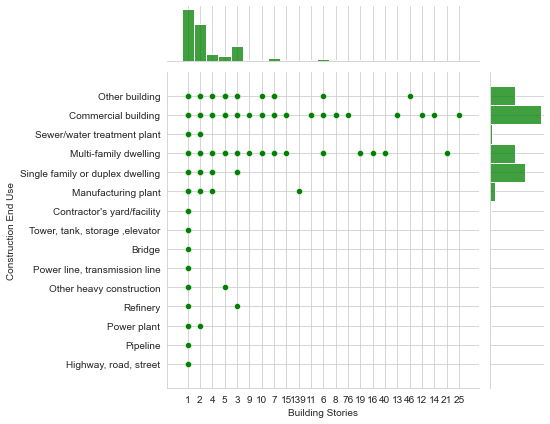

In [122]:
sns.set_style('whitegrid')
plt.figure(figsize=(10,6))
sns.jointplot(data=data[(data['Building Stories']!=' ')&(data['Construction End Use']!=' ')],
              x='Building Stories',y='Construction End Use',color='green')

<Figure size 720x432 with 0 Axes>

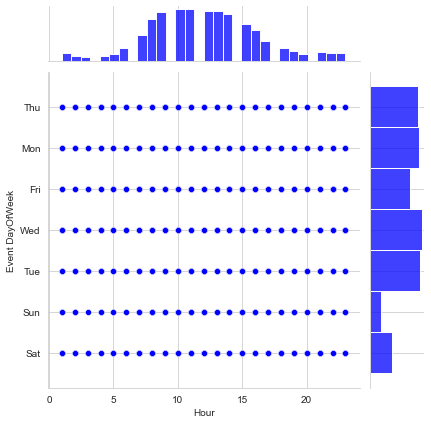

In [123]:
plt.figure(figsize=(10,6))
sns.jointplot(data=data,
              x='Hour',y='Event DayOfWeek',color='blue')

In [124]:
temp = data[data['Part of Body'].isin(['Head','Fingers','Whole Body','Internal Injuries',
                                       'Heart','Ribs','Left Leg','Hand','Neck','Feet'])]

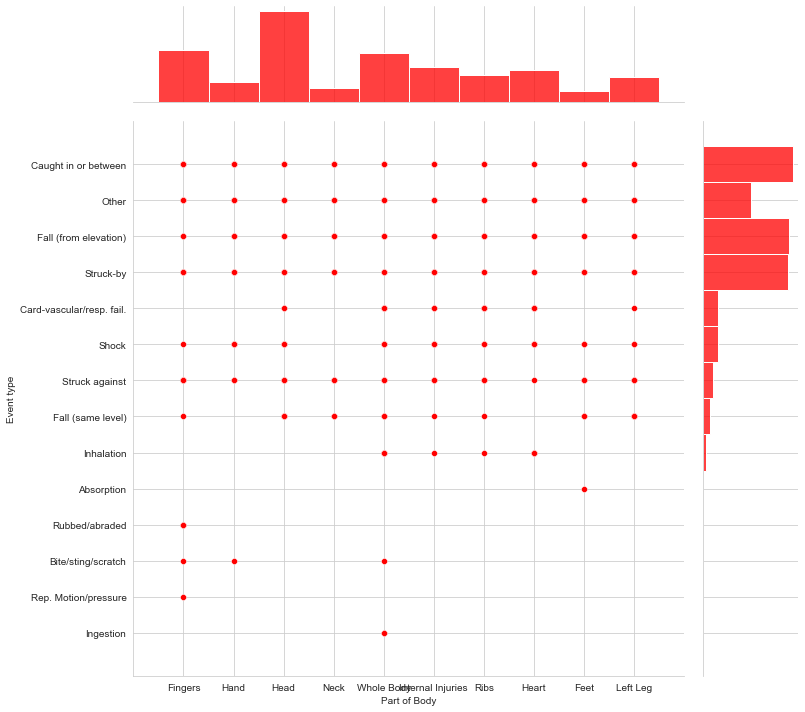

In [125]:
sns.jointplot(data=temp,
              x='Part of Body',y='Event type',color='red',height=10)

In [126]:
data['Human Factor'].value_counts()

Other                                                    1635
Misjudgment, Hazardous Situation                         1273
Safety Devices Removed/Inoperable                         244
Position Inappropriate For Task                           193
Mater-Handling Procedure Inappropriate                    141
Insufficient /Lack/Engineering Controls                   138
Insufficient /Lack/Protective Work Clothing/Equipment     134
Equipment Inappropriate For Operation                     130
Insufficient /Lack/Written Work Practice Program          126
Lockout/Tagout Procedure Malfunction                      104
Malfunction In Securing/Warning Op                         96
Distracting Actions By Others                              38
Perception Malfunction Task-Environment                    36
Defective Equipment In Use                                 30
Malfunction Neuromuscular System                           14
Insufficient/Lack/Housekeeping Program                     13
Insuffic

In [127]:
temp1 = data[data['Human Factor'].isin(['Misjudgment, Hazardous Situation','Safety Devices Removed/Inoperable',
    'Position Inappropriate For Task','Mater-Handling Procedure Inappropriate'
])]

<Figure size 864x576 with 0 Axes>

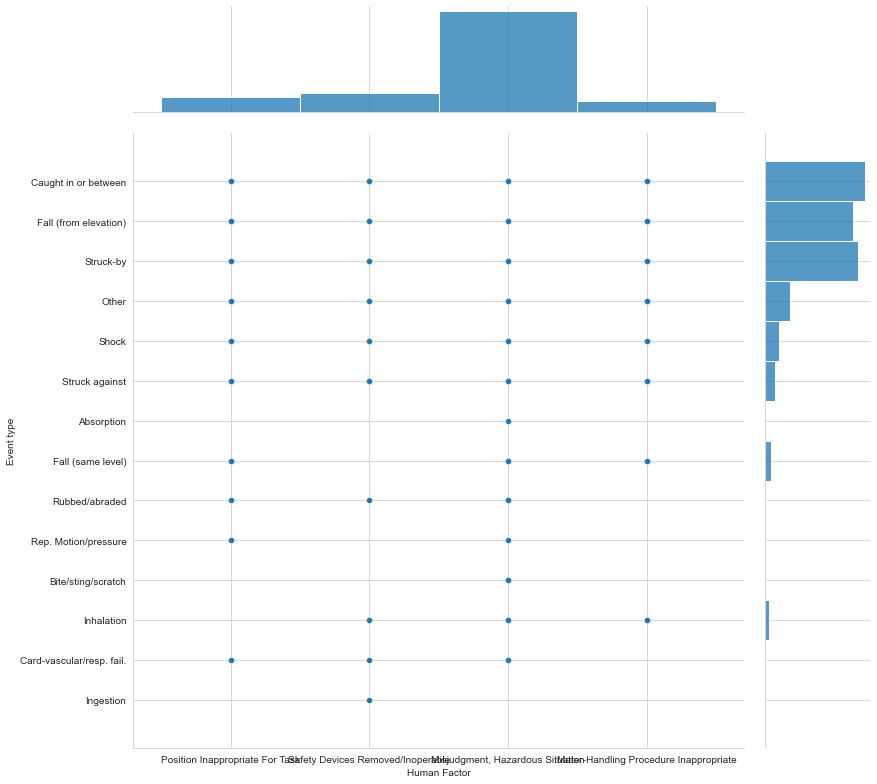

In [128]:
sns.set_style('whitegrid')
fig = plt.figure(figsize=(12,8))
sns.jointplot(data=temp1,
              x='Human Factor',y='Event type',height=11)
locs,labels = plt.xticks()

## Auto EDA with Sweetviz

In [129]:
datasweet= pd.get_dummies(data,columns=['Degree of Injury'])

In [130]:
datasweet

,Event Date,Construction End Use,Building Stories,Project Cost,Project Type,Nature of Injury,Part of Body,Event type,Environmental Factor,Human Factor,Task Assigned,Event DayOfWeek,Event Day,Event Month,Event Year,Time,Hour,Minutes,Degree of Injury_Fatal,Degree of Injury_Nonfatal
0,2017-08-10,,,,,"Amputation, Crushing",Fingers,Caught in or between,Catch Point/Puncture Action,Other,Regularly Assigned,Thu,10,8,2017,09:00:00,9,0,0,1
1,2017-07-17,Other building,1,,Alteration or rehabilitation,Dislocation,Fingers,Caught in or between,Other,Position Inappropriate For Task,Regularly Assigned,Mon,17,7,2017,09:45:00,9,45,0,1
2,2017-06-30,,,,,Fire Burn,Hand,Other,Other,Malfunction In Securing/Warning Op,Not Regularly Assigned,Fri,30,6,2017,07:30:00,7,30,0,1
3,2017-06-30,Commercial building,1,"$500,000 to $1,000,000",Alteration or rehabilitation,Serious Fall/Strike,Head,Fall (from elevation),Work-Surface/Facility-Layout Condition,Other,Regularly Assigned,Fri,30,6,2017,14:00:00,14,0,1,0
4,2017-06-23,,,,,"Bruising, Contusion",Neck,Struck-by,Overhead Moving/Falling Object Action,Insufficient/Lack/Housekeeping Program,Regularly Assigned,Fri,23,6,2017,12:20:00,12,20,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4842,2015-07-01,,,,,Head Trauma,Whole Body,Fall (from elevation),Other,Perception Malfunction Task-Environment,Regularly Assigned,Wed,1,7,2015,09:15:00,9,15,1,0
4843,2015-07-01,,,,,Serious Fall/Strike,Head,Fall (from elevation),Work-Surface/Facility-Layout Condition,Equipment Inappropriate For Operation,Not Regularly Assigned,Wed,1,7,2015,08:30:00,8,30,1,0
4844,2015-07-01,,,,,Serious Fall/Strike,Whole Body,Other,Other,Other,Regularly Assigned,Wed,1,7,2015,15:00:00,15,0,1,0
4845,2015-07-01,,,,,Serious Fall/Strike,Whole Body,Struck-by,Work-Surface/Facility-Layout Condition,"Misjudgment, Hazardous Situation",Regularly Assigned,Wed,1,7,2015,14:30:00,14,30,1,0


### Analyzing the Dataset with Sweetviz

                                             |                                             | [  0%]   00:00 ->…


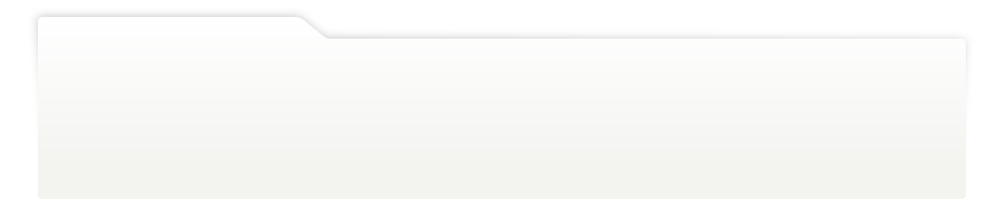
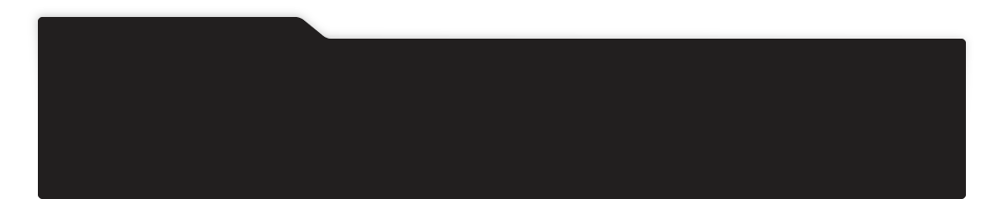
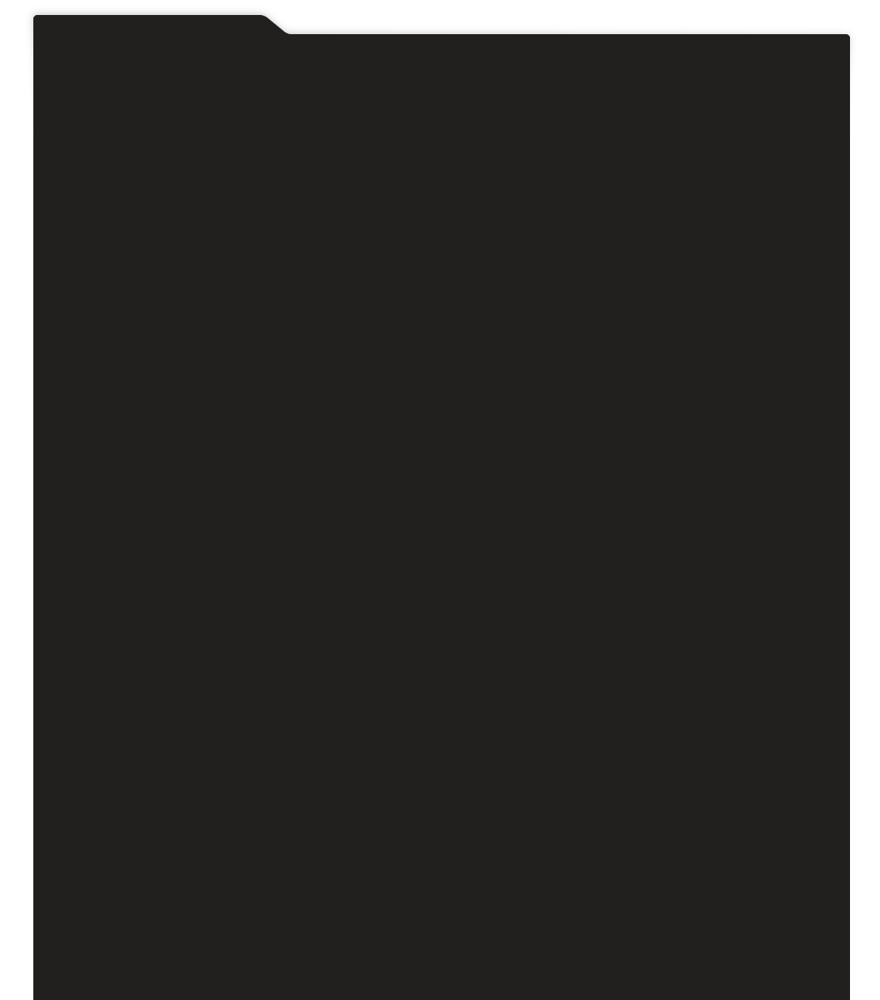
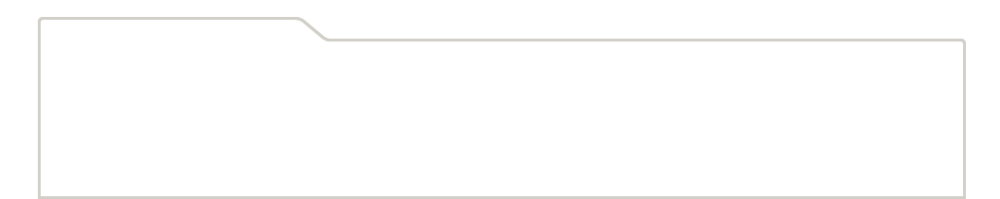
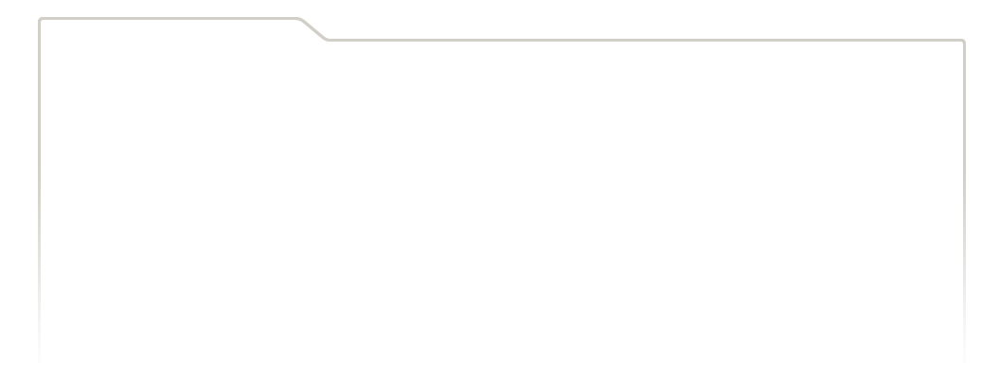
...
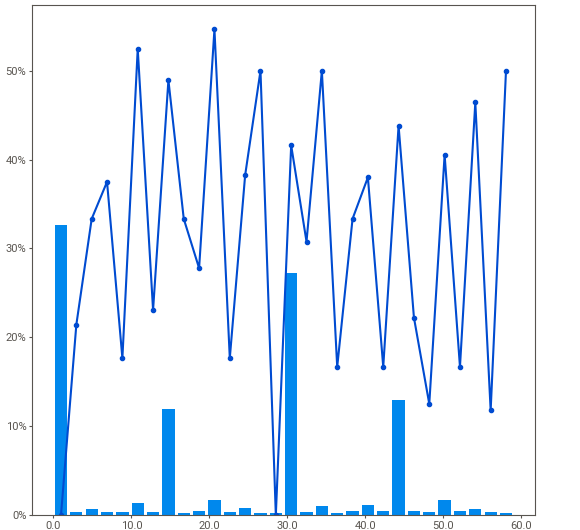
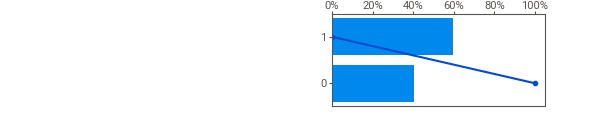
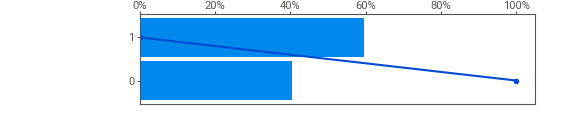
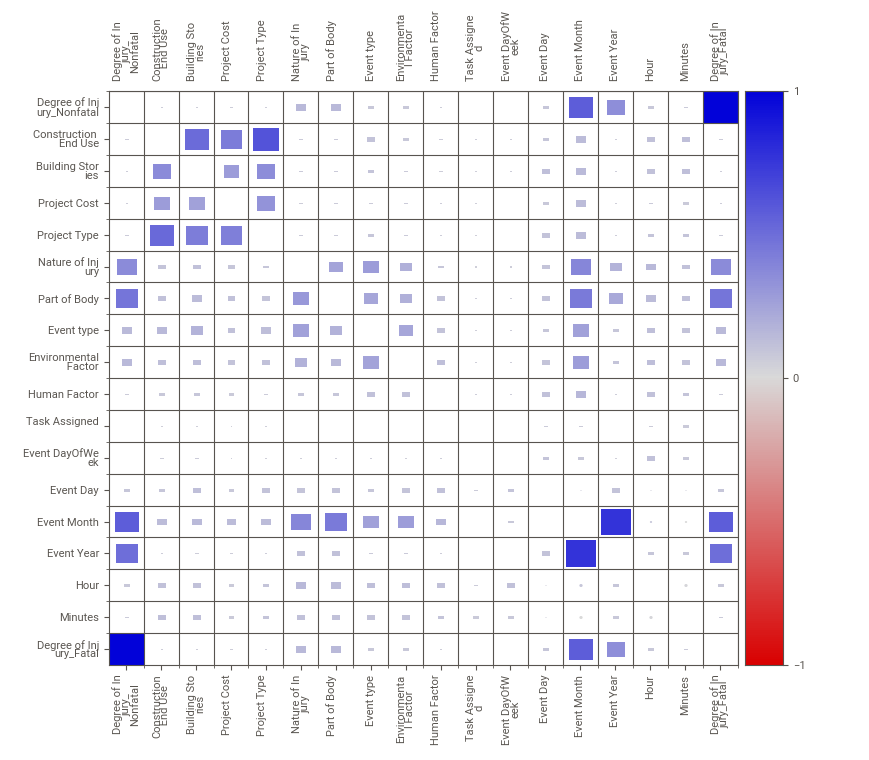
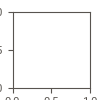

In [131]:
#analyzing the dataset
advert_report = sv.analyze([datasweet,'Construction Accident'],target_feat='Degree of Injury_Nonfatal',pairwise_analysis="on")
#display the report
advert_report.show_notebook(w='100%')

In [132]:
datasweet.drop('Event Date',inplace=True,axis=1)

### Comparing the Outcomes of Target Feature (Fatal & NonFatal)

                                             |                                             | [  0%]   00:00 ->…


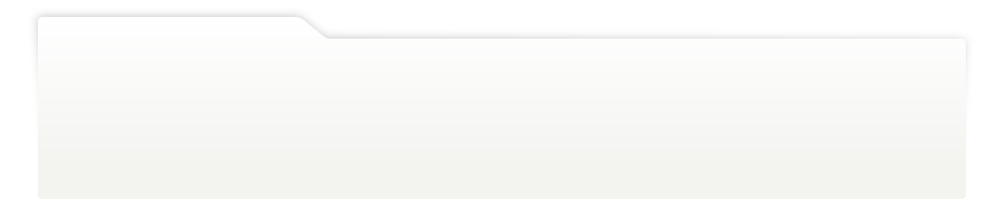
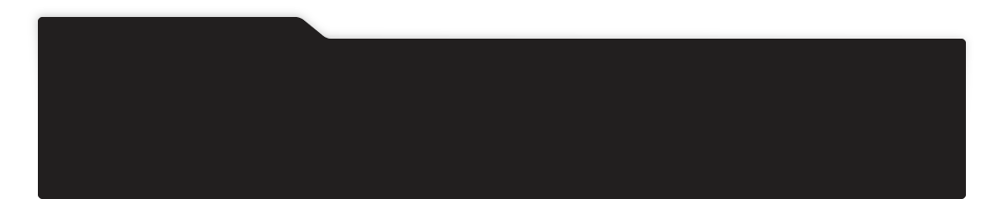
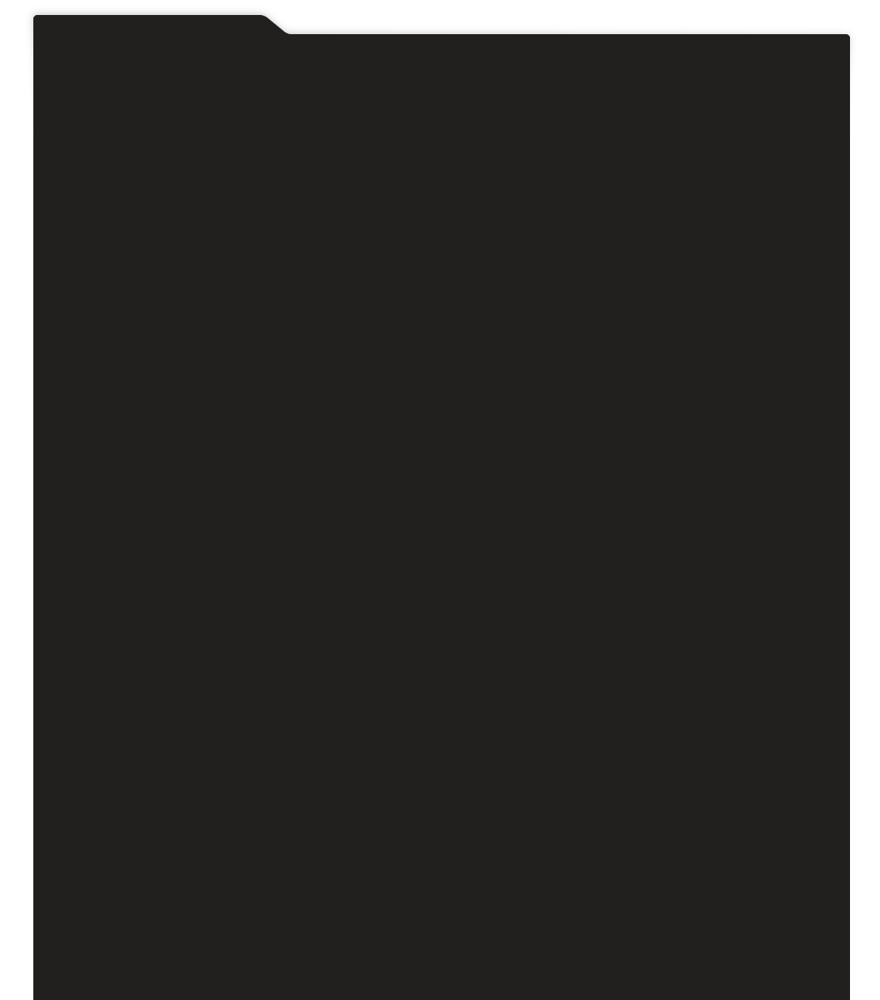
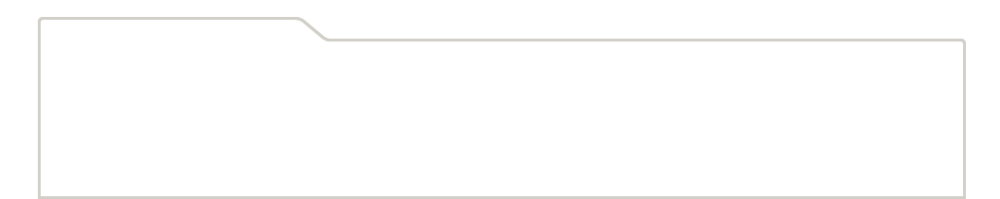
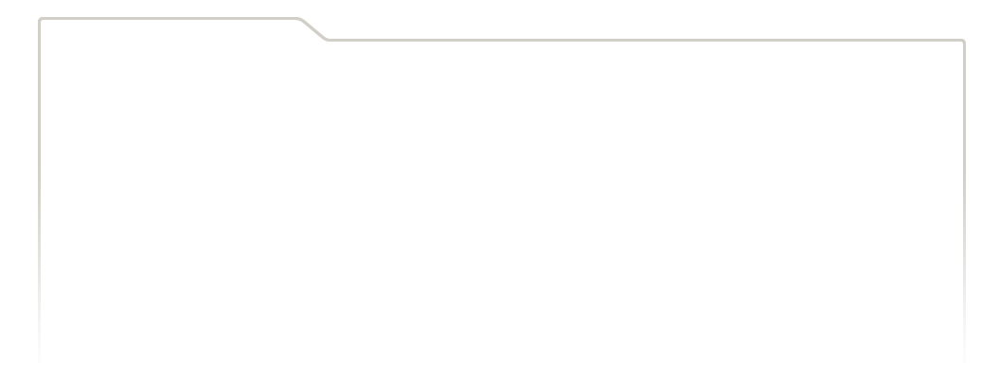
...
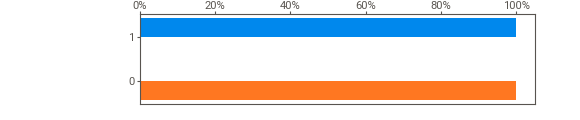
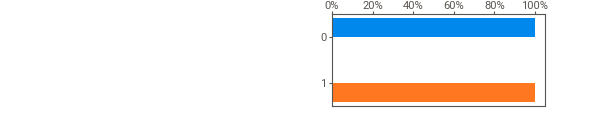
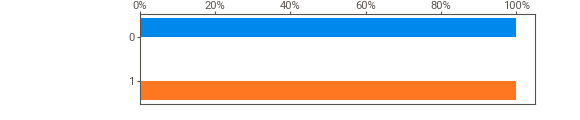
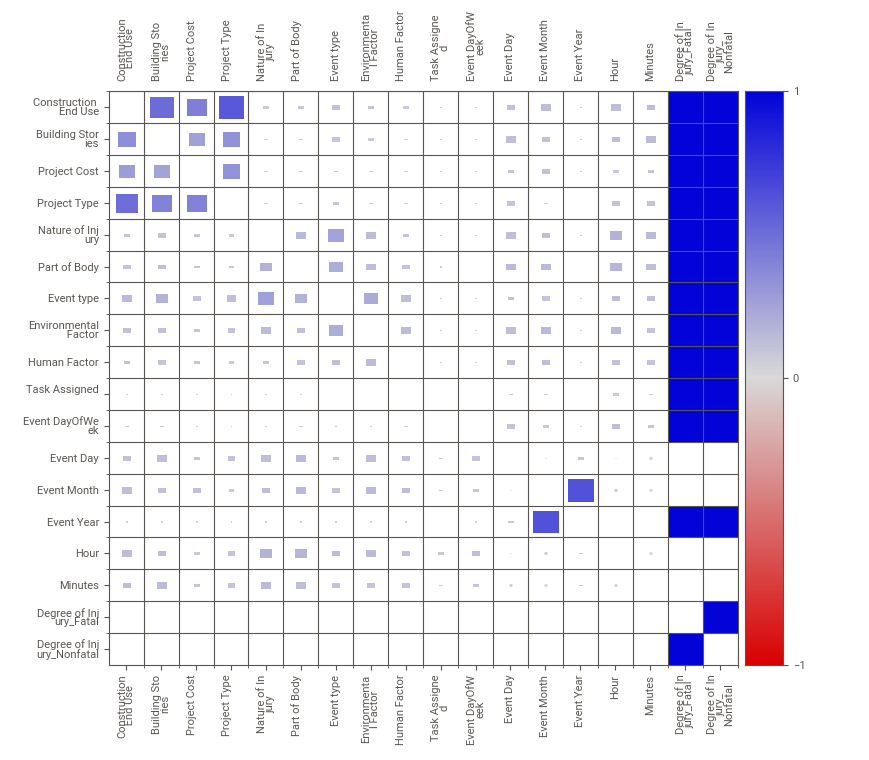
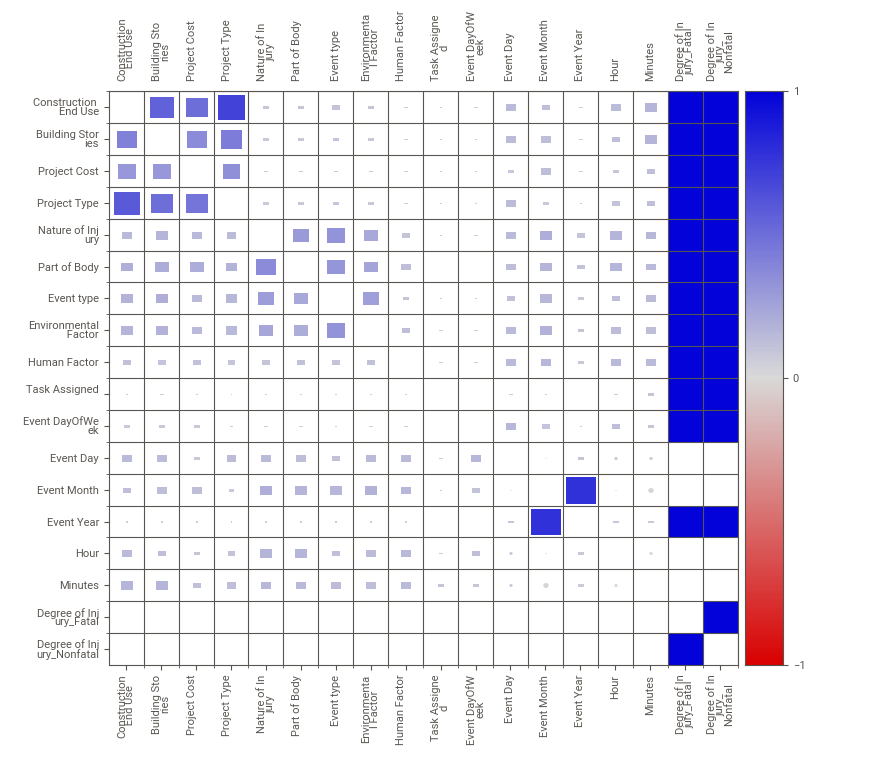

In [133]:
my_report = sv.compare_intra(datasweet, datasweet['Degree of Injury_Nonfatal'] ==0, ["Fatal", "NonFatal"])
my_report.show_notebook(w='100%')

# Association Rule Mining: Apriori

In [134]:
df = data.copy()
df.drop(['Event Date','Event Day','Event Month','Event Year','Hour','Minutes'],axis=1,inplace=True)

In [135]:
df = pd.get_dummies(df)

In [136]:
from mlxtend.frequent_patterns import apriori, association_rules

In [137]:
apriori = apriori(df, min_support = 0.5, use_colnames = True, verbose = 1)
apriori.sort_values(by='support',ascending=False).head(30)

Processing 20 combinations | Sampling itemset size 4


C:\ProgramData\Anaconda3\lib\site-packages\mlxtend\frequent_patterns\fpcommon.py:110: DeprecationWarning: DataFrames with non-bool types result in worse computationalperformance and their support might be discontinued in the future.Please use a DataFrame with bool type
  warnings.warn(


,support,itemsets
2,0.873249,(Project Cost_ )
1,0.851435,(Building Stories_ )
9,0.814007,"(Project Cost_ , Building Stories_ )"
0,0.780941,(Construction End Use_ )
7,0.779564,"(Project Cost_ , Construction End Use_ )"
6,0.773823,"(Building Stories_ , Construction End Use_ )"
15,0.772675,"(Project Cost_ , Building Stories_ , Construct..."
3,0.769460,(Project Type_ )
12,0.769001,"(Project Cost_ , Project Type_ )"
8,0.769001,"(Construction End Use_ , Project Type_ )"


In [138]:
rules = association_rules(apriori, metric = "support", min_threshold = 0.1)
rules.head(30)

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric
0,(Building Stories_ ),(Construction End Use_ ),0.851435,0.780941,0.773823,0.908846,1.163782,0.108902,2.403163,0.947281
1,(Construction End Use_ ),(Building Stories_ ),0.780941,0.851435,0.773823,0.990885,1.163782,0.108902,16.299004,0.642443
2,(Project Cost_ ),(Construction End Use_ ),0.873249,0.780941,0.779564,0.892716,1.143128,0.097607,2.041862,0.987824
3,(Construction End Use_ ),(Project Cost_ ),0.780941,0.873249,0.779564,0.998236,1.143128,0.097607,71.846613,0.571571
4,(Construction End Use_ ),(Project Type_ ),0.780941,0.769460,0.769001,0.984710,1.279741,0.168098,15.078177,0.997871
5,(Project Type_ ),(Construction End Use_ ),0.769460,0.780941,0.769001,0.999403,1.279741,0.168098,367.032606,0.948176
6,(Project Cost_ ),(Building Stories_ ),0.873249,0.851435,0.814007,0.932159,1.094809,0.070492,2.189892,0.683219
7,(Building Stories_ ),(Project Cost_ ),0.851435,0.873249,0.814007,0.956041,1.094809,0.070492,2.883388,0.582901
8,(Building Stories_ ),(Project Type_ ),0.851435,0.769460,0.766246,0.899946,1.169581,0.111100,2.304153,0.975956
9,(Project Type_ ),(Building Stories_ ),0.769460,0.851435,0.766246,0.995822,1.169581,0.111100,35.560062,0.628928


In [139]:
rules[rules['lift'] >= 1].sort_values(by='lift',ascending=False).head(30)

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric
61,(Project Type_ ),"(Project Cost_ , Building Stories_ , Construct...",0.769460,0.772675,0.765786,0.995225,1.288026,0.171244,47.610362,0.969976
48,"(Project Cost_ , Building Stories_ , Construct...",(Project Type_ ),0.772675,0.769460,0.765786,0.991085,1.288026,0.171244,25.858860,0.983693
54,"(Project Cost_ , Project Type_ )","(Building Stories_ , Construction End Use_ )",0.769001,0.773823,0.765786,0.995820,1.286883,0.170716,54.104724,0.965063
55,"(Building Stories_ , Construction End Use_ )","(Project Cost_ , Project Type_ )",0.773823,0.769001,0.765786,0.989614,1.286883,0.170716,22.241889,0.985638
29,(Project Type_ ),"(Building Stories_ , Construction End Use_ )",0.769460,0.773823,0.766016,0.995524,1.286500,0.170590,50.527899,0.965983
24,"(Building Stories_ , Construction End Use_ )",(Project Type_ ),0.773823,0.769460,0.766016,0.989911,1.286500,0.170590,22.850544,0.984616
53,"(Project Cost_ , Construction End Use_ )","(Building Stories_ , Project Type_ )",0.779564,0.766246,0.765786,0.982327,1.282000,0.168449,13.226598,0.997879
56,"(Building Stories_ , Project Type_ )","(Project Cost_ , Construction End Use_ )",0.766246,0.779564,0.765786,0.999401,1.282000,0.168449,367.797933,0.941026
30,"(Project Cost_ , Construction End Use_ )",(Project Type_ ),0.779564,0.769460,0.768772,0.986156,1.281620,0.168928,16.652808,0.996831
35,(Project Type_ ),"(Project Cost_ , Construction End Use_ )",0.769460,0.779564,0.768772,0.999105,1.281620,0.168928,246.227325,0.953145


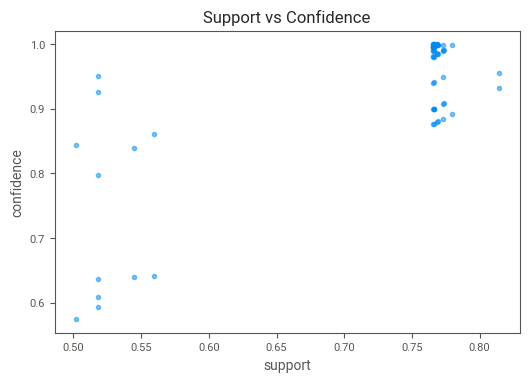

In [140]:
plt.scatter(rules['support'], rules['confidence'], alpha=0.5)
plt.xlabel('support')
plt.ylabel('confidence')
plt.title('Support vs Confidence')
plt.show()

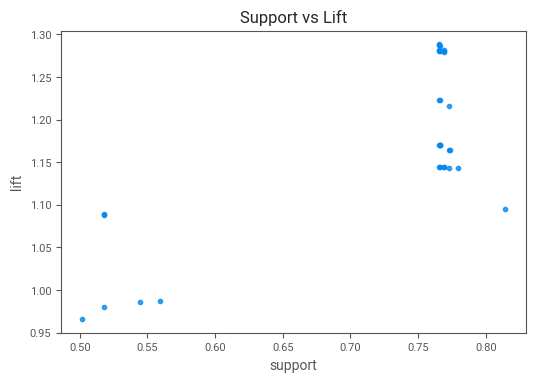

In [141]:
plt.scatter(rules['support'], rules['lift'], alpha=0.5)
plt.xlabel('support')
plt.ylabel('lift')
plt.title('Support vs Lift')
plt.show()

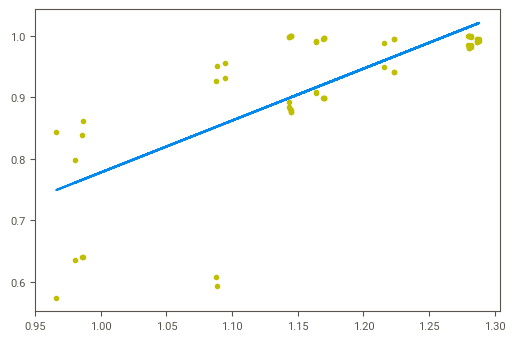

In [142]:
fit = np.polyfit(rules['lift'], rules['confidence'], 1)
fit_fn = np.poly1d(fit)
plt.plot(rules['lift'], rules['confidence'], 'yo', rules['lift'], 
 fit_fn(rules['lift']))

# Build Dataset For Predicting

In [143]:
data.drop(['Construction End Use','Building Stories','Project Cost','Project Type','Time','Event Date'],axis=1,inplace=True)

In [144]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4355 entries, 0 to 4846
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   Degree of Injury      4355 non-null   object
 1   Nature of Injury      4355 non-null   object
 2   Part of Body          4355 non-null   object
 3   Event type            4355 non-null   object
 4   Environmental Factor  4355 non-null   object
 5   Human Factor          4355 non-null   object
 6   Task Assigned         4355 non-null   object
 7   Event DayOfWeek       4355 non-null   object
 8   Event Day             4355 non-null   int64 
 9   Event Month           4355 non-null   int64 
 10  Event Year            4355 non-null   int64 
 11  Hour                  4355 non-null   int64 
 12  Minutes               4355 non-null   int64 
dtypes: int64(5), object(8)
memory usage: 605.4+ KB


In [145]:
data.head()

,Degree of Injury,Nature of Injury,Part of Body,Event type,Environmental Factor,Human Factor,Task Assigned,Event DayOfWeek,Event Day,Event Month,Event Year,Hour,Minutes
0,Nonfatal,"Amputation, Crushing",Fingers,Caught in or between,Catch Point/Puncture Action,Other,Regularly Assigned,Thu,10,8,2017,9,0
1,Nonfatal,Dislocation,Fingers,Caught in or between,Other,Position Inappropriate For Task,Regularly Assigned,Mon,17,7,2017,9,45
2,Nonfatal,Fire Burn,Hand,Other,Other,Malfunction In Securing/Warning Op,Not Regularly Assigned,Fri,30,6,2017,7,30
3,Fatal,Serious Fall/Strike,Head,Fall (from elevation),Work-Surface/Facility-Layout Condition,Other,Regularly Assigned,Fri,30,6,2017,14,0
4,Nonfatal,"Bruising, Contusion",Neck,Struck-by,Overhead Moving/Falling Object Action,Insufficient/Lack/Housekeeping Program,Regularly Assigned,Fri,23,6,2017,12,20


## Hash Encoding

In [146]:
enc = HashingEncoder(verbose=1,n_components=3,max_process=1)

In [147]:
data_NOI = enc.fit_transform(data['Nature of Injury'],axis=1)

In [148]:
data_NOI

,col_0,col_1,col_2
0,0,0,1
1,1,0,0
2,1,0,0
3,0,0,1
4,1,0,0
...,...,...,...
4842,0,1,0
4843,0,0,1
4844,0,0,1
4845,0,0,1


In [149]:
data_NOI.rename(columns={'col_0':'NOI_1','col_1':'NOI_2','col_2':'NOI_3'},inplace=True)

In [150]:
data_NOI

,NOI_1,NOI_2,NOI_3
0,0,0,1
1,1,0,0
2,1,0,0
3,0,0,1
4,1,0,0
...,...,...,...
4842,0,1,0
4843,0,0,1
4844,0,0,1
4845,0,0,1


In [151]:
enc = HashingEncoder(verbose=1,n_components=4,max_process=1)

In [152]:
data_POB = enc.fit_transform(data['Part of Body'],axis=1)

In [153]:
data_POB

,col_0,col_1,col_2,col_3
0,0,1,0,0
1,0,1,0,0
2,1,0,0,0
3,0,0,1,0
4,0,0,0,1
...,...,...,...,...
4842,0,1,0,0
4843,0,0,1,0
4844,0,1,0,0
4845,0,1,0,0


In [154]:
data_POB.rename(columns={'col_0':'POB_1','col_1':'POB_2','col_2':'POB_3','col_3':'POB_4'},inplace=True)

In [155]:
data_POB

,POB_1,POB_2,POB_3,POB_4
0,0,1,0,0
1,0,1,0,0
2,1,0,0,0
3,0,0,1,0
4,0,0,0,1
...,...,...,...,...
4842,0,1,0,0
4843,0,0,1,0
4844,0,1,0,0
4845,0,1,0,0


In [156]:
enc = HashingEncoder(verbose=1,n_components=3,max_process=1)

In [157]:
data_ET = enc.fit_transform(data['Event type'],axis=1)

In [158]:
data_ET.rename(columns={'col_0':'ET_1','col_1':'ET_2','col_2':'ET_3'},inplace=True)

In [159]:
data_ET

,ET_1,ET_2,ET_3
0,1,0,0
1,1,0,0
2,1,0,0
3,1,0,0
4,1,0,0
...,...,...,...
4842,1,0,0
4843,1,0,0
4844,1,0,0
4845,1,0,0


In [160]:
data_EF = enc.fit_transform(data['Environmental Factor'],axis=1)

In [161]:
data_EF.rename(columns={'col_0':'EF_1','col_1':'EF_2','col_2':'EF_3'},inplace=True)

In [162]:
data_EF

,EF_1,EF_2,EF_3
0,0,1,0
1,1,0,0
2,1,0,0
3,0,0,1
4,1,0,0
...,...,...,...
4842,1,0,0
4843,0,0,1
4844,1,0,0
4845,0,0,1


In [163]:
data_HF = enc.fit_transform(data['Human Factor'],axis=1)

In [164]:
data_HF.rename(columns={'col_0':'HF_1','col_1':'HF_2','col_2':'HF_3'},inplace=True)

In [165]:
data_HF

,HF_1,HF_2,HF_3
0,1,0,0
1,1,0,0
2,1,0,0
3,1,0,0
4,0,1,0
...,...,...,...
4842,1,0,0
4843,0,1,0
4844,1,0,0
4845,0,1,0


In [166]:
data_EDOW = enc.fit_transform(data['Event DayOfWeek'],axis=1)

In [167]:
data_EDOW.rename(columns={'col_0':'EDOW_1','col_1':'EDOW_2','col_2':'EDOW_3'},inplace=True)

In [168]:
data_EDOW

,EDOW_1,EDOW_2,EDOW_3
0,0,1,0
1,1,0,0
2,0,1,0
3,0,1,0
4,0,1,0
...,...,...,...
4842,0,0,1
4843,0,0,1
4844,0,0,1
4845,0,0,1


In [169]:
data = pd.concat((data_NOI,data_POB,data_ET,data_EF,data_HF,data_EDOW,data['Task Assigned'],data['Event Day'],
                  data['Event Month'],data['Event Year'],data['Hour'],data['Minutes'],
                  data['Degree of Injury']),axis=1)

In [170]:
data

,NOI_1,NOI_2,NOI_3,POB_1,POB_2,POB_3,POB_4,ET_1,ET_2,ET_3,...,EDOW_1,EDOW_2,EDOW_3,Task Assigned,Event Day,Event Month,Event Year,Hour,Minutes,Degree of Injury
0,0,0,1,0,1,0,0,1,0,0,...,0,1,0,Regularly Assigned,10,8,2017,9,0,Nonfatal
1,1,0,0,0,1,0,0,1,0,0,...,1,0,0,Regularly Assigned,17,7,2017,9,45,Nonfatal
2,1,0,0,1,0,0,0,1,0,0,...,0,1,0,Not Regularly Assigned,30,6,2017,7,30,Nonfatal
3,0,0,1,0,0,1,0,1,0,0,...,0,1,0,Regularly Assigned,30,6,2017,14,0,Fatal
4,1,0,0,0,0,0,1,1,0,0,...,0,1,0,Regularly Assigned,23,6,2017,12,20,Nonfatal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4842,0,1,0,0,1,0,0,1,0,0,...,0,0,1,Regularly Assigned,1,7,2015,9,15,Fatal
4843,0,0,1,0,0,1,0,1,0,0,...,0,0,1,Not Regularly Assigned,1,7,2015,8,30,Fatal
4844,0,0,1,0,1,0,0,1,0,0,...,0,0,1,Regularly Assigned,1,7,2015,15,0,Fatal
4845,0,0,1,0,1,0,0,1,0,0,...,0,0,1,Regularly Assigned,1,7,2015,14,30,Fatal


In [171]:
data = pd.get_dummies(data,columns=['Degree of Injury','Task Assigned'],drop_first=True)
data

,NOI_1,NOI_2,NOI_3,POB_1,POB_2,POB_3,POB_4,ET_1,ET_2,ET_3,...,EDOW_1,EDOW_2,EDOW_3,Event Day,Event Month,Event Year,Hour,Minutes,Degree of Injury_Nonfatal,Task Assigned_Regularly Assigned
0,0,0,1,0,1,0,0,1,0,0,...,0,1,0,10,8,2017,9,0,1,1
1,1,0,0,0,1,0,0,1,0,0,...,1,0,0,17,7,2017,9,45,1,1
2,1,0,0,1,0,0,0,1,0,0,...,0,1,0,30,6,2017,7,30,1,0
3,0,0,1,0,0,1,0,1,0,0,...,0,1,0,30,6,2017,14,0,0,1
4,1,0,0,0,0,0,1,1,0,0,...,0,1,0,23,6,2017,12,20,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4842,0,1,0,0,1,0,0,1,0,0,...,0,0,1,1,7,2015,9,15,0,1
4843,0,0,1,0,0,1,0,1,0,0,...,0,0,1,1,7,2015,8,30,0,0
4844,0,0,1,0,1,0,0,1,0,0,...,0,0,1,1,7,2015,15,0,0,1
4845,0,0,1,0,1,0,0,1,0,0,...,0,0,1,1,7,2015,14,30,0,1


# Train Valid Test Split

**Train Dataset:**

Set of data used for learning (by the model), that is, to fit the parameters to the machine learning model

**Valid Dataset:**

Set of data used to provide an unbiased evaluation of a model fitted on the training dataset while tuning model hyperparameters.
Also play a role in other forms of model preparation, such as feature selection, threshold cut-off selection.

**Test Dataset:**

Set of data used to provide an unbiased evaluation of a final model fitted on the training dataset.

In [172]:
from fast_ml.model_development import train_valid_test_split

In [173]:
X_train, y_train, X_valid, y_valid, X_test, y_test = train_valid_test_split(data, target = 'Degree of Injury_Nonfatal', 
                                                                            train_size=0.7, valid_size=0.1, test_size=0.2,
                                                                           random_state=101)

print(X_train.shape), print(y_train.shape)
print(X_valid.shape), print(y_valid.shape)
print(X_test.shape), print(y_test.shape)

(3048, 25)
(3048,)
(435, 25)
(435,)
(872, 25)
(872,)


(None, None)

In [174]:
X_train

,NOI_1,NOI_2,NOI_3,POB_1,POB_2,POB_3,POB_4,ET_1,ET_2,ET_3,...,HF_3,EDOW_1,EDOW_2,EDOW_3,Event Day,Event Month,Event Year,Hour,Minutes,Task Assigned_Regularly Assigned
3567,0,0,1,0,0,1,0,1,0,0,...,0,0,0,1,23,4,2016,7,15,0
3483,0,0,1,0,1,0,0,1,0,0,...,1,0,0,1,11,5,2016,8,15,0
3588,1,0,0,0,0,1,0,1,0,0,...,1,1,0,0,18,4,2016,8,30,1
335,1,0,0,0,0,1,0,1,0,0,...,0,0,1,0,14,4,2017,7,30,1
2910,0,1,0,0,0,1,0,1,0,0,...,0,0,1,0,1,9,2016,17,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4549,0,1,0,0,1,0,0,1,0,0,...,0,0,1,0,1,9,2015,9,40,0
4649,1,0,0,0,0,0,1,1,0,0,...,0,0,1,0,13,8,2015,15,45,1
665,1,0,0,0,0,0,1,1,0,0,...,0,1,0,0,27,3,2017,16,0,1
1472,0,0,1,0,0,1,0,1,0,0,...,0,1,0,0,12,2,2017,18,45,1


In [175]:
y_train

3567    0
3483    0
3588    0
335     1
2910    0
       ..
4549    0
4649    0
665     0
1472    0
1681    1
Name: Degree of Injury_Nonfatal, Length: 3048, dtype: uint8

In [176]:
X_valid

,NOI_1,NOI_2,NOI_3,POB_1,POB_2,POB_3,POB_4,ET_1,ET_2,ET_3,...,HF_3,EDOW_1,EDOW_2,EDOW_3,Event Day,Event Month,Event Year,Hour,Minutes,Task Assigned_Regularly Assigned
3857,0,0,1,0,1,0,0,1,0,0,...,0,0,1,0,18,2,2016,9,30,0
3011,0,1,0,0,0,0,1,1,0,0,...,0,1,0,0,15,8,2016,13,30,1
1838,0,0,1,0,1,0,0,1,0,0,...,1,0,1,0,26,1,2017,14,0,1
1824,0,0,1,0,0,0,1,1,0,0,...,1,0,1,0,26,1,2017,12,45,0
2283,1,0,0,0,1,0,0,1,0,0,...,0,0,1,0,3,1,2017,10,20,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2241,0,0,1,0,1,0,0,1,0,0,...,0,0,1,0,5,1,2017,11,15,0
2258,0,0,1,1,0,0,0,1,0,0,...,0,0,0,1,4,1,2017,12,15,1
2047,0,1,0,0,0,1,0,1,0,0,...,0,0,1,0,17,1,2017,15,30,0
72,0,1,0,0,0,0,1,1,0,0,...,0,0,1,0,16,5,2017,17,15,0


In [177]:
y_valid

3857    0
3011    0
1838    1
1824    1
2283    1
       ..
2241    1
2258    1
2047    1
72      0
2116    0
Name: Degree of Injury_Nonfatal, Length: 435, dtype: uint8

In [178]:
X_train

,NOI_1,NOI_2,NOI_3,POB_1,POB_2,POB_3,POB_4,ET_1,ET_2,ET_3,...,HF_3,EDOW_1,EDOW_2,EDOW_3,Event Day,Event Month,Event Year,Hour,Minutes,Task Assigned_Regularly Assigned
3567,0,0,1,0,0,1,0,1,0,0,...,0,0,0,1,23,4,2016,7,15,0
3483,0,0,1,0,1,0,0,1,0,0,...,1,0,0,1,11,5,2016,8,15,0
3588,1,0,0,0,0,1,0,1,0,0,...,1,1,0,0,18,4,2016,8,30,1
335,1,0,0,0,0,1,0,1,0,0,...,0,0,1,0,14,4,2017,7,30,1
2910,0,1,0,0,0,1,0,1,0,0,...,0,0,1,0,1,9,2016,17,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4549,0,1,0,0,1,0,0,1,0,0,...,0,0,1,0,1,9,2015,9,40,0
4649,1,0,0,0,0,0,1,1,0,0,...,0,0,1,0,13,8,2015,15,45,1
665,1,0,0,0,0,0,1,1,0,0,...,0,1,0,0,27,3,2017,16,0,1
1472,0,0,1,0,0,1,0,1,0,0,...,0,1,0,0,12,2,2017,18,45,1


In [179]:
y_test

2570    0
3919    0
1013    1
370     0
1941    0
       ..
1498    1
1020    1
2285    1
577     1
260     0
Name: Degree of Injury_Nonfatal, Length: 872, dtype: uint8

# Predictions

## Logistic Regression

In [180]:
from sklearn.linear_model import LogisticRegression

In [181]:
lr = LogisticRegression(random_state=101)

In [182]:
lr.fit(X_train,y_train)

LogisticRegression(random_state=101)

In [183]:
pred = lr.predict(X_valid)

In [184]:
print('Score:\n',lr.score(X_valid,y_valid),'\n')

from sklearn.metrics import confusion_matrix
print('Confusion Matrix:\n',confusion_matrix(y_valid,pred),'\n')

from sklearn.metrics import classification_report
print('Classification Report:\n',classification_report(y_valid,pred))

Score:
 0.7931034482758621 

Confusion Matrix:
 [[210  48]
 [ 42 135]] 

Classification Report:
               precision    recall  f1-score   support

           0       0.83      0.81      0.82       258
           1       0.74      0.76      0.75       177

    accuracy                           0.79       435
   macro avg       0.79      0.79      0.79       435
weighted avg       0.79      0.79      0.79       435



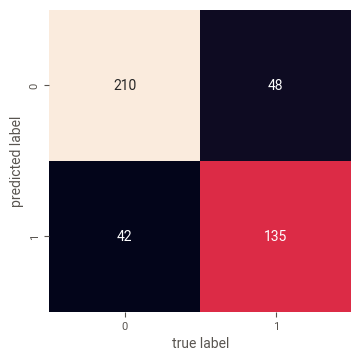

In [185]:
mat_T = confusion_matrix(y_valid,pred)
sns.heatmap(mat_T, square=True, annot=True,fmt='d',cbar=False)
plt.xlabel('true label')
plt.ylabel('predicted label');

In [186]:
df_eval = pd.DataFrame({'Label':y_valid,
                        'Prediction': pred})
df_eval

,Label,Prediction
3857,0,1
3011,0,0
1838,1,1
1824,1,1
2283,1,1
...,...,...
2241,1,1
2258,1,1
2047,1,0
72,0,0


## K Nearest Neighbors

In [187]:
from sklearn.preprocessing import StandardScaler

In [188]:
scaler = StandardScaler()

In [189]:
scaler.fit(data.drop(['Degree of Injury_Nonfatal'],axis=1))

StandardScaler()

In [190]:
scaled_features = scaler.transform(data.drop(['Degree of Injury_Nonfatal'],axis=1))

In [191]:
df_feat = pd.DataFrame(scaled_features,columns = data.columns[:-1])
df_feat

,NOI_1,NOI_2,NOI_3,POB_1,POB_2,POB_3,POB_4,ET_1,ET_2,ET_3,...,HF_3,EDOW_1,EDOW_2,EDOW_3,Event Day,Event Month,Event Year,Hour,Minutes,Degree of Injury_Nonfatal
0,-0.561173,-0.387281,0.766224,-0.277796,1.26860,-0.584156,-0.640189,0.281613,-0.168331,-0.219396,...,-0.395474,-0.533181,0.982924,-0.608217,-0.648730,0.841180,0.913011,-0.687762,-1.178332,0.735189
1,1.781981,-0.387281,-1.305101,-0.277796,1.26860,-0.584156,-0.640189,0.281613,-0.168331,-0.219396,...,-0.395474,1.875536,-1.017372,-0.608217,0.177358,0.550946,0.913011,-0.687762,1.411746,0.735189
2,1.781981,-0.387281,-1.305101,3.599769,-0.78827,-0.584156,-0.640189,0.281613,-0.168331,-0.219396,...,-0.395474,-0.533181,0.982924,-0.608217,1.711521,0.260711,0.913011,-1.150520,0.548387,-1.360195
3,-0.561173,-0.387281,0.766224,-0.277796,-0.78827,1.711872,-0.640189,0.281613,-0.168331,-0.219396,...,-0.395474,-0.533181,0.982924,-0.608217,1.711521,0.260711,0.913011,0.469134,-1.178332,0.735189
4,1.781981,-0.387281,-1.305101,-0.277796,-0.78827,-0.584156,1.562040,0.281613,-0.168331,-0.219396,...,-0.395474,-0.533181,0.982924,-0.608217,0.885433,0.260711,0.913011,0.006376,-0.027186,0.735189
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4350,-0.561173,2.582103,-1.305101,-0.277796,1.26860,-0.584156,-0.640189,0.281613,-0.168331,-0.219396,...,-0.395474,-0.533181,-1.017372,1.644151,-1.710843,0.550946,-1.799242,-0.687762,-0.314973,0.735189
4351,-0.561173,-0.387281,0.766224,-0.277796,-0.78827,1.711872,-0.640189,0.281613,-0.168331,-0.219396,...,-0.395474,-0.533181,-1.017372,1.644151,-1.710843,0.550946,-1.799242,-0.919141,0.548387,-1.360195
4352,-0.561173,-0.387281,0.766224,-0.277796,1.26860,-0.584156,-0.640189,0.281613,-0.168331,-0.219396,...,-0.395474,-0.533181,-1.017372,1.644151,-1.710843,0.550946,-1.799242,0.700513,-1.178332,0.735189
4353,-0.561173,-0.387281,0.766224,-0.277796,1.26860,-0.584156,-0.640189,0.281613,-0.168331,-0.219396,...,-0.395474,-0.533181,-1.017372,1.644151,-1.710843,0.550946,-1.799242,0.469134,0.548387,0.735189


In [192]:
from sklearn.neighbors import KNeighborsClassifier
knn = KNeighborsClassifier(n_neighbors=1)
knn.fit(X_train,y_train)
pred = knn.predict(X_valid)
print('Score:\n',knn.score(X_valid,y_valid),'\n')

from sklearn.metrics import confusion_matrix
print('Confusion Matrix:\n',confusion_matrix(y_valid,pred),'\n')

from sklearn.metrics import classification_report
print('Classification Report:\n',classification_report(y_valid,pred))

Score:
 0.7632183908045977 

Confusion Matrix:
 [[198  60]
 [ 43 134]] 

Classification Report:
               precision    recall  f1-score   support

           0       0.82      0.77      0.79       258
           1       0.69      0.76      0.72       177

    accuracy                           0.76       435
   macro avg       0.76      0.76      0.76       435
weighted avg       0.77      0.76      0.76       435



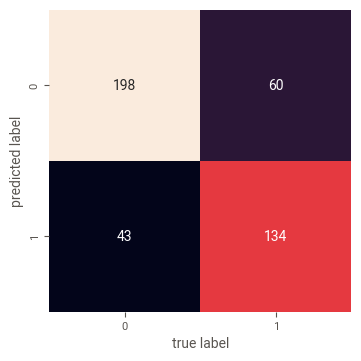

In [193]:
mat_T = confusion_matrix(y_valid,pred)
sns.heatmap(mat_T, square=True, annot=True,fmt='d',cbar=False)
plt.xlabel('true label')
plt.ylabel('predicted label');

In [194]:
error_rate = []
for i in range(1,40):
    knn = KNeighborsClassifier(n_neighbors= i)
    knn.fit(X_train,y_train)
    pred_i = knn.predict(X_valid)
    error_rate.append(np.mean(pred_i != y_valid))

Text(0, 0.5, 'ERROR RATE')

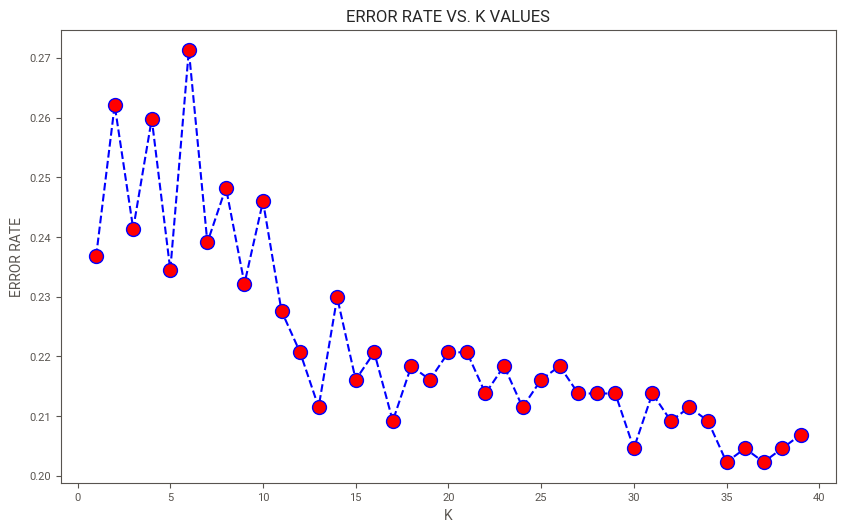

In [195]:
plt.figure(figsize=(10,6))
plt.plot(range(1,40),error_rate,color='blue',ls='--',marker='o',markerfacecolor='red',markersize=10)
plt.title('ERROR RATE VS. K VALUES')
plt.xlabel('K')
plt.ylabel('ERROR RATE')

In [196]:
from sklearn.neighbors import KNeighborsClassifier
knn = KNeighborsClassifier(n_neighbors=5)
knn.fit(X_train,y_train)
pred = knn.predict(X_valid)
print('Score:\n',knn.score(X_valid,y_valid),'\n')

from sklearn.metrics import confusion_matrix
print('Confusion Matrix:\n',confusion_matrix(y_valid,pred),'\n')

from sklearn.metrics import classification_report
print('Classification Report:\n',classification_report(y_valid,pred))

Score:
 0.7655172413793103 

Confusion Matrix:
 [[191  67]
 [ 35 142]] 

Classification Report:
               precision    recall  f1-score   support

           0       0.85      0.74      0.79       258
           1       0.68      0.80      0.74       177

    accuracy                           0.77       435
   macro avg       0.76      0.77      0.76       435
weighted avg       0.78      0.77      0.77       435



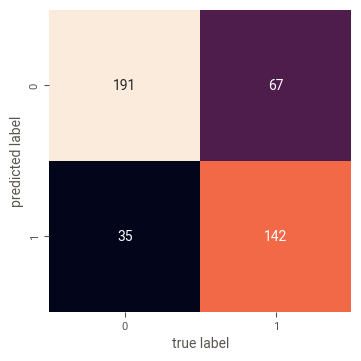

In [197]:
mat_T = confusion_matrix(y_valid,pred)
sns.heatmap(mat_T, square=True, annot=True,fmt='d',cbar=False)
plt.xlabel('true label')
plt.ylabel('predicted label');

## Decision Tree

In [198]:
from sklearn.tree import DecisionTreeClassifier

In [199]:
dt = DecisionTreeClassifier(random_state=101)

In [200]:
dt.fit(X_train,y_train)

DecisionTreeClassifier(random_state=101)

In [201]:
pred = dt.predict(X_valid)

In [202]:
print('Score:\n',dt.score(X_valid,y_valid),'\n')

from sklearn.metrics import confusion_matrix
print('Confusion Matrix:\n',confusion_matrix(y_valid,pred),'\n')

from sklearn.metrics import classification_report
print('Classification Report:\n',classification_report(y_valid,pred))

Score:
 0.8367816091954023 

Confusion Matrix:
 [[220  38]
 [ 33 144]] 

Classification Report:
               precision    recall  f1-score   support

           0       0.87      0.85      0.86       258
           1       0.79      0.81      0.80       177

    accuracy                           0.84       435
   macro avg       0.83      0.83      0.83       435
weighted avg       0.84      0.84      0.84       435



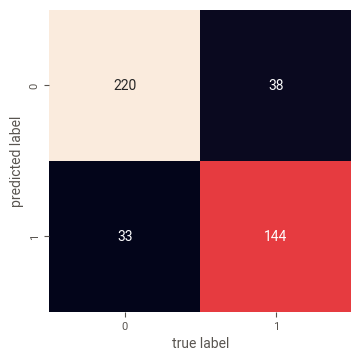

In [203]:
mat_T = confusion_matrix(y_valid,pred)
sns.heatmap(mat_T, square=True, annot=True,fmt='d',cbar=False)
plt.xlabel('true label')
plt.ylabel('predicted label');

In [204]:
df_eval = pd.DataFrame({'Label':y_valid,
                        'Prediction': pred})
df_eval

,Label,Prediction
3857,0,0
3011,0,0
1838,1,1
1824,1,0
2283,1,0
...,...,...
2241,1,1
2258,1,1
2047,1,1
72,0,0


In [205]:
from sklearn.tree import plot_tree
plt.figure(figsize=(180,120))
plot_tree(dt, filled=True)
plt.title("Decision Tree")
plt.savefig('Decision Tree Visualize.jpg')

In [206]:
pd.DataFrame(data=dt.feature_importances_,index=X_train.columns,columns=['Value']).sort_values(by='Value',ascending=False)

,Value
Event Year,0.559517
Event Month,0.104365
Event Day,0.067043
Hour,0.052529
Minutes,0.048114
POB_3,0.019579
HF_1,0.012186
Task Assigned_Regularly Assigned,0.012071
EDOW_2,0.011526
NOI_3,0.011102


### Hyper Parameter For Decision Tree

In [207]:
param_grid = {'criterion':['gini','entropy'],'splitter':['best', 'random']}

In [208]:
from sklearn.model_selection import GridSearchCV
grid1 = GridSearchCV(DecisionTreeClassifier(random_state=101),param_grid,refit=True,verbose=3)
grid1.fit(X_train,y_train)
pred = grid1.predict(X_valid)

Fitting 5 folds for each of 4 candidates, totalling 20 fits
[CV 1/5] END .....criterion=gini, splitter=best;, score=0.813 total time=   0.0s
[CV 2/5] END .....criterion=gini, splitter=best;, score=0.828 total time=   0.0s
[CV 3/5] END .....criterion=gini, splitter=best;, score=0.813 total time=   0.0s
[CV 4/5] END .....criterion=gini, splitter=best;, score=0.834 total time=   0.0s
[CV 5/5] END .....criterion=gini, splitter=best;, score=0.800 total time=   0.0s
[CV 1/5] END ...criterion=gini, splitter=random;, score=0.798 total time=   0.0s
[CV 2/5] END ...criterion=gini, splitter=random;, score=0.833 total time=   0.0s
[CV 3/5] END ...criterion=gini, splitter=random;, score=0.803 total time=   0.0s
[CV 4/5] END ...criterion=gini, splitter=random;, score=0.824 total time=   0.0s
[CV 5/5] END ...criterion=gini, splitter=random;, score=0.824 total time=   0.0s
[CV 1/5] END ..criterion=entropy, splitter=best;, score=0.795 total time=   0.0s
[CV 2/5] END ..criterion=entropy, splitter=best;,

In [209]:
grid1.best_params_

{'criterion': 'entropy', 'splitter': 'random'}

In [210]:
print('Score:\n',grid1.score(X_valid,y_valid),'\n')

from sklearn.metrics import confusion_matrix
print('Confusion Matrix:\n',confusion_matrix(y_valid,pred),'\n')

from sklearn.metrics import classification_report
print('Classification Report:\n',classification_report(y_valid,pred))

Score:
 0.8413793103448276 

Confusion Matrix:
 [[219  39]
 [ 30 147]] 

Classification Report:
               precision    recall  f1-score   support

           0       0.88      0.85      0.86       258
           1       0.79      0.83      0.81       177

    accuracy                           0.84       435
   macro avg       0.83      0.84      0.84       435
weighted avg       0.84      0.84      0.84       435



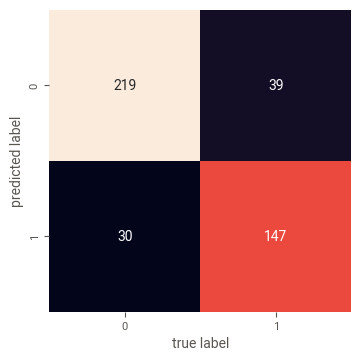

In [211]:
mat_T = confusion_matrix(y_valid,pred)
sns.heatmap(mat_T, square=True, annot=True,fmt='d',cbar=False)
plt.xlabel('true label')
plt.ylabel('predicted label');

## Random Forest

In [212]:
from sklearn.ensemble import RandomForestClassifier

In [213]:
rf = RandomForestClassifier(n_estimators=100,random_state=101)

In [214]:
rf.fit(X_train,y_train)

RandomForestClassifier(random_state=101)

In [215]:
pred_rf = rf.predict(X_valid)

In [216]:
df_eval = pd.DataFrame({'Label':y_valid,
                        'Prediction': pred_rf
                        })
df_eval

,Label,Prediction
3857,0,0
3011,0,0
1838,1,1
1824,1,1
2283,1,1
...,...,...
2241,1,1
2258,1,1
2047,1,0
72,0,0


In [217]:
print('Score:\n',rf.score(X_valid,y_valid),'\n')

from sklearn.metrics import confusion_matrix
print('Confusion Matrix:\n',confusion_matrix(y_valid,pred_rf),'\n')

from sklearn.metrics import classification_report
print('Classification Report:\n',classification_report(y_valid,pred_rf))

Score:
 0.8873563218390804 

Confusion Matrix:
 [[229  29]
 [ 20 157]] 

Classification Report:
               precision    recall  f1-score   support

           0       0.92      0.89      0.90       258
           1       0.84      0.89      0.87       177

    accuracy                           0.89       435
   macro avg       0.88      0.89      0.88       435
weighted avg       0.89      0.89      0.89       435



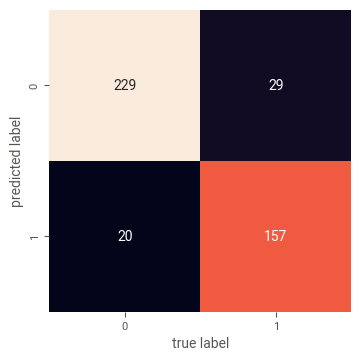

In [218]:
mat_T = confusion_matrix(y_valid,pred_rf)
sns.heatmap(mat_T, square=True, annot=True,fmt='d',cbar=False)
plt.xlabel('true label')
plt.ylabel('predicted label');

In [219]:
pd.DataFrame(data=rf.feature_importances_,index=X_train.columns,columns=['Value']).sort_values(by='Value',ascending=False)

,Value
Event Year,0.339030
Event Month,0.221358
Event Day,0.068683
Hour,0.067433
Minutes,0.046016
POB_3,0.028938
POB_1,0.022458
EF_1,0.021222
EF_2,0.019803
POB_2,0.016934


### Hyper Parameter For Random Forest

In [220]:
param_grid = {'n_estimators':[50,100,150,200,250,500],'criterion':['gini', 'entropy']}

In [221]:
from sklearn.model_selection import GridSearchCV
grid2 = GridSearchCV(RandomForestClassifier(random_state=101),param_grid,refit=True,verbose=3)
grid2.fit(X_train,y_train)
pred = grid2.predict(X_valid)

Fitting 5 folds for each of 12 candidates, totalling 60 fits
[CV 1/5] END ...criterion=gini, n_estimators=50;, score=0.859 total time=   0.1s
[CV 2/5] END ...criterion=gini, n_estimators=50;, score=0.893 total time=   0.1s
[CV 3/5] END ...criterion=gini, n_estimators=50;, score=0.859 total time=   0.1s
[CV 4/5] END ...criterion=gini, n_estimators=50;, score=0.888 total time=   0.1s
[CV 5/5] END ...criterion=gini, n_estimators=50;, score=0.880 total time=   0.1s
[CV 1/5] END ..criterion=gini, n_estimators=100;, score=0.861 total time=   0.3s
[CV 2/5] END ..criterion=gini, n_estimators=100;, score=0.897 total time=   0.3s
[CV 3/5] END ..criterion=gini, n_estimators=100;, score=0.859 total time=   0.3s
[CV 4/5] END ..criterion=gini, n_estimators=100;, score=0.888 total time=   0.2s
[CV 5/5] END ..criterion=gini, n_estimators=100;, score=0.877 total time=   0.2s
[CV 1/5] END ..criterion=gini, n_estimators=150;, score=0.861 total time=   0.4s
[CV 2/5] END ..criterion=gini, n_estimators=150;

In [222]:
grid2.best_params_

{'criterion': 'entropy', 'n_estimators': 150}

In [223]:
print('Score:\n',grid2.score(X_valid,y_valid),'\n')

from sklearn.metrics import confusion_matrix
print('Confusion Matrix:\n',confusion_matrix(y_valid,pred),'\n')

from sklearn.metrics import classification_report
print('Classification Report:\n',classification_report(y_valid,pred))

Score:
 0.8896551724137931 

Confusion Matrix:
 [[228  30]
 [ 18 159]] 

Classification Report:
               precision    recall  f1-score   support

           0       0.93      0.88      0.90       258
           1       0.84      0.90      0.87       177

    accuracy                           0.89       435
   macro avg       0.88      0.89      0.89       435
weighted avg       0.89      0.89      0.89       435



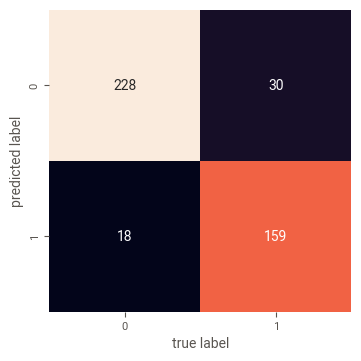

In [224]:
mat_T = confusion_matrix(y_valid,pred)
sns.heatmap(mat_T, square=True, annot=True,fmt='d',cbar=False)
plt.xlabel('true label')
plt.ylabel('predicted label');

## Support Vector Machine

In [225]:
from sklearn.svm import SVC

In [226]:
svm = SVC(random_state=101)

In [227]:
svm.fit(X_train,y_train)

SVC(random_state=101)

In [228]:
pred = svm.predict(X_valid)

In [229]:
df_eval = pd.DataFrame({'Label':y_valid,
                        'Prediction': pred
                        })
df_eval

,Label,Prediction
3857,0,0
3011,0,0
1838,1,0
1824,1,0
2283,1,0
...,...,...
2241,1,0
2258,1,0
2047,1,0
72,0,0


In [230]:
print('Score:\n',svm.score(X_valid,y_valid),'\n')

from sklearn.metrics import confusion_matrix
print('Confusion Matrix:\n',confusion_matrix(y_valid,pred),'\n')

from sklearn.metrics import classification_report
print('Classification Report:\n',classification_report(y_valid,pred))

Score:
 0.593103448275862 

Confusion Matrix:
 [[258   0]
 [177   0]] 

Classification Report:
               precision    recall  f1-score   support

           0       0.59      1.00      0.74       258
           1       0.00      0.00      0.00       177

    accuracy                           0.59       435
   macro avg       0.30      0.50      0.37       435
weighted avg       0.35      0.59      0.44       435



In [231]:
df_eval[df_eval['Label'] != df_eval['Prediction']]

,Label,Prediction
1838,1,0
1824,1,0
2283,1,0
2003,1,0
979,1,0
...,...,...
1426,1,0
595,1,0
2241,1,0
2258,1,0


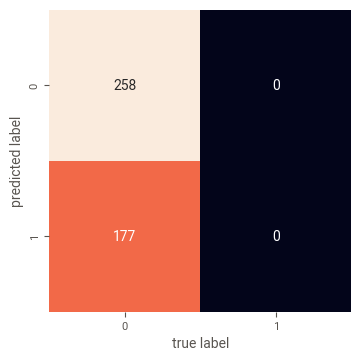

In [232]:
mat_T = confusion_matrix(y_valid,pred)
sns.heatmap(mat_T, square=True, annot=True,fmt='d',cbar=False)
plt.xlabel('true label')
plt.ylabel('predicted label');

### Hyper Parameter For Support Vector Machine Classification

In [233]:
param_grid = {'C':[0.001,0.01,0.1,1,10,100,1000],'gamma':[100,10,1,0.1,0.01,0.001,0.0001]}

In [234]:
from sklearn.model_selection import GridSearchCV

In [235]:
grid3 = GridSearchCV(SVC(random_state=101),param_grid,refit=True,verbose=3)

In [236]:
grid3.fit(X_train,y_train)

Fitting 5 folds for each of 49 candidates, totalling 245 fits
[CV 1/5] END ................C=0.001, gamma=100;, score=0.592 total time=   1.0s
[CV 2/5] END ................C=0.001, gamma=100;, score=0.590 total time=   0.8s
[CV 3/5] END ................C=0.001, gamma=100;, score=0.590 total time=   0.8s
[CV 4/5] END ................C=0.001, gamma=100;, score=0.591 total time=   0.8s
[CV 5/5] END ................C=0.001, gamma=100;, score=0.591 total time=   0.9s
[CV 1/5] END .................C=0.001, gamma=10;, score=0.592 total time=   0.8s
[CV 2/5] END .................C=0.001, gamma=10;, score=0.590 total time=   0.9s
[CV 3/5] END .................C=0.001, gamma=10;, score=0.590 total time=   0.9s
[CV 4/5] END .................C=0.001, gamma=10;, score=0.591 total time=   1.0s
[CV 5/5] END .................C=0.001, gamma=10;, score=0.591 total time=   1.0s
[CV 1/5] END ..................C=0.001, gamma=1;, score=0.592 total time=   0.6s
[CV 2/5] END ..................C=0.001, gamma=1

[CV 2/5] END ...............C=0.1, gamma=0.0001;, score=0.590 total time=   0.3s
[CV 3/5] END ...............C=0.1, gamma=0.0001;, score=0.590 total time=   0.3s
[CV 4/5] END ...............C=0.1, gamma=0.0001;, score=0.591 total time=   0.3s
[CV 5/5] END ...............C=0.1, gamma=0.0001;, score=0.591 total time=   0.3s
[CV 1/5] END ....................C=1, gamma=100;, score=0.597 total time=   0.8s
[CV 2/5] END ....................C=1, gamma=100;, score=0.597 total time=   0.8s
[CV 3/5] END ....................C=1, gamma=100;, score=0.593 total time=   0.8s
[CV 4/5] END ....................C=1, gamma=100;, score=0.594 total time=   0.8s
[CV 5/5] END ....................C=1, gamma=100;, score=0.594 total time=   0.8s
[CV 1/5] END .....................C=1, gamma=10;, score=0.597 total time=   0.8s
[CV 2/5] END .....................C=1, gamma=10;, score=0.597 total time=   0.8s
[CV 3/5] END .....................C=1, gamma=10;, score=0.593 total time=   0.8s
[CV 4/5] END ...............

[CV 4/5] END ................C=100, gamma=0.001;, score=0.878 total time=   0.3s
[CV 5/5] END ................C=100, gamma=0.001;, score=0.878 total time=   0.3s
[CV 1/5] END ...............C=100, gamma=0.0001;, score=0.843 total time=   0.3s
[CV 2/5] END ...............C=100, gamma=0.0001;, score=0.892 total time=   0.3s
[CV 3/5] END ...............C=100, gamma=0.0001;, score=0.849 total time=   0.3s
[CV 4/5] END ...............C=100, gamma=0.0001;, score=0.877 total time=   0.3s
[CV 5/5] END ...............C=100, gamma=0.0001;, score=0.882 total time=   0.3s
[CV 1/5] END .................C=1000, gamma=100;, score=0.597 total time=   0.9s
[CV 2/5] END .................C=1000, gamma=100;, score=0.597 total time=   0.8s
[CV 3/5] END .................C=1000, gamma=100;, score=0.593 total time=   0.8s
[CV 4/5] END .................C=1000, gamma=100;, score=0.594 total time=   1.1s
[CV 5/5] END .................C=1000, gamma=100;, score=0.594 total time=   0.9s
[CV 1/5] END ...............

GridSearchCV(estimator=SVC(random_state=101),
             param_grid={'C': [0.001, 0.01, 0.1, 1, 10, 100, 1000],
                         'gamma': [100, 10, 1, 0.1, 0.01, 0.001, 0.0001]},
             verbose=3)

In [237]:
grid3.best_params_

{'C': 1000, 'gamma': 0.001}

In [238]:
pred = grid3.predict(X_valid)

In [239]:
print('Score:\n',grid3.score(X_valid,y_valid),'\n')

from sklearn.metrics import confusion_matrix
print('Confusion Matrix:\n',confusion_matrix(y_valid,pred),'\n')

from sklearn.metrics import classification_report
print('Classification Report:\n',classification_report(y_valid,pred))

Score:
 0.8620689655172413 

Confusion Matrix:
 [[216  42]
 [ 18 159]] 

Classification Report:
               precision    recall  f1-score   support

           0       0.92      0.84      0.88       258
           1       0.79      0.90      0.84       177

    accuracy                           0.86       435
   macro avg       0.86      0.87      0.86       435
weighted avg       0.87      0.86      0.86       435



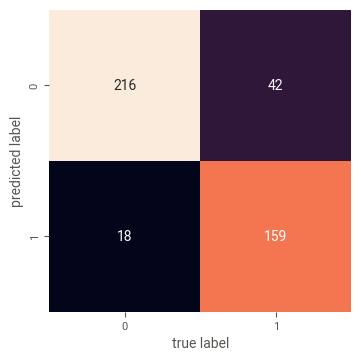

In [240]:
mat_T = confusion_matrix(y_valid,pred)
sns.heatmap(mat_T, square=True, annot=True,fmt='d',cbar=False)
plt.xlabel('true label')
plt.ylabel('predicted label');

In [241]:
df_eval = pd.DataFrame({'Label':y_valid,
                        'Prediction': pred
                        })
df_eval

,Label,Prediction
3857,0,0
3011,0,0
1838,1,1
1824,1,1
2283,1,1
...,...,...
2241,1,1
2258,1,1
2047,1,1
72,0,1


In [242]:
df_eval[df_eval['Label'] != df_eval['Prediction']]

,Label,Prediction
1749,0,1
450,0,1
92,0,1
1089,1,0
128,0,1
1973,0,1
1356,1,0
81,0,1
620,0,1
818,0,1


## Gaussian Naive Bayes

In [243]:
from sklearn.naive_bayes import GaussianNB

In [244]:
gnb = GaussianNB()

In [245]:
gnb.fit(X_train, y_train)

GaussianNB()

In [246]:
pred = gnb.predict(X_valid)

In [247]:
print("Number of mislabeled points out of a total %d points : %d" % (X_valid.shape[0], (y_valid != pred).sum()))

Number of mislabeled points out of a total 435 points : 56


In [248]:
print('Score:\n',gnb.score(X_valid,y_valid),'\n')

from sklearn.metrics import confusion_matrix
print('Confusion Matrix:\n',confusion_matrix(y_valid,pred),'\n')

from sklearn.metrics import classification_report
print('Classification Report:\n',classification_report(y_valid,pred))

Score:
 0.871264367816092 

Confusion Matrix:
 [[224  34]
 [ 22 155]] 

Classification Report:
               precision    recall  f1-score   support

           0       0.91      0.87      0.89       258
           1       0.82      0.88      0.85       177

    accuracy                           0.87       435
   macro avg       0.87      0.87      0.87       435
weighted avg       0.87      0.87      0.87       435



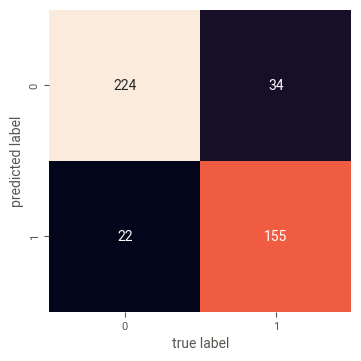

In [249]:
mat_T = confusion_matrix(y_valid,pred)
sns.heatmap(mat_T, square=True, annot=True,fmt='d',cbar=False)
plt.xlabel('true label')
plt.ylabel('predicted label');

## Bernoulli Naive Bayes

In [250]:
from sklearn.naive_bayes import BernoulliNB
bnb = BernoulliNB()
bnb.fit(X_train, y_train)
pred = bnb.predict(X_valid)

In [251]:
print("Number of mislabeled points out of a total %d points : %d" % (X_valid.shape[0], (y_valid != pred).sum()))

Number of mislabeled points out of a total 435 points : 128


In [252]:
print('Score:\n',bnb.score(X_valid,y_valid),'\n')

from sklearn.metrics import confusion_matrix
print('Confusion Matrix:\n',confusion_matrix(y_valid,pred),'\n')

from sklearn.metrics import classification_report
print('Classification Report:\n',classification_report(y_valid,pred))

Score:
 0.7057471264367816 

Confusion Matrix:
 [[208  50]
 [ 78  99]] 

Classification Report:
               precision    recall  f1-score   support

           0       0.73      0.81      0.76       258
           1       0.66      0.56      0.61       177

    accuracy                           0.71       435
   macro avg       0.70      0.68      0.69       435
weighted avg       0.70      0.71      0.70       435



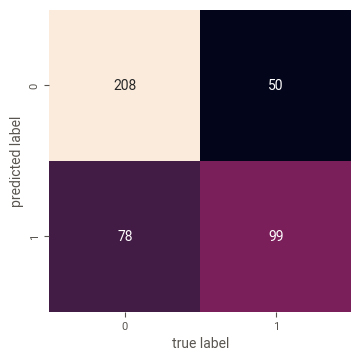

In [253]:
mat_T = confusion_matrix(y_valid,pred)
sns.heatmap(mat_T, square=True, annot=True,fmt='d',cbar=False)
plt.xlabel('true label')
plt.ylabel('predicted label');

### Hyper Paramets For Bernoulli Naive Bayes

In [254]:
param_grid = {'alpha':[100,50,10,1,0.1,0.001,0.0001]}

In [255]:
from sklearn.model_selection import GridSearchCV
grid4 = GridSearchCV(BernoulliNB(),param_grid,refit=True,verbose=3)
grid4.fit(X_train,y_train)
pred = grid4.predict(X_valid)

Fitting 5 folds for each of 7 candidates, totalling 35 fits
[CV 1/5] END .........................alpha=100;, score=0.697 total time=   0.0s
[CV 2/5] END .........................alpha=100;, score=0.708 total time=   0.0s
[CV 3/5] END .........................alpha=100;, score=0.711 total time=   0.0s
[CV 4/5] END .........................alpha=100;, score=0.686 total time=   0.0s
[CV 5/5] END .........................alpha=100;, score=0.713 total time=   0.0s
[CV 1/5] END ..........................alpha=50;, score=0.693 total time=   0.0s
[CV 2/5] END ..........................alpha=50;, score=0.698 total time=   0.0s
[CV 3/5] END ..........................alpha=50;, score=0.702 total time=   0.0s
[CV 4/5] END ..........................alpha=50;, score=0.677 total time=   0.0s
[CV 5/5] END ..........................alpha=50;, score=0.721 total time=   0.0s
[CV 1/5] END ..........................alpha=10;, score=0.710 total time=   0.0s
[CV 2/5] END ..........................alpha=10;,

In [256]:
grid4.best_params_

{'alpha': 0.1}

In [257]:
print('Score:\n',grid4.score(X_valid,y_valid),'\n')

from sklearn.metrics import confusion_matrix
print('Confusion Matrix:\n',confusion_matrix(y_valid,pred),'\n')

from sklearn.metrics import classification_report
print('Classification Report:\n',classification_report(y_valid,pred))

Score:
 0.7057471264367816 

Confusion Matrix:
 [[208  50]
 [ 78  99]] 

Classification Report:
               precision    recall  f1-score   support

           0       0.73      0.81      0.76       258
           1       0.66      0.56      0.61       177

    accuracy                           0.71       435
   macro avg       0.70      0.68      0.69       435
weighted avg       0.70      0.71      0.70       435



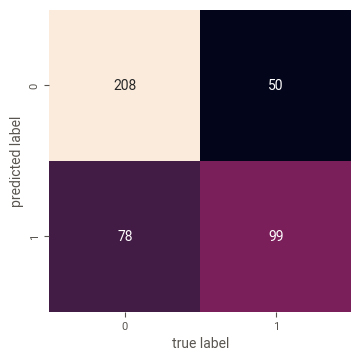

In [258]:
mat_T = confusion_matrix(y_valid,pred)
sns.heatmap(mat_T, square=True, annot=True,fmt='d',cbar=False)
plt.xlabel('true label')
plt.ylabel('predicted label');

## Bagging Classifier Algorithm

In [259]:
from sklearn.ensemble import BaggingClassifier

In [260]:
bca = BaggingClassifier(RandomForestClassifier(criterion='entropy', n_estimators=150,random_state=101),random_state=101)

In [261]:
bca.fit(X_train, y_train)

BaggingClassifier(estimator=RandomForestClassifier(criterion='entropy',
                                                   n_estimators=150,
                                                   random_state=101),
                  random_state=101)

In [262]:
pred = bca.predict(X_valid)

In [263]:
print('Score:\n',bca.score(X_valid,y_valid),'\n')

from sklearn.metrics import confusion_matrix
print('Confusion Matrix:\n',confusion_matrix(y_valid,pred),'\n')

from sklearn.metrics import classification_report
print('Classification Report:\n',classification_report(y_valid,pred))

Score:
 0.8850574712643678 

Confusion Matrix:
 [[224  34]
 [ 16 161]] 

Classification Report:
               precision    recall  f1-score   support

           0       0.93      0.87      0.90       258
           1       0.83      0.91      0.87       177

    accuracy                           0.89       435
   macro avg       0.88      0.89      0.88       435
weighted avg       0.89      0.89      0.89       435



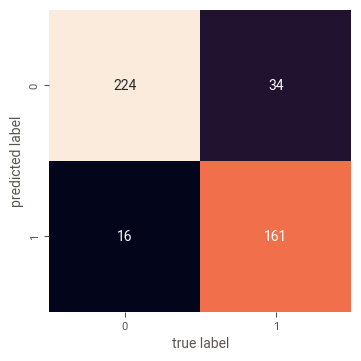

In [264]:
mat_T = confusion_matrix(y_valid,pred)
sns.heatmap(mat_T, square=True, annot=True, fmt='d', cbar=False)
plt.xlabel('true label')
plt.ylabel('predicted label');

## Gradient Boosting Classifier Algorithm

In [265]:
from sklearn.ensemble import GradientBoostingClassifier

In [266]:
gbc = GradientBoostingClassifier(random_state=101)

In [267]:
gbc.fit(X_train, y_train)

GradientBoostingClassifier(random_state=101)

In [268]:
pred = gbc.predict(X_valid)

In [269]:
print('Score:\n',gbc.score(X_valid,y_valid),'\n')

from sklearn.metrics import confusion_matrix
print('Confusion Matrix:\n',confusion_matrix(y_valid,pred),'\n')

from sklearn.metrics import classification_report
print('Classification Report:\n',classification_report(y_valid,pred))

Score:
 0.8919540229885058 

Confusion Matrix:
 [[224  34]
 [ 13 164]] 

Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.87      0.91       258
           1       0.83      0.93      0.87       177

    accuracy                           0.89       435
   macro avg       0.89      0.90      0.89       435
weighted avg       0.90      0.89      0.89       435



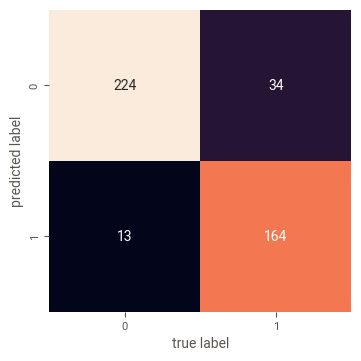

In [270]:
mat_T = confusion_matrix(y_valid,pred)
sns.heatmap(mat_T, square=True, annot=True, fmt='d', cbar=False)
plt.xlabel('true label')
plt.ylabel('predicted label');

## XGboost Classifier

In [271]:
from xgboost import XGBClassifier

In [272]:
from sklearn.metrics import accuracy_score

In [273]:
xgb = XGBClassifier()

In [274]:
xgb.fit(X_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=None, ...)

In [275]:
pred = xgb.predict(X_valid)

In [276]:
predictions = [round(value) for value in pred]

In [277]:
accuracy = accuracy_score(y_valid, predictions)
print("Accuracy: %.3f%%" % (accuracy * 100.0))

Accuracy: 86.897%


In [278]:
print('Score:\n',xgb.score(X_valid,y_valid),'\n')

from sklearn.metrics import confusion_matrix
print('Confusion Matrix:\n',confusion_matrix(y_valid,pred),'\n')

from sklearn.metrics import classification_report
print('Classification Report:\n',classification_report(y_valid,pred))

Score:
 0.8689655172413793 

Confusion Matrix:
 [[227  31]
 [ 26 151]] 

Classification Report:
               precision    recall  f1-score   support

           0       0.90      0.88      0.89       258
           1       0.83      0.85      0.84       177

    accuracy                           0.87       435
   macro avg       0.86      0.87      0.86       435
weighted avg       0.87      0.87      0.87       435



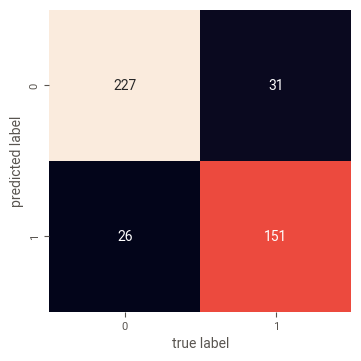

In [279]:
mat_T = confusion_matrix(y_valid,pred)
sns.heatmap(mat_T, square=True, annot=True, fmt='d', cbar=False)
plt.xlabel('true label')
plt.ylabel('predicted label');

## Voting Classifier

In [280]:
from sklearn.ensemble import VotingClassifier

In [281]:
model_1 = GradientBoostingClassifier(random_state=101)
model_1.fit(X_train, y_train)
pred_1 = model_1.predict(X_valid)

In [282]:
model_2 = RandomForestClassifier(criterion='entropy',n_estimators=150,random_state=101)
model_2.fit(X_train, y_train)
pred_2 = model_2.predict(X_valid)

In [283]:
model_3 = GaussianNB()
model_3.fit(X_train, y_train)
pred_3 = model_3.predict(X_valid)

In [284]:
eclf = VotingClassifier(estimators=[('Gradient Boosting', model_1),
                                    ('Random Forest', model_2),
                                    ('Gaussian Naive Bayes', model_3)]
                        ,voting='hard')

In [285]:
from sklearn.model_selection import cross_val_score

In [286]:
for clf, label in zip([model_1, model_2, model_3, eclf], ['Gradient Boosting', 'Random Forest', 'Gaussian Naive Bayes', 
                                                          'Ensemble']):

    scores = cross_val_score(clf, X_valid, y_valid, scoring='accuracy', cv=5)

    print("Accuracy: %0.3f (+/- %0.3f) [%s]" % (scores.mean(), scores.std(), label))

Accuracy: 0.880 (+/- 0.044) [Gradient Boosting]
Accuracy: 0.876 (+/- 0.038) [Random Forest]
Accuracy: 0.818 (+/- 0.061) [Gaussian Naive Bayes]
Accuracy: 0.878 (+/- 0.042) [Ensemble]


# Test Models

In [287]:
X_trainValid = pd.concat([X_train,X_valid],axis=0)

In [288]:
X_trainValid

,NOI_1,NOI_2,NOI_3,POB_1,POB_2,POB_3,POB_4,ET_1,ET_2,ET_3,...,HF_3,EDOW_1,EDOW_2,EDOW_3,Event Day,Event Month,Event Year,Hour,Minutes,Task Assigned_Regularly Assigned
3567,0,0,1,0,0,1,0,1,0,0,...,0,0,0,1,23,4,2016,7,15,0
3483,0,0,1,0,1,0,0,1,0,0,...,1,0,0,1,11,5,2016,8,15,0
3588,1,0,0,0,0,1,0,1,0,0,...,1,1,0,0,18,4,2016,8,30,1
335,1,0,0,0,0,1,0,1,0,0,...,0,0,1,0,14,4,2017,7,30,1
2910,0,1,0,0,0,1,0,1,0,0,...,0,0,1,0,1,9,2016,17,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2241,0,0,1,0,1,0,0,1,0,0,...,0,0,1,0,5,1,2017,11,15,0
2258,0,0,1,1,0,0,0,1,0,0,...,0,0,0,1,4,1,2017,12,15,1
2047,0,1,0,0,0,1,0,1,0,0,...,0,0,1,0,17,1,2017,15,30,0
72,0,1,0,0,0,0,1,1,0,0,...,0,0,1,0,16,5,2017,17,15,0


In [289]:
y_trainValid = pd.concat([y_train,y_valid],axis=0)

In [290]:
y_trainValid

3567    0
3483    0
3588    0
335     1
2910    0
       ..
2241    1
2258    1
2047    1
72      0
2116    0
Name: Degree of Injury_Nonfatal, Length: 3483, dtype: uint8

## 0. Logistic Regression

In [291]:
model_0 = LogisticRegression(random_state=101)
model_0.fit(X_trainValid, y_trainValid)

LogisticRegression(random_state=101)

In [292]:
from sklearn.model_selection import ShuffleSplit
n_samples = X_trainValid.shape[0]
cv = ShuffleSplit(n_splits=5, test_size=0.3, random_state=101)
scores = cross_val_score(model_0, X_trainValid, y_trainValid, cv=cv)
print(scores)
print("%0.3f accuracy with a standard deviation of %0.3f" % (scores.mean(), scores.std()))

[0.78373206 0.77511962 0.80956938 0.80191388 0.77799043]
0.790 accuracy with a standard deviation of 0.014


In [293]:
pred_0 = model_0.predict(X_test)

In [294]:
print('Score:\n',model_0.score(X_test,y_test),'\n')

from sklearn.metrics import confusion_matrix
print('Confusion Matrix:\n',confusion_matrix(y_test,pred_0),'\n')

from sklearn.metrics import classification_report
print('Classification Report:\n',classification_report(y_test,pred_0))

Score:
 0.7729357798165137 

Confusion Matrix:
 [[419 112]
 [ 86 255]] 

Classification Report:
               precision    recall  f1-score   support

           0       0.83      0.79      0.81       531
           1       0.69      0.75      0.72       341

    accuracy                           0.77       872
   macro avg       0.76      0.77      0.76       872
weighted avg       0.78      0.77      0.77       872



## 1. Random Forest Classifier

In [295]:
model_1 = RandomForestClassifier(criterion='entropy',n_estimators=150,random_state=101)
model_1.fit(X_trainValid, y_trainValid)

RandomForestClassifier(criterion='entropy', n_estimators=150, random_state=101)

In [296]:
from sklearn.model_selection import ShuffleSplit
n_samples = X_trainValid.shape[0]
cv = ShuffleSplit(n_splits=5, test_size=0.3, random_state=101)
scores = cross_val_score(model_1, X_trainValid, y_trainValid, cv=cv)
print(scores)
print("%0.3f accuracy with a standard deviation of %0.3f" % (scores.mean(), scores.std()))

[0.88038278 0.87655502 0.88708134 0.89760766 0.86794258]
0.882 accuracy with a standard deviation of 0.010


In [297]:
pred_1 = model_1.predict(X_test)

In [298]:
print('Score:\n',model_1.score(X_test,y_test),'\n')

from sklearn.metrics import confusion_matrix
print('Confusion Matrix:\n',confusion_matrix(y_test,pred_1),'\n')

from sklearn.metrics import classification_report
print('Classification Report:\n',classification_report(y_test,pred_1))

Score:
 0.875 

Confusion Matrix:
 [[463  68]
 [ 41 300]] 

Classification Report:
               precision    recall  f1-score   support

           0       0.92      0.87      0.89       531
           1       0.82      0.88      0.85       341

    accuracy                           0.88       872
   macro avg       0.87      0.88      0.87       872
weighted avg       0.88      0.88      0.88       872



## 2. XGboost Classifier

In [299]:
model_2 = XGBClassifier()
model_2.fit(X_trainValid, y_trainValid)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=None, ...)

In [300]:
from sklearn.model_selection import ShuffleSplit
n_samples = X_trainValid.shape[0]
cv = ShuffleSplit(n_splits=5, test_size=0.3, random_state=101)
scores = cross_val_score(model_2, X_trainValid, y_trainValid, cv=cv)
print(scores)
print("%0.3f accuracy with a standard deviation of %0.3f" % (scores.mean(), scores.std()))

[0.87272727 0.86028708 0.87751196 0.89090909 0.86124402]
0.873 accuracy with a standard deviation of 0.011


In [301]:
pred_2 = model_2.predict(X_test)

In [302]:
print('Score:\n',model_2.score(X_test,y_test),'\n')

from sklearn.metrics import confusion_matrix
print('Confusion Matrix:\n',confusion_matrix(y_test,pred_2),'\n')

from sklearn.metrics import classification_report
print('Classification Report:\n',classification_report(y_test,pred_2))

Score:
 0.8646788990825688 

Confusion Matrix:
 [[465  66]
 [ 52 289]] 

Classification Report:
               precision    recall  f1-score   support

           0       0.90      0.88      0.89       531
           1       0.81      0.85      0.83       341

    accuracy                           0.86       872
   macro avg       0.86      0.86      0.86       872
weighted avg       0.87      0.86      0.87       872



## 3. Gradient Boosting Classifier

In [303]:
model_3 = GradientBoostingClassifier(random_state=101)
model_3.fit(X_trainValid, y_trainValid)

GradientBoostingClassifier(random_state=101)

In [304]:
from sklearn.model_selection import ShuffleSplit
n_samples = X_trainValid.shape[0]
cv = ShuffleSplit(n_splits=5, test_size=0.3, random_state=101)
scores = cross_val_score(model_3, X_trainValid, y_trainValid, cv=cv)
print(scores)
print("%0.3f accuracy with a standard deviation of %0.3f" % (scores.mean(), scores.std()))

[0.88325359 0.87942584 0.89186603 0.90047847 0.8708134 ]
0.885 accuracy with a standard deviation of 0.010


In [305]:
pred_3 = model_3.predict(X_test)

In [306]:
print('Score:\n',model_3.score(X_test,y_test),'\n')

from sklearn.metrics import confusion_matrix
print('Confusion Matrix:\n',confusion_matrix(y_test,pred_3),'\n')

from sklearn.metrics import classification_report
print('Classification Report:\n',classification_report(y_test,pred_3))

Score:
 0.8692660550458715 

Confusion Matrix:
 [[453  78]
 [ 36 305]] 

Classification Report:
               precision    recall  f1-score   support

           0       0.93      0.85      0.89       531
           1       0.80      0.89      0.84       341

    accuracy                           0.87       872
   macro avg       0.86      0.87      0.87       872
weighted avg       0.88      0.87      0.87       872



## 4. Bagging Classifier

In [307]:
model_4 = BaggingClassifier()
model_4.fit(X_trainValid, y_trainValid)

BaggingClassifier()

In [308]:
from sklearn.model_selection import ShuffleSplit
n_samples = X_trainValid.shape[0]
cv = ShuffleSplit(n_splits=5, test_size=0.3, random_state=101)
scores = cross_val_score(model_4, X_trainValid, y_trainValid, cv=cv)
print(scores)
print("%0.3f accuracy with a standard deviation of %0.3f" % (scores.mean(), scores.std()))

[0.85645933 0.86602871 0.86124402 0.86602871 0.86602871]
0.863 accuracy with a standard deviation of 0.004


In [309]:
pred_4 = model_4.predict(X_test)

In [310]:
print('Score:\n',model_4.score(X_test,y_test),'\n')

from sklearn.metrics import confusion_matrix
print('Confusion Matrix:\n',confusion_matrix(y_test,pred_4),'\n')

from sklearn.metrics import classification_report
print('Classification Report:\n',classification_report(y_test,pred_4))

Score:
 0.8658256880733946 

Confusion Matrix:
 [[474  57]
 [ 60 281]] 

Classification Report:
               precision    recall  f1-score   support

           0       0.89      0.89      0.89       531
           1       0.83      0.82      0.83       341

    accuracy                           0.87       872
   macro avg       0.86      0.86      0.86       872
weighted avg       0.87      0.87      0.87       872



## 5. Support Vector Machine

In [311]:
model_5 = SVC(C=1000,gamma=0.001,random_state=101)
model_5.fit(X_trainValid, y_trainValid)

SVC(C=1000, gamma=0.001, random_state=101)

In [312]:
from sklearn.model_selection import ShuffleSplit
n_samples = X_trainValid.shape[0]
cv = ShuffleSplit(n_splits=5, test_size=0.3, random_state=101)
scores = cross_val_score(model_5, X_trainValid, y_trainValid, cv=cv)
print(scores)
print("%0.3f accuracy with a standard deviation of %0.3f" % (scores.mean(), scores.std()))

[0.85645933 0.85837321 0.86794258 0.8861244  0.85358852]
0.864 accuracy with a standard deviation of 0.012


In [313]:
pred_5 = model_5.predict(X_test)

In [314]:
print('Score:\n',model_5.score(X_test,y_test),'\n')

from sklearn.metrics import confusion_matrix
print('Confusion Matrix:\n',confusion_matrix(y_test,pred_5),'\n')

from sklearn.metrics import classification_report
print('Classification Report:\n',classification_report(y_test,pred_5))

Score:
 0.8394495412844036 

Confusion Matrix:
 [[434  97]
 [ 43 298]] 

Classification Report:
               precision    recall  f1-score   support

           0       0.91      0.82      0.86       531
           1       0.75      0.87      0.81       341

    accuracy                           0.84       872
   macro avg       0.83      0.85      0.84       872
weighted avg       0.85      0.84      0.84       872



## 6. Decision Tree Classifier

In [315]:
model_6 = DecisionTreeClassifier(criterion='entropy',splitter='best',random_state=101)
model_6.fit(X_trainValid, y_trainValid)

DecisionTreeClassifier(criterion='entropy', random_state=101)

In [316]:
from sklearn.model_selection import ShuffleSplit
n_samples = X_trainValid.shape[0]
cv = ShuffleSplit(n_splits=5, test_size=0.3, random_state=101)
scores = cross_val_score(model_6, X_trainValid, y_trainValid, cv=cv)
print(scores)
print("%0.3f accuracy with a standard deviation of %0.3f" % (scores.mean(), scores.std()))

[0.8277512  0.82200957 0.8354067  0.8354067  0.82870813]
0.830 accuracy with a standard deviation of 0.005


In [317]:
pred_6 = model_6.predict(X_test)

In [318]:
print('Score:\n',model_6.score(X_test,y_test),'\n')

from sklearn.metrics import confusion_matrix
print('Confusion Matrix:\n',confusion_matrix(y_test,pred_6),'\n')

from sklearn.metrics import classification_report
print('Classification Report:\n',classification_report(y_test,pred_6))

Score:
 0.8428899082568807 

Confusion Matrix:
 [[458  73]
 [ 64 277]] 

Classification Report:
               precision    recall  f1-score   support

           0       0.88      0.86      0.87       531
           1       0.79      0.81      0.80       341

    accuracy                           0.84       872
   macro avg       0.83      0.84      0.84       872
weighted avg       0.84      0.84      0.84       872



## 7. Gaussian Naive Bayes 

In [319]:
model_7 = GaussianNB()
model_7.fit(X_trainValid, y_trainValid)

GaussianNB()

In [320]:
from sklearn.model_selection import ShuffleSplit
n_samples = X_trainValid.shape[0]
cv = ShuffleSplit(n_splits=5, test_size=0.3, random_state=101)
scores = cross_val_score(model_7, X_trainValid, y_trainValid, cv=cv)
print(scores)
print("%0.3f accuracy with a standard deviation of %0.3f" % (scores.mean(), scores.std()))

[0.86315789 0.85263158 0.85741627 0.87464115 0.85454545]
0.860 accuracy with a standard deviation of 0.008


In [321]:
pred_7 = model_7.predict(X_test)

In [322]:
print('Score:\n',model_7.score(X_test,y_test),'\n')

from sklearn.metrics import confusion_matrix
print('Confusion Matrix:\n',confusion_matrix(y_test,pred_7),'\n')

from sklearn.metrics import classification_report
print('Classification Report:\n',classification_report(y_test,pred_7))

Score:
 0.841743119266055 

Confusion Matrix:
 [[448  83]
 [ 55 286]] 

Classification Report:
               precision    recall  f1-score   support

           0       0.89      0.84      0.87       531
           1       0.78      0.84      0.81       341

    accuracy                           0.84       872
   macro avg       0.83      0.84      0.84       872
weighted avg       0.85      0.84      0.84       872



## 8. Bernoulli Naive Bayes

In [323]:
model_8 = BernoulliNB(alpha=0.1)
model_8.fit(X_trainValid, y_trainValid)

BernoulliNB(alpha=0.1)

In [324]:
from sklearn.model_selection import ShuffleSplit
n_samples = X_trainValid.shape[0]
cv = ShuffleSplit(n_splits=5, test_size=0.3, random_state=101)
scores = cross_val_score(model_8, X_trainValid, y_trainValid, cv=cv)
print(scores)
print("%0.3f accuracy with a standard deviation of %0.3f" % (scores.mean(), scores.std()))

[0.71578947 0.69665072 0.70334928 0.71770335 0.71961722]
0.711 accuracy with a standard deviation of 0.009


In [325]:
pred_8 = model_8.predict(X_test)

In [326]:
print('Score:\n',model_8.score(X_test,y_test),'\n')

from sklearn.metrics import confusion_matrix
print('Confusion Matrix:\n',confusion_matrix(y_test,pred_8),'\n')

from sklearn.metrics import classification_report
print('Classification Report:\n',classification_report(y_test,pred_8))

Score:
 0.7018348623853211 

Confusion Matrix:
 [[428 103]
 [157 184]] 

Classification Report:
               precision    recall  f1-score   support

           0       0.73      0.81      0.77       531
           1       0.64      0.54      0.59       341

    accuracy                           0.70       872
   macro avg       0.69      0.67      0.68       872
weighted avg       0.70      0.70      0.70       872



## 9. Voting Classifier

In [327]:
eclf = VotingClassifier(estimators=[('Random Forest', model_1),
                                    ('Gradient Boosting Classifier', model_3),
                                    ('XGboost Classifier', model_2)]
                        ,voting='hard')
eclf.fit(X_trainValid, y_trainValid)

VotingClassifier(estimators=[('Random Forest',
                              RandomForestClassifier(criterion='entropy',
                                                     n_estimators=150,
                                                     random_state=101)),
                             ('Gradient Boosting Classifier',
                              GradientBoostingClassifier(random_state=101)),
                             ('XGboost Classifier',
                              XGBClassifier(base_score=None, booster=None,
                                            callbacks=None,
                                            colsample_bylevel=None,
                                            colsample_bynode=None,
                                            colsample_bytree=None,
                                            earl...
                                            gpu_id=None, grow_policy=None,
                                            importance_type=None,
                                            interaction_constraints=None,
                                            learning_rate=None, max_bin=None,
                                            max_cat_threshold=None,
                                            max_cat_to_onehot=None,
                                            max_delta_step=None, max_depth=None,
                                            max_leaves=None,
                                            min_child_weight=None, missing=nan,
                                            monotone_constraints=None,
                                            n_estimators=100, n_jobs=None,
                                            num_parallel_tree=None,
                                            predictor=None, random_state=None, ...))])

In [328]:
from sklearn.model_selection import ShuffleSplit
n_samples = X_trainValid.shape[0]
cv = ShuffleSplit(n_splits=5, test_size=0.3, random_state=101)
scores = cross_val_score(eclf, X_trainValid, y_trainValid, cv=cv)
print(scores)
print("%0.3f accuracy with a standard deviation of %0.3f" % (scores.mean(), scores.std()))

[0.88229665 0.87559809 0.89282297 0.90143541 0.86602871]
0.884 accuracy with a standard deviation of 0.012


In [329]:
pred_9 = eclf.predict(X_test)

In [330]:
print('Score:\n',eclf.score(X_test,y_test),'\n')

from sklearn.metrics import confusion_matrix
print('Confusion Matrix:\n',confusion_matrix(y_test,pred_9),'\n')

from sklearn.metrics import classification_report
print('Classification Report:\n',classification_report(y_test,pred_9))

Score:
 0.8681192660550459 

Confusion Matrix:
 [[456  75]
 [ 40 301]] 

Classification Report:
               precision    recall  f1-score   support

           0       0.92      0.86      0.89       531
           1       0.80      0.88      0.84       341

    accuracy                           0.87       872
   macro avg       0.86      0.87      0.86       872
weighted avg       0.87      0.87      0.87       872



# Cross Validation: Evaluating Estimator Performance

In [331]:
X = pd.concat([X_train,X_valid,X_test],axis=0)

In [332]:
y = pd.concat([y_train,y_valid,y_test],axis=0)

In [333]:
from sklearn.model_selection import cross_val_score

In [334]:
from sklearn import metrics

In [335]:
from sklearn.model_selection import ShuffleSplit
n_samples = X_train.shape[0]
cv = ShuffleSplit(n_splits=5, test_size=0.3, random_state=101)
scores = cross_val_score(model_1, X, y, cv=cv)
scores

array([0.88293803, 0.88752869, 0.87681714, 0.88523336, 0.87911247])

In [336]:
for train_index, test_index in cv.split(X):
    print("%s %s" % (train_index, test_index))

[3231 3156 3250 ...  599 1361 1547] [2178  877  983 ... 1331 4238 2745]
[ 665 4013  151 ... 1162 4243  865] [3853 1888   59 ... 3003 1878  992]
[ 586 1049  193 ... 4245 2452 1716] [1069 4192 3631 ... 2796 3625  932]
[  61 3467 1251 ...  726 2370 1722] [1063 3773 4015 ... 1295 4253 2452]
[3495 4146 3630 ... 3743 2085 1508] [1438 1269 3025 ... 2906 2159  984]


In [337]:
print("%0.3f accuracy with a standard deviation of %0.3f" % (scores.mean(), scores.std()))

0.882 accuracy with a standard deviation of 0.004


# Comparing Machine Learning Algorithms

In [338]:
from sklearn.metrics import roc_curve
from sklearn.metrics import auc
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score

In [339]:
MLA = [model_0,model_1,model_2,model_3,model_4,model_5,model_6,model_7,model_8,eclf]

In [340]:
MLA_columns = []
MLA_compare = pd.DataFrame(columns = MLA_columns)

row_index = 0
for alg in MLA:  
    
    predicted = alg.fit(X_trainValid, y_trainValid).predict(X_test)
    fp, tp, th = roc_curve(y_test, predicted)
    MLA_name = alg.__class__.__name__
    MLA_compare.loc[row_index,'MLA used'] = MLA_name
    MLA_compare.loc[row_index, 'Train Accuracy'] = round(alg.score(X_trainValid, y_trainValid), 4)
    MLA_compare.loc[row_index, 'Test Accuracy'] = round(alg.score(X_test, y_test), 4)
    MLA_compare.loc[row_index, 'Precission'] = precision_score(y_test, predicted)
    MLA_compare.loc[row_index, 'Recall'] = recall_score(y_test, predicted)
    MLA_compare.loc[row_index, 'AUC'] = auc(fp, tp)
    MLA_compare.loc[row_index, 'F1-Score'] = f1_score(y_test, predicted)
    
    row_index+=1
    
MLA_compare.sort_values(by = ['Test Accuracy'], ascending = False, inplace = True)
MLA_compare

,MLA used,Train Accuracy,Test Accuracy,Precission,Recall,AUC,F1-Score
1,RandomForestClassifier,1.0000,0.8750,0.815217,0.879765,0.875853,0.846262
3,GradientBoostingClassifier,0.9061,0.8693,0.796345,0.894428,0.873768,0.842541
9,VotingClassifier,0.9928,0.8681,0.800532,0.882698,0.870728,0.839609
2,XGBClassifier,0.9917,0.8647,0.814085,0.847507,0.861607,0.830460
4,BaggingClassifier,0.9920,0.8544,0.809249,0.821114,0.848410,0.815138
6,DecisionTreeClassifier,1.0000,0.8429,0.791429,0.812317,0.837420,0.801737
7,GaussianNB,0.8648,0.8417,0.775068,0.838710,0.841200,0.805634
5,SVC,0.8946,0.8394,0.754430,0.873900,0.845613,0.809783
0,LogisticRegression,0.7921,0.7729,0.694823,0.747801,0.768439,0.720339
8,BernoulliNB,0.7126,0.7018,0.641115,0.539589,0.672808,0.585987


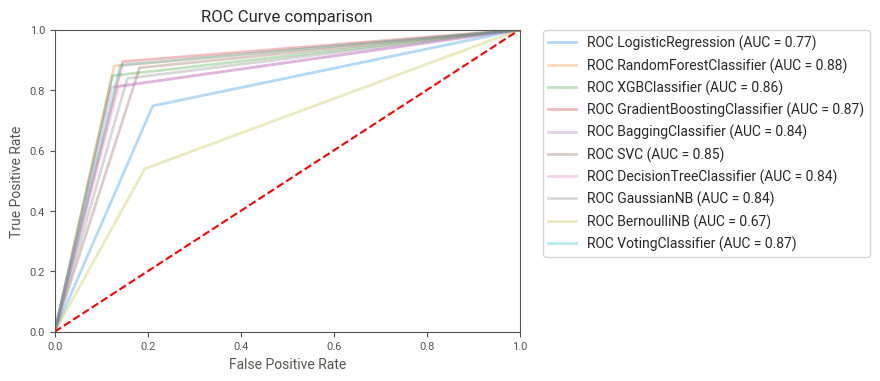

In [341]:
# Creating plot to show the ROC for all MLA
index = 1
for alg in MLA:
    
    
    predicted = alg.fit(X_trainValid, y_trainValid).predict(X_test)
    fp, tp, th = roc_curve(y_test, predicted)
    roc_auc_mla = auc(fp, tp)
    MLA_name = alg.__class__.__name__
    plt.plot(fp, tp, lw=2, alpha=0.3, label='ROC %s (AUC = %0.2f)'  % (MLA_name, roc_auc_mla))
   
    index+=1

plt.title('ROC Curve comparison')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.plot([0,1],[0,1],'r--')
plt.xlim([0,1])
plt.ylim([0,1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')    
plt.show()

# END =)